# Abstract
Hyperparameters are parameters that are specified prior to running machine learning algorithms that have a large effect on the predictive power of statistical models parameter of a prior distribution, the term which used to distinguish them from parameters of the model for the underlying system under analysis. Knowledge of the relative importance of a hyperparameter to an algorithm and its range of values is crucial to hyperparameter tuning and creating effective models.
The hyperparameter database allows users to visualize and understand how to choose hyperparameters that maximize the predictive power of their models. The hyperparameter database is created by running millions of hyperparameter values, calculating the individual conditional expectation of every hyperparameter on the quality of a model. The data science part need to generating models using H2O to find best hyperparameters.

# Background
The data we collected and stored concerns predicting housing transaction price which contains values of  cities, floors, unit area households counts and parking capacity, rooms, heat fuel, heat type and front door structure. We separated and grouped data into different entities and attributes and build the one-to-many connections between them, which presented the data in more structured and organized way and allows us to query data, sort data, and manipulate data in various ways for the future performance.

# Dataset
The dataset is from the website https://www.kaggle.com/econdata/predciting-price-transaction#trainPrice.csv . Housing price always been a popular item that people expect to predict. Since it is critical for us to find out the factors that affecting transaction price. This data set covers different aspects of factors which influence the housing price, which requires the scientific and specific method to calculate the best result. 

# Collect the data

## Import Libraries

In [1]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import datetime
import json
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random, os, sys
pd.set_option('display.float_format',lambda x : '%.5f'%x)
pd.set_option('display.max_columns',10000,
              'display.max_rows',10000)


%matplotlib inline 
import matplotlib.pyplot as plt
from scipy import stats
import matplotlib as mpl
import seaborn as sns
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

import statsmodels.api as sm
from sklearn import linear_model
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import warnings

## Clean the data
- Why we need to clean the data before input into the H2O ? <br>
Because there are catogial vaiables, null values, even missing values in the dataset which makes H2O AutoML can't function properly.

In [34]:
df=pd.read_csv("/data/trainPrice.csv", decimal = ',')

### Select the data randomly 
Since the dataset I choose has nearly 1.7 millions records, which is too huge and unnecessary for the project, so I use fraction = 0.05 to select the data randomly.

In [35]:
## Show all the data we import in DataFrame
df = df.sample(frac=0.005).reset_index(drop=True)

col_n = ['transaction_real_price', 'city', 'exclusive_use_area','floor','total_parking_capacity_in_site',
         'total_household_count_in_sites','apartment_building_count_in_sites','heat_type','heat_fuel',
         'front_door_structure','supply_area','total_household_count_of_area_type',
        'room_count','bathroom_count']

dfn = pd.DataFrame(df,columns = col_n)

dfn

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,heat_type,heat_fuel,front_door_structure,supply_area,total_household_count_of_area_type,room_count,bathroom_count
0,135000000,0,82.32,4,224.0,200,8,individual,gas,corridor,88.51,20,3.0,1.0
1,145000000,0,59.948,19,1497.0,1280,11,individual,gas,stairway,85.37,168,3.0,1.0
2,94500000,0,59.92,14,559.0,848,3,individual,gas,stairway,80.44,598,3.0,2.0
3,308000000,0,84.99,16,1573.0,1733,13,individual,gas,stairway,102.69,628,3.0,2.0
4,538000000,1,59.88,16,2173.0,2036,19,district,cogeneration,corridor,85.12,895,3.0,1.0
5,1265000000,1,115.47,3,1444.0,1848,36,district,cogeneration,corridor,143.81,102,4.0,2.0
6,206000000,0,84.98,2,243.0,170,2,individual,gas,stairway,107.32,54,3.0,2.0
7,1120000000,1,126.18,7,5540.0,5539,122,district,cogeneration,stairway,161.98,76,4.0,2.0
8,382000000,1,84.09,2,2366.0,1971,28,individual,gas,stairway,105.32,394,3.0,2.0
9,80000000,0,57.06,3,NaN,130,2,individual,gas,stairway,63.54,40,3.0,1.0


In [37]:
df=dfn
df

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,heat_type,heat_fuel,front_door_structure,supply_area,total_household_count_of_area_type,room_count,bathroom_count
0,135000000,0,82.32,4,224.0,200,8,individual,gas,corridor,88.51,20,3.0,1.0
1,145000000,0,59.948,19,1497.0,1280,11,individual,gas,stairway,85.37,168,3.0,1.0
2,94500000,0,59.92,14,559.0,848,3,individual,gas,stairway,80.44,598,3.0,2.0
3,308000000,0,84.99,16,1573.0,1733,13,individual,gas,stairway,102.69,628,3.0,2.0
4,538000000,1,59.88,16,2173.0,2036,19,district,cogeneration,corridor,85.12,895,3.0,1.0
5,1265000000,1,115.47,3,1444.0,1848,36,district,cogeneration,corridor,143.81,102,4.0,2.0
6,206000000,0,84.98,2,243.0,170,2,individual,gas,stairway,107.32,54,3.0,2.0
7,1120000000,1,126.18,7,5540.0,5539,122,district,cogeneration,stairway,161.98,76,4.0,2.0
8,382000000,1,84.09,2,2366.0,1971,28,individual,gas,stairway,105.32,394,3.0,2.0
9,80000000,0,57.06,3,NaN,130,2,individual,gas,stairway,63.54,40,3.0,1.0


In [38]:
df.describe()

,transaction_real_price,city,floor,total_household_count_in_sites,apartment_building_count_in_sites,total_household_count_of_area_type
count,8.007000e+03,8007.000000,8007.000000,8007.000000,8007.000000,8007.000000
mean,3.975305e+08,0.619708,10.206070,1165.867991,12.593106,291.045960
std,3.148733e+08,0.485489,7.229768,1098.361326,13.960753,320.597129
min,2.860000e+07,0.000000,-4.000000,100.000000,1.000000,0.000000
25%,1.957500e+08,0.000000,5.000000,408.000000,4.000000,90.000000
50%,3.250000e+08,1.000000,9.000000,812.000000,9.000000,190.000000
75%,5.000000e+08,1.000000,14.000000,1550.000000,15.000000,384.000000
max,4.800000e+09,1.000000,67.000000,6864.000000,124.000000,2960.000000


###  Caculuate the percentage of missing data
Since the percentage of the missing data is only 5%, which is 461 records over 8007 records, so I decided to delete the missing records.

In [39]:
df = df.replace('-', None)

In [40]:
# Caculuate the percentage of missing data 
total = df.isnull().sum()[df.isnull().sum() != 0].sort_values(ascending = False)
percent = pd.Series(round(total/len(df)*100,2))
pd.concat([total, percent], axis=1, keys=['total_missing', 'percent'])

,total_missing,percent
total_parking_capacity_in_site,461,5.76
front_door_structure,77,0.96
heat_fuel,48,0.60
heat_type,12,0.15
bathroom_count,3,0.04
room_count,3,0.04


In [41]:
df = df.dropna(axis=0, how='any')
df

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,heat_type,heat_fuel,front_door_structure,supply_area,total_household_count_of_area_type,room_count,bathroom_count
0,135000000,0,82.32,4,224.0,200,8,individual,gas,corridor,88.51,20,3.0,1.0
1,145000000,0,59.948,19,1497.0,1280,11,individual,gas,stairway,85.37,168,3.0,1.0
2,94500000,0,59.92,14,559.0,848,3,individual,gas,stairway,80.44,598,3.0,2.0
3,308000000,0,84.99,16,1573.0,1733,13,individual,gas,stairway,102.69,628,3.0,2.0
4,538000000,1,59.88,16,2173.0,2036,19,district,cogeneration,corridor,85.12,895,3.0,1.0
5,1265000000,1,115.47,3,1444.0,1848,36,district,cogeneration,corridor,143.81,102,4.0,2.0
6,206000000,0,84.98,2,243.0,170,2,individual,gas,stairway,107.32,54,3.0,2.0
7,1120000000,1,126.18,7,5540.0,5539,122,district,cogeneration,stairway,161.98,76,4.0,2.0
8,382000000,1,84.09,2,2366.0,1971,28,individual,gas,stairway,105.32,394,3.0,2.0
10,565000000,1,59.9,18,2776.0,2298,27,individual,gas,stairway,82.54,384,3.0,1.0


In [42]:
df.describe()

,transaction_real_price,city,floor,total_household_count_in_sites,apartment_building_count_in_sites,total_household_count_of_area_type
count,7.420000e+03,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000
mean,4.019043e+08,0.627763,10.281267,1196.597170,12.947035,297.885445
std,3.140695e+08,0.483434,7.166873,1120.177079,14.323069,326.567191
min,2.860000e+07,0.000000,-4.000000,100.000000,1.000000,0.000000
25%,2.000000e+08,0.000000,5.000000,419.000000,4.000000,92.000000
50%,3.300000e+08,1.000000,9.000000,840.000000,9.000000,194.000000
75%,5.002500e+08,1.000000,14.000000,1592.000000,16.000000,396.000000
max,4.800000e+09,1.000000,67.000000,6864.000000,124.000000,2960.000000


In [43]:
# Checking for null values
df.isnull().sum().sum()

0

###  Get the dummy variables
Since there are category variables in the dataset, so I use dummy variables to process these variables.

In [44]:
pd.get_dummies(df['heat_fuel'])

,cogeneration,gas
0,0,1
1,0,1
2,0,1
3,0,1
4,1,0
5,1,0
6,0,1
7,1,0
8,0,1
10,0,1


In [45]:
onehot_encoding_fuel = pd.get_dummies(df['heat_fuel'], prefix = 'heat_fuel')
df = df.drop('heat_fuel', 1)
## Combine the dummy variable with dataset
df = pd.concat([df, onehot_encoding_fuel], axis=1)
df

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,heat_type,front_door_structure,supply_area,total_household_count_of_area_type,room_count,bathroom_count,heat_fuel_cogeneration,heat_fuel_gas
0,135000000,0,82.32,4,224.0,200,8,individual,corridor,88.51,20,3.0,1.0,0,1
1,145000000,0,59.948,19,1497.0,1280,11,individual,stairway,85.37,168,3.0,1.0,0,1
2,94500000,0,59.92,14,559.0,848,3,individual,stairway,80.44,598,3.0,2.0,0,1
3,308000000,0,84.99,16,1573.0,1733,13,individual,stairway,102.69,628,3.0,2.0,0,1
4,538000000,1,59.88,16,2173.0,2036,19,district,corridor,85.12,895,3.0,1.0,1,0
5,1265000000,1,115.47,3,1444.0,1848,36,district,corridor,143.81,102,4.0,2.0,1,0
6,206000000,0,84.98,2,243.0,170,2,individual,stairway,107.32,54,3.0,2.0,0,1
7,1120000000,1,126.18,7,5540.0,5539,122,district,stairway,161.98,76,4.0,2.0,1,0
8,382000000,1,84.09,2,2366.0,1971,28,individual,stairway,105.32,394,3.0,2.0,0,1
10,565000000,1,59.9,18,2776.0,2298,27,individual,stairway,82.54,384,3.0,1.0,0,1


In [46]:
pd.get_dummies(df['heat_type'])
onehot_encoding_type = pd.get_dummies(df['heat_type'], prefix = 'heat_type')
df = df.drop('heat_type', 1)
## Combine the dummy variable with dataset
df = pd.concat([df, onehot_encoding_type], axis=1)
df

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,front_door_structure,supply_area,total_household_count_of_area_type,room_count,bathroom_count,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual
0,135000000,0,82.32,4,224.0,200,8,corridor,88.51,20,3.0,1.0,0,1,0,0,1
1,145000000,0,59.948,19,1497.0,1280,11,stairway,85.37,168,3.0,1.0,0,1,0,0,1
2,94500000,0,59.92,14,559.0,848,3,stairway,80.44,598,3.0,2.0,0,1,0,0,1
3,308000000,0,84.99,16,1573.0,1733,13,stairway,102.69,628,3.0,2.0,0,1,0,0,1
4,538000000,1,59.88,16,2173.0,2036,19,corridor,85.12,895,3.0,1.0,1,0,0,1,0
5,1265000000,1,115.47,3,1444.0,1848,36,corridor,143.81,102,4.0,2.0,1,0,0,1,0
6,206000000,0,84.98,2,243.0,170,2,stairway,107.32,54,3.0,2.0,0,1,0,0,1
7,1120000000,1,126.18,7,5540.0,5539,122,stairway,161.98,76,4.0,2.0,1,0,0,1,0
8,382000000,1,84.09,2,2366.0,1971,28,stairway,105.32,394,3.0,2.0,0,1,0,0,1
10,565000000,1,59.9,18,2776.0,2298,27,stairway,82.54,384,3.0,1.0,0,1,0,0,1


In [47]:
df.corr()

,transaction_real_price,city,floor,total_household_count_in_sites,apartment_building_count_in_sites,total_household_count_of_area_type,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual
transaction_real_price,1.000000,0.397635,0.096350,0.202280,0.280351,-0.022753,0.312462,-0.312462,0.021122,0.290229,-0.275350
city,0.397635,1.000000,-0.181996,0.100055,0.153349,0.029006,0.243457,-0.243457,0.128375,0.232787,-0.287922
floor,0.096350,-0.181996,1.000000,0.094683,-0.011955,0.018497,-0.055589,0.055589,-0.049552,-0.070715,0.093817
total_household_count_in_sites,0.202280,0.100055,0.094683,1.000000,0.856216,0.527418,0.235859,-0.235859,0.091704,0.236382,-0.269103
apartment_building_count_in_sites,0.280351,0.153349,-0.011955,0.856216,1.000000,0.426104,0.230889,-0.230889,0.021307,0.236704,-0.227025
total_household_count_of_area_type,-0.022753,0.029006,0.018497,0.527418,0.426104,1.000000,0.085438,-0.085438,0.083833,0.090550,-0.132398
heat_fuel_cogeneration,0.312462,0.243457,-0.055589,0.235859,0.230889,0.085438,1.000000,-1.000000,-0.135774,0.943167,-0.771784
heat_fuel_gas,-0.312462,-0.243457,0.055589,-0.235859,-0.230889,-0.085438,-1.000000,1.000000,0.135774,-0.943167,0.771784
heat_type_central,0.021122,0.128375,-0.049552,0.091704,0.021307,0.083833,-0.135774,0.135774,1.000000,-0.166300,-0.451382
heat_type_district,0.290229,0.232787,-0.070715,0.236382,0.236704,0.090550,0.943167,-0.943167,-0.166300,1.000000,-0.804841


In [48]:
pd.get_dummies(df['front_door_structure'])
onehot_encoding_door_structure = pd.get_dummies(df['front_door_structure'], prefix = 'front_door_structure')
df = df.drop('front_door_structure', 1)
df = pd.concat([df, onehot_encoding_door_structure], axis=1)
df

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,supply_area,total_household_count_of_area_type,room_count,bathroom_count,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual,front_door_structure_corridor,front_door_structure_mixed,front_door_structure_stairway
0,135000000,0,82.32,4,224.0,200,8,88.51,20,3.0,1.0,0,1,0,0,1,1,0,0
1,145000000,0,59.948,19,1497.0,1280,11,85.37,168,3.0,1.0,0,1,0,0,1,0,0,1
2,94500000,0,59.92,14,559.0,848,3,80.44,598,3.0,2.0,0,1,0,0,1,0,0,1
3,308000000,0,84.99,16,1573.0,1733,13,102.69,628,3.0,2.0,0,1,0,0,1,0,0,1
4,538000000,1,59.88,16,2173.0,2036,19,85.12,895,3.0,1.0,1,0,0,1,0,1,0,0
5,1265000000,1,115.47,3,1444.0,1848,36,143.81,102,4.0,2.0,1,0,0,1,0,1,0,0
6,206000000,0,84.98,2,243.0,170,2,107.32,54,3.0,2.0,0,1,0,0,1,0,0,1
7,1120000000,1,126.18,7,5540.0,5539,122,161.98,76,4.0,2.0,1,0,0,1,0,0,0,1
8,382000000,1,84.09,2,2366.0,1971,28,105.32,394,3.0,2.0,0,1,0,0,1,0,0,1
10,565000000,1,59.9,18,2776.0,2298,27,82.54,384,3.0,1.0,0,1,0,0,1,0,0,1


In [49]:
df.describe()

,transaction_real_price,city,floor,total_household_count_in_sites,apartment_building_count_in_sites,total_household_count_of_area_type,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual,front_door_structure_corridor,front_door_structure_mixed,front_door_structure_stairway
count,7.420000e+03,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000
mean,4.019043e+08,0.627763,10.281267,1196.597170,12.947035,297.885445,0.229650,0.770350,0.085310,0.228706,0.685984,0.260377,0.016577,0.723046
std,3.140695e+08,0.483434,7.166873,1120.177079,14.323069,326.567191,0.420636,0.420636,0.279361,0.420028,0.464154,0.438870,0.127688,0.447524
min,2.860000e+07,0.000000,-4.000000,100.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000e+08,0.000000,5.000000,419.000000,4.000000,92.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.300000e+08,1.000000,9.000000,840.000000,9.000000,194.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
75%,5.002500e+08,1.000000,14.000000,1592.000000,16.000000,396.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,4.800000e+09,1.000000,67.000000,6864.000000,124.000000,2960.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Change the data type
Need to change the type of data, so the function describe() can process the data, and get the statistic of each variable, which give a clear veiw of the vatiables.

In [50]:
type(df['heat_fuel_cogeneration'][0])

numpy.uint8

In [51]:
df['exclusive_use_area']= pd.to_numeric(df['exclusive_use_area'])

In [52]:
type(df['exclusive_use_area'][0])

numpy.float64

In [53]:
df['total_parking_capacity_in_site']= pd.to_numeric(df['total_parking_capacity_in_site'])
df['supply_area']= pd.to_numeric(df['supply_area'])
df['room_count']= pd.to_numeric(df['room_count'])
df['bathroom_count']= pd.to_numeric(df['bathroom_count'])


In [54]:
df.describe()

,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,supply_area,total_household_count_of_area_type,room_count,bathroom_count,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual,front_door_structure_corridor,front_door_structure_mixed,front_door_structure_stairway
count,7.420000e+03,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000,7420.000000
mean,4.019043e+08,0.627763,79.577983,10.281267,1326.689623,1196.597170,12.947035,102.352199,297.885445,2.951078,1.595013,0.229650,0.770350,0.085310,0.228706,0.685984,0.260377,0.016577,0.723046
std,3.140695e+08,0.483434,27.702214,7.166873,1435.756776,1120.177079,14.323069,32.722972,326.567191,0.665443,0.508721,0.420636,0.420636,0.279361,0.420028,0.464154,0.438870,0.127688,0.447524
min,2.860000e+07,0.000000,16.396000,-4.000000,0.000000,100.000000,1.000000,24.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000e+08,0.000000,59.850000,5.000000,413.000000,419.000000,4.000000,80.170000,92.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.300000e+08,1.000000,84.512000,9.000000,816.000000,840.000000,9.000000,103.330000,194.000000,3.000000,2.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
75%,5.002500e+08,1.000000,84.980000,14.000000,1625.000000,1592.000000,16.000000,112.092500,396.000000,3.000000,2.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,4.800000e+09,1.000000,245.390000,67.000000,9766.000000,6864.000000,124.000000,330.940000,2960.000000,6.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Save the cleaned data into csv file

In [55]:
df.to_csv("/data/trainPriceCleaned.csv",sep=",",index=False,header=True)

## Denote the variable to the H2O

In [2]:
#data_path=None
all_variables=None
test_path=None

nthreads=1 
min_mem_size=6 
classification=False
scale=False
max_models=9    
model_path=None
balance_y=False 
balance_threshold=0.2
name=None 

analysis=0

In [3]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

1


### Set the information that H2O need
Such as target, project name, data_path

In [4]:
target = 'transaction_real_price'
project = 'hyper'
data_path = '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv'
server_path='/Users/bonnie/6105/project/DS/project/results'  

### Create the following funtions 
Create funtions to avoid the repeat codes

#### Funtions of metadata

In [5]:
##  funtions of metadata
def alphabet(n): 
    alpha='abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ'    
    str=''
    r=len(alpha)-1   
    while len(str) < n :
        i=random.randint(0,r)
        str+=alpha[i]   
    return str

def set_meta_data(analysis,run_id,server,data,test,model_path,target,run_time,
                  classification,scale,model,balance,balance_threshold,name,
                  path,nthreads,min_mem_size,X, Variable_type):
        meta_data={} 
        meta_data['start_time'] = time.time()
        meta_data['target']=target
        meta_data['server_path']=server
        meta_data['data_path']=data 
        meta_data['test_path']=test
        meta_data['max_models']=model
        meta_data['run_time']=run_time
        meta_data['run_id'] =run_id
        meta_data['scale']=scale
        meta_data['classification']=classification
        meta_data['scale']=False
        meta_data['model_path']=model_path
        meta_data['balance']=balance
        meta_data['balance_threshold']=balance_threshold
        meta_data['project'] =name
        meta_data['end_time'] = time.time()
        meta_data['execution_time'] = 0.0
        meta_data['run_path'] =path
        meta_data['nthreads'] = nthreads
        meta_data['min_mem_size'] = min_mem_size
        meta_data['analysis'] = analysis
        meta_data['X']=X
        meta_data['variables']=Variable_type

        return meta_data
    

def get_types(df):
    d={}
    for key, val in df.types.items():
        d[key]=val           
    return d    

def mkdir(path, name):
    exist = os.path.exists(path)
    if not exist:                   
        os.makedirs(path)            
        print ('--- create new folder',name, ' ---')
        
    else:
        print ("---  ", name, " existed ---")
        
def create_folder(path, name):
    exist = os.path.exists(path)
    if not exist:                   
        os.makedirs(path)            
        print ('--- create new folder',name, ' ---')
        
    else:
        print ("---  ", name, " existed ---")
        


#### Funtions of mode information

In [116]:
def get_leaderBoard(runtime):
    aml = H2OAutoML(max_runtime_secs=runtime, 
                    project_name = project)
    aml.train(x=X, y=y, training_frame=df)
    
    board = aml.leaderboard    
    print ('get_leaderBoard done')
    return board

def board_to_csv(board):
    board_csv = board.as_data_frame() 
    system_date = datetime.date.today()
    board_csv['system_date'] = system_date
    board_csv['runtime'] = runtime
    
    name = 'leaderboard'
    file = os.path.join(run_path,name)
    mkdir(file, name) 
    
    path =  file + '/leaderboard'+'_'+run_id+'.csv'
    board_csv.to_csv(path, sep=',')
    
    print ('board_to_csv done')
    return board_csv    


def get_BestModel(board_csv):
    id = board_csv['model_id'][0]
    best_model = h2o.get_model(id)
    return best_model        


def get_modelList(board_csv):
    model_list = []
    for index, row in board_csv.iterrows():    
        model_list.append(row['model_id'])
    return model_list


def get_all_varimp(board_csv):
    model_list = get_modelList(board_csv) 
    
    bigSi = []
    bigPe = []
    bigRi = []
    for mid in model_list:    
        model = h2o.get_model(mid)
        varimp = model.varimp()
        ri = []
        si = []
        pe = []
        try:
            ri.append(mid)
            si.append(mid)
            pe.append(mid)
            for item in varimp:
            
                name = item[0]
                #print(name)
                rela = item[1]
                scal = item[2]
                perc = item[3]
                ri.append(rela) 
                si.append(scal)
                pe.append(perc)
            bigSi.append(si)
            bigPe.append(pe)
            bigRi.append(ri)
        except:
            pass
        continue
        
    relative_importance = pd.DataFrame(bigRi, columns = [
        'model_id',
        'exclusive_use_area',
        'city',
        'supply_area',
        'apartment_building_count_in_sites',
        'total_parking_capacity_in_site',
    'room_count',
    'total_household_count_in_sites',
    'floor',
    'bathroom_count',
    'heat_type_district',
    'total_household_count_of_area_type',
    'heat_fuel_cogeneration',
    'heat_type_individual',
    'heat_fuel_gas',
    'front_door_structure_mixed',
    'front_door_structure_stairway',
    'front_door_structure_corridor',
    'heat_type_central'                          
                               ])

    
    scaled_importance = pd.DataFrame(bigSi, columns = [
        'model_id',
        'exclusive_use_area',
        'city',
        'supply_area',
        'apartment_building_count_in_sites',
        'total_parking_capacity_in_site',
    'room_count',
    'total_household_count_in_sites',
    'floor',
    'bathroom_count',
    'heat_type_district',
    'total_household_count_of_area_type',
    'heat_fuel_cogeneration',
    'heat_type_individual',
    'heat_fuel_gas',
    'front_door_structure_mixed',
    'front_door_structure_stairway',
    'front_door_structure_corridor',
    'heat_type_central',                           
                               ])
    
    percentage = pd.DataFrame(bigPe, columns = [
        'model_id',
        'exclusive_use_area',
        'city',
        'supply_area',
        'apartment_building_count_in_sites',
        'total_parking_capacity_in_site',
    'room_count',
    'total_household_count_in_sites',
    'floor',
    'bathroom_count',
    'heat_type_district',
    'total_household_count_of_area_type',
    'heat_fuel_cogeneration',
    'heat_type_individual',
    'heat_fuel_gas',
    'front_door_structure_mixed',
    'front_door_structure_stairway',
    'front_door_structure_corridor',
    'heat_type_central',                           
                               ])
    
    name = 'varimp'
    file = os.path.join(run_path,name)
    mkdir(file, name) 
    
    path1 = file+'/varimp_relative_importance'+'_'+run_id+'.csv'
    relative_importance.to_csv(path1, sep=',')
                               
    path2 = file+'/varimp_scaled_importance'+'_'+run_id+'.csv'
    scaled_importance.to_csv(path2, sep=',')
    
    path3 = file+'/varimp_percentage'+'_'+run_id+'.csv'
    percentage.to_csv(path3, sep=',')
    print('all varimp done')
    return percentage   

def get_DL_params(board_csv, model_list, name): 

    all_params = []
    
    for i in model_list:  
        dqw = int(i)
        idg = board_csv['model_id'][dqw]       
        
        model = h2o.get_model(idg)
        params = model.params           
        model_id = params['model_id']['actual']['name']
        if 'l2' in params:
            l2= params['l2']['actual']
        else:
            l2 = 'None'
            print(' l2 not exist')
        l1= params['l1']['actual']    
        max_w2= params['max_w2']['actual'] 
        momentum_ramp= params['momentum_ramp']['actual']             
        momentum_stable= params['momentum_stable']['actual']       
        momentum_start= params['momentum_start']['actual']        
        rate_annealing= params['rate_annealing']['actual'] 
        rate= params['rate']['actual']   
        adaptive_rate= params['adaptive_rate']['actual']         
        score_duty_cycle= params['score_duty_cycle']['actual']         
        score_validation_samples= params['score_validation_samples']['actual'] 
        epochs= params['epochs']['actual']       
        hidden= params['hidden']['actual']       
        overwrite_with_best_model= params['overwrite_with_best_model']['actual']       
        
        params_GLM = {                                        
            'model_id': model_id,       
            'overwrite_with_best_model' : overwrite_with_best_model,
            'hidden' : hidden,
            'epochs' : epochs,
            'score_validation_samples' : score_validation_samples,
            'score_duty_cycle' : score_duty_cycle,
            'adaptive_rate' : adaptive_rate,
            'rate' : rate,
            'rate_annealing' : rate_annealing,    
            'momentum_start' : momentum_start,
            'momentum_stable' : momentum_stable,
            'momentum_ramp' : momentum_ramp,
            'l1' : l1,
            'l2' : l2,
            'max_w2' : max_w2,
        }
        
        all_params.append(params_GLM) 
        
    print ('HP done')   
    df = pd.DataFrame(all_params, 
                  columns =  [
                      'model_id',   
                      'overwrite_with_best_model',       
                      'hidden',                                   
                      'epochs',                                       
                      'score_validation_samples',                         
                      'score_duty_cycle',    
                      'adaptive_rate',                        
                      'rate',                                                 
                      'rate_annealing',                                           
                      'momentum_start',                                           
                      'momentum_stable',                                              
                      'momentum_ramp',                                        
                      'l1',                                                
                      'l2',                                            
                      'max_w2',     
                  ])
    
    name = 'hyperparameter'
    file = os.path.join(run_path,name)
    mkdir(file, name)
    

    path =  file+ '/hyperparameter'+'_DL_'+run_id+'.csv'

    df.to_csv(path, sep=',')
    print ('HP_to_csv done')
    return df
    
def get_XG_params(board_csv, model_list, name): 

    all_params = []  
    for i in model_list:         
        dqw = int(i)       
        idg = board_csv['model_id'][dqw]       
        
        model = h2o.get_model(idg)
        params = model.params        

        model_id = params['model_id']['actual']['name']
        reg_alpha= params['reg_alpha']['actual'] 
        reg_lambda= params['reg_lambda']['actual']     
        booster= params['booster']['actual'] 
        col_sample_rate_per_tree= params['col_sample_rate_per_tree']['actual'] 
        col_sample_rate= params['col_sample_rate']['actual'] 
        sample_rate= params['sample_rate']['actual'] 
        min_sum_hessian_in_leaf= params['min_sum_hessian_in_leaf']['actual'] 
        min_rows= params['min_rows']['actual'] 
        max_depth= params['max_depth']['actual'] 
        ntrees= params['ntrees']['actual'] 
        
        params_GLM = { 
            'model_id': model_id,        
            'ntrees' : ntrees,     
            'max_depth' : max_depth,            
            'min_rows' : min_rows,
            'min_sum_hessian_in_leaf' : min_sum_hessian_in_leaf,
            'sample_rate' : sample_rate,  
            'col_sample_rate' : col_sample_rate,
            'col_sample_rate_per_tree' : col_sample_rate_per_tree,
            'booster' : booster,
            'reg_lambda' : reg_lambda,
            'reg_alpha' : reg_alpha
        }
        all_params.append(params_GLM) 
    print ('HP done')
        
    df = pd.DataFrame(all_params, 
                  columns =  [
                      'model_id' , 
                      'ntrees',
                      'max_depth',       
                      'min_rows' ,
                      'min_sum_hessian_in_leaf',   
                      'sample_rate',
                      'col_sample_rate' ,
                      'col_sample_rate_per_tree'     ,        
                      'booster' ,
                      'reg_lambda' ,
                      'reg_alpha' ])
    
    name = 'hyperparameter'
    file = os.path.join(run_path,name)
    path =  file+ '/hyperparameter'+'_XGBoost_'+run_id+'.csv'
    df.to_csv(path, sep=',')
    
    print ('HP_to_csv done')

    return df

def get_DRF_params(board_csv, model_list,  name): 

    all_params = []
    
    
    for i in model_list:  
        
        dqw = int(i)
        
        idg = board_csv['model_id'][dqw]
        
        
        model = h2o.get_model(idg)
        params = model.params        
          
 
        model_id = params['model_id']['actual']['name']
        stopping_tolerance= params['stopping_tolerance']['actual']  
        seed= params['seed']['actual']   
        score_each_iteration= params['score_each_iteration']['actual']    
        stopping_rounds= params['stopping_rounds']['actual']     
        max_depth= params['max_depth']['actual']        
        ntrees= params['ntrees']['actual']        
        min_rows= params['min_rows']['actual']    
        max_after_balance_size= params['max_after_balance_size']['actual']    
        class_sampling_factors= params['class_sampling_factors']['actual']    
        balance_classes= params['balance_classes']['actual']  
    
        params_common = {
        'model_id': model_id,
          'balance_classes' : balance_classes,
                'class_sampling_factors' : class_sampling_factors,
                        'max_after_balance_size' : max_after_balance_size,
                                'min_rows' : min_rows,
         'ntrees' : ntrees,
         'max_depth' : max_depth,
         'stopping_rounds' : stopping_rounds,
         'score_each_iteration' : score_each_iteration,            
        'stopping_tolerance' : stopping_tolerance,
                  'seed' : seed
        }
        all_params.append(params_common) 
        
    print ('HP done')
        
    df = pd.DataFrame(all_params, 
                  columns =  [
                      'model_id' ,   
                      'balance_classes'   ,
                      'class_sampling_factors'         ,
                      'max_after_balance_size' ,
                      'min_rows'                                   ,  
                      'ntrees'                                     ,        
                      'max_depth'                                  ,         
                      'stopping_rounds'                           ,
                      'score_each_iteration'                     ,
                      'stopping_tolerance'                         ,    
                      'seed'  ,
                  ])

    name = 'hyperparameter'
    file = os.path.join(run_path,name)

    path =  file+ '/hyperparameter'+'_DRF_'+run_id+'.csv'
    df.to_csv(path, sep=',')
    
    print ('HP_to_csv done')
    return df


def get_XRT_params(board_csv, model_list, name): 

    all_params = []
    
    
    for i in model_list:  
        
        dqw = int(i)
        
        idg = board_csv['model_id'][dqw]
        
        
        model = h2o.get_model(idg)
        params = model.params                   
        
        model_id = params['model_id']['actual']['name']
        
        stopping_tolerance= params['stopping_tolerance']['actual']  
        
        seed= params['seed']['actual']   
        
        score_each_iteration= params['score_each_iteration']['actual']    
        
        stopping_rounds= params['stopping_rounds']['actual']     
        
        max_depth= params['max_depth']['actual']     
        
        ntrees= params['ntrees']['actual']  
        min_rows= params['min_rows']['actual'] 
        
        
        max_after_balance_size= params['max_after_balance_size']['actual'] 
        
        
        class_sampling_factors= params['class_sampling_factors']['actual'] 
        
        
        balance_classes= params['balance_classes']['actual']    

    
    
        params_common = {
        'model_id': model_id,
          'balance_classes' : balance_classes,
                'class_sampling_factors' : class_sampling_factors,
                        'max_after_balance_size' : max_after_balance_size,
                                'min_rows' : min_rows,
         'ntrees' : ntrees,
         'max_depth' : max_depth,
         'stopping_rounds' : stopping_rounds,
         'score_each_iteration' : score_each_iteration,            
        'stopping_tolerance' : stopping_tolerance,
                  'seed' : seed
         }
    
        all_params.append(params_common) 
        
    print ('HP done')
        
    df = pd.DataFrame(all_params, 
                  columns =  [
    'model_id'                     ,      
    'balance_classes'              ,      
    'class_sampling_factors'       ,                  
    'max_after_balance_size'       ,              
    'min_rows'                     ,              
    'ntrees'                       ,              
    'max_depth'                    ,              
    'stopping_rounds'              ,                          
    'score_each_iteration'         ,                          
    'stopping_tolerance'           ,                      
    'seed'                         ,
                  ])

    name = 'hyperparameter'
    file = os.path.join(run_path,name)
    
    
    path =  file + '/hyperparameter'+'_XRT_'+run_id+'.csv'
    df.to_csv(path, sep=',')
    
    print ('HP_to_csv done')

    return df



def get_GBM_params(board_csv, model_list, name): 

    all_params = []
    
    for i in model_list:  
        
        dqw = int(i)
        
        idg = board_csv['model_id'][dqw]

        model = h2o.get_model(idg)
        params = model.params       
        

            
        
  
        model_id = params['model_id']['actual']['name']
        
        if 'stopping_rounds' in params:
            stopping_rounds= params['stopping_rounds']['actual']
        else:
            stopping_rounds = 'None'
            print('stopping_rounds not exist')
            
        if 'stopping_metric' in params:
            stopping_metric= params['stopping_metric']['actual']
            
        else:
            stopping_metric = 'None'
            print('stopping_metric not exist')
        
        if 'stopping_tolerance' in params:
            stopping_tolerance= params['stopping_tolerance']['actual']
        else:
            stopping_tolerance = 'None'
            print('topping_tolerance not exist')
        
        if 'col_sample_rate' in params:
            col_sample_rate= params['col_sample_rate']['actual'] 
        else:
            col_sample_rate = 'None'
            print('col_sample_rate not exist')      
            
        if 'sample_rate' in params:
            sample_rate= params['sample_rate']['actual'] 
        else:
            sample_rate = 'None'
            print(' sample_rate not exist')  
        
        if 'max_depth' in params:
            max_depth= params['max_depth']['actual'] 
        else:
            max_depth = 'None'
            print(' max_depth not exist')         
        
        if 'learn_rate' in params:
            learn_rate= params['learn_rate']['actual'] 
        else:
            learn_rate = 'None'
            print(' learn_rate not exist')  
            
        if 'ntrees' in params:
            ntrees= params['ntrees']['actual'] 
        else:
            ntrees = 'None'
            print(' ntrees not exist')  
        
        seed= params['seed']['actual'] 
        
        
        score_each_iteration= params['score_each_iteration']['actual']     
        
        params_common = {
        'model_id': model_id,
        'ntrees' : ntrees,
        'learn_rate' : learn_rate,
                        'max_depth' : max_depth,
                                'sample_rate' : sample_rate,
                                        'col_sample_rate' : col_sample_rate,
        'score_each_iteration' : score_each_iteration,
        'seed' : seed,

        'stopping_rounds' : stopping_rounds, 
        'stopping_metric' : stopping_metric,
        'stopping_tolerance' : stopping_tolerance
    }
        
        
        all_params.append(params_common) 
        
    print ('HP done')
        
    df = pd.DataFrame(all_params, 
                  columns =  [
    'model_id'                          ,                       
    'ntrees'                            ,                    
    'learn_rate'                        ,                
    'max_depth'                         ,                 
    'sample_rate'                       ,                       
    'col_sample_rate'                   ,                       
    'score_each_iteration'              ,                                                  
    'seed'                              ,                                  
    'stopping_rounds'                   ,                                   
    'stopping_metric'                   ,                           
    'stopping_tolerance'                 
                  ])

    name = 'hyperparameter'
    file = os.path.join(run_path,name)
        
    path =  file + '/hyperparameter'+'_GBM_'+run_id+'.csv'
    df.to_csv(path, sep=',')
    
    print ('HP_to_csv done')

    return df


    

def get_GLM_params(board_csv, model_list, name): 

    all_params = []
    
    for i in model_list:  
        dqw = int(i)
        idg = board_csv['model_id'][dqw]
        
        
        
        model = h2o.get_model(idg)
        params = model.params     
        
        model_id = params['model_id']['actual']['name']
        

        
        standardize= params['standardize']['actual']     
        
        missing_values_handling= params['missing_values_handling']['actual']     
        
        lambda1 = params['lambda']['actual']     
        
        alpha= params['alpha']['actual']     
        tweedie_link_power= params['tweedie_link_power']['actual']     
        
        tweedie_variance_power= params['tweedie_variance_power']['actual']     
        
        seed= params['seed']['actual'] 
        
        
        params_GLM = {                                        




        'model_id': model_id,       
        'seed': seed, 
            
        'tweedie_variance_power': tweedie_variance_power, 
        
        'tweedie_link_power': tweedie_link_power, 
        'alpha': alpha, 
        'lambda': lambda1, 
            
        'missing_values_handling': missing_values_handling, 
        'standardize': standardize, 
        
        }
        
        all_params.append(params_GLM) 
        
    print ('HP done')
        
    df = pd.DataFrame(all_params, 
                  columns =  [
'model_id'                              ,
'seed'                                  ,
'tweedie_variance_power'                ,
'tweedie_link_power'                    ,
'alpha'                                 ,
'lambda'                                ,
'missing_values_handling'               ,
'standardize'                           ,    
                  ])

   
    name = 'hyperparameter'
    file = os.path.join(run_path,name)
        

    path =  file+ '/hyperparameter'+'_GLM_'+run_id+'.csv'
    df.to_csv(path, sep=',')
    
    print ('HP_to_csv done')

    return df


def get_every_params(board_csv):
    
    model_list = get_modelList(board_csv)
    for i in model_list:
        print(i)
        param = []
        model = h2o.get_model(i)
        paramItem = model.params
        param.append(paramItem)

  
        name = 'param'
        file = os.path.join(run_path,name)
        mkdir(file, name) 
    
        
        path =  file + '/param_' + run_id  +'_'+ i + '.json'
        with open (path, 'w') as f :
            json.dump(param, f)
    
def get_best_models (best_models, model_set):
    best = []
    for i in best_models:
        model = model_set[i]
        best.append(model)
    return best        






### Start the H2O  

In [10]:
h2o.init() 

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: java version "1.8.0_191"; Java(TM) SE Runtime Environment (build 1.8.0_191-b12); Java HotSpot(TM) 64-Bit Server VM (build 25.191-b12, mixed mode)
  Starting server from /Users/bonnie/anaconda3/lib/python3.7/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/f1/2lb7b2n57j9d7ktf62rd4mkh0000gn/T/tmp4uhciagr
  JVM stdout: /var/folders/f1/2lb7b2n57j9d7ktf62rd4mkh0000gn/T/tmp4uhciagr/h2o_bonnie_started_from_python.out
  JVM stderr: /var/folders/f1/2lb7b2n57j9d7ktf62rd4mkh0000gn/T/tmp4uhciagr/h2o_bonnie_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,02 secs
H2O cluster timezone:,America/New_York
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.1
H2O cluster version age:,24 days
H2O cluster name:,H2O_from_python_bonnie_lkwcy3
H2O cluster total nodes:,1
H2O cluster free memory:,1.778 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


In [11]:
df = h2o.import_file(path = data_path)

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [12]:
df.describe()

Rows:7420
Cols:19




,transaction_real_price,city,exclusive_use_area,floor,total_parking_capacity_in_site,total_household_count_in_sites,apartment_building_count_in_sites,supply_area,total_household_count_of_area_type,room_count,bathroom_count,heat_fuel_cogeneration,heat_fuel_gas,heat_type_central,heat_type_district,heat_type_individual,front_door_structure_corridor,front_door_structure_mixed,front_door_structure_stairway
type,int,int,real,int,int,int,int,real,int,int,int,int,int,int,int,int,int,int,int
mins,28600000.0,0.0,16.396,-4.0,0.0,100.0,1.0,24.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,401904324.7978437,0.6277628032345014,79.57798296091643,10.281266846361186,1326.68962264151,1196.5971698113208,12.947035040431269,102.35219946091645,297.8854447439353,2.9510781671159023,1.5950134770889488,0.22964959568733154,0.7703504043126684,0.08530997304582211,0.22870619946091644,0.6859838274932615,0.26037735849056604,0.016576819407008087,0.7230458221024259
maxs,4800000000.0,1.0,245.39,67.0,9766.0,6864.0,124.0,330.94,2960.0,6.0,4.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sigma,314069510.04207134,0.4834337215862094,27.702214175338888,7.166872728819669,1435.7567760273569,1120.177079019069,14.323069318465302,32.72297213938289,326.5671910815279,0.6654431461519643,0.5087210187281898,0.42063583360019435,0.42063583360019435,0.279361234656427,0.4200279163751083,0.46415412399704764,0.4388700804175143,0.12768800178704753,0.44752380140791603
zeros,0,2762,0,0,1,0,0,0,74,20,20,5716,1704,6787,5723,2330,5488,7297,2055
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,135000000.0,0.0,82.32,4.0,224.0,200.0,8.0,88.51,20.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
1,145000000.0,0.0,59.948,19.0,1497.0,1280.0,11.0,85.37,168.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
2,94500000.0,0.0,59.92,14.0,559.0,848.0,3.0,80.44,598.0,3.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


###  Set the independent variables and dependent variable which is the target variable


In [13]:
X  = [name for name in df.columns if name != target]
y = target
print(X)
print('target: ', y)

['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', 'front_door_structure_stairway']
target:  transaction_real_price


In [14]:
Variable_type=get_types(df)
Variable_type

{'transaction_real_price': 'int',
 'city': 'int',
 'exclusive_use_area': 'real',
 'floor': 'int',
 'total_parking_capacity_in_site': 'int',
 'total_household_count_in_sites': 'int',
 'apartment_building_count_in_sites': 'int',
 'supply_area': 'real',
 'total_household_count_of_area_type': 'int',
 'room_count': 'int',
 'bathroom_count': 'int',
 'heat_fuel_cogeneration': 'int',
 'heat_fuel_gas': 'int',
 'heat_type_central': 'int',
 'heat_type_district': 'int',
 'heat_type_individual': 'int',
 'front_door_structure_corridor': 'int',
 'front_door_structure_mixed': 'int',
 'front_door_structure_stairway': 'int'}

### Generate MODEL 1 ( 300 seconds) 
Set the runtime and the location of the folder which the model data should stored

In [15]:
runtime = 300

#### Generate the unique run id
The run id I create which is the combination of the alphabet and the runtime

In [16]:
rtime = str(runtime)
run_id= alphabet(7) + rtime

run_path = os.path.join(server_path,run_id)
os.mkdir(run_path)
os.chdir(run_path)    

print (run_id)

MhjELnB300


In [17]:
logfile=run_id+'_autoh2o_log.zip'
logs_path=os.path.join(run_path,'logs')
print(logs_path,' ',logfile)

/Users/bonnie/6105/project/DS/project/results/MhjELnB300/logs   MhjELnB300_autoh2o_log.zip


#### Set the metadata 

In [19]:
# meta data
meta_data = set_meta_data(analysis, run_id,server_path,data_path,test_path,model_path,
                          target,runtime,classification,scale,max_models,balance_y,
                          balance_threshold,name,run_path,nthreads,min_mem_size,X,
                          Variable_type)


print(meta_data)

{'start_time': 1556176588.4232352, 'target': 'transaction_real_price', 'server_path': '/Users/bonnie/6105/project/DS/project/results', 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv', 'test_path': None, 'max_models': 9, 'run_time': 300, 'run_id': 'MhjELnB300', 'scale': False, 'classification': False, 'model_path': None, 'balance': False, 'balance_threshold': 0.2, 'project': None, 'end_time': 1556176588.423242, 'execution_time': 0.0, 'run_path': '/Users/bonnie/6105/project/DS/project/results/MhjELnB300', 'nthreads': 1, 'min_mem_size': 1, 'analysis': 0, 'X': ['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', 'f

#### Start the model
Get the leaderboard which is the rank of metrices of each model

In [20]:
model_start_time = time.time()
leaderBoard = get_leaderBoard(runtime)

AutoML progress: |████████████████████████████████████████████████████████| 100%
get_leaderBoard done


In [21]:
execution_time =  time.time() - model_start_time
meta_data['model_execution_time_sec'] = execution_time
meta_data['model_execution_time'] = time.time() - model_start_time
print("Execution time for ", runtime,"sec =  ",meta_data['model_execution_time_sec'])


Execution time for  300 sec =   306.66742992401123


##### Covert leaderboard, all the params, variable importance into seperate csv file 

In [24]:
board_csv = board_to_csv(leaderBoard)

every_params = get_every_params(board_csv)

---   leaderboard  existed ---
board_to_csv done
GBM_1_AutoML_20190425_031629
---   param  existed ---
XGBoost_1_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_031629_model_1
---   param  existed ---
XGBoost_2_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_031629_model_2
---   param  existed ---
GBM_4_AutoML_20190425_031629
---   param  existed ---
XRT_1_AutoML_20190425_031629
---   param  existed ---
DRF_1_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_031629_model_3
---   param  existed ---
GBM_grid_1_AutoML_20190425_031629_model_1
---   param  existed ---
GBM_2_AutoML_20190425_031629
---   param  existed ---
GBM_3_AutoML_20190425_031629
---   param  existed ---
XGBoost_3_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_031629_model_6
---   param  existed ---
GBM_5_AutoML_20190425_031629
---   param  existed ---
DeepLearning_1_AutoML_20190425_031629
---   param  exist

In [28]:
all_varimp = get_all_varimp(board_csv)  

---   varimp  existed ---
all varimp done


##### Get the best model of 300 seconds runtime 

In [29]:
bestModel_300 = get_BestModel(board_csv)
bestModel_300

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_1_AutoML_20190425_031629


ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 9907858772325502.0
RMSE: 99538227.6933114
MAE: 70134015.06199461
RMSLE: 0.26668555392680143
Mean Residual Deviance: 9907858772325502.0

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 2.37750319901289e+16
RMSE: 154191543.18615824
MAE: 93754997.58951291
RMSLE: 0.32221306437158137
Mean Residual Deviance: 2.37750319901289e+16
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,9.3755E7,1389784.2,97104584.0000000,94380984.0000000,93628280.0000000,91456072.0000000,92205064.0000000
mean_residual_deviance,23775032000000000.0000000,1502228700000000.0000000,25162972100000000.0000000,26370317500000000.0000000,21620435900000000.0000000,24808895000000000.0000000,20912539400000000.0000000
mse,23775032000000000.0000000,1502228700000000.0000000,25162972100000000.0000000,26370317500000000.0000000,21620435900000000.0000000,24808895000000000.0000000,20912539400000000.0000000
r2,0.7575518,0.0173262,0.7590106,0.7236596,0.7411281,0.768053,0.7959074
residual_deviance,23775032000000000.0000000,1502228700000000.0000000,25162972100000000.0000000,26370317500000000.0000000,21620435900000000.0000000,24808895000000000.0000000,20912539400000000.0000000
rmse,154035360.0000000,4906163.0,158628416.0000000,162389408.0000000,147038896.0000000,157508400.0000000,144611680.0000000
rmsle,0.3221292,0.0051993,0.3136168,0.3261858,0.3128205,0.3288958,0.3291269


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2019-04-25 03:17:36,4.165 sec,0.0,314048346.3356181,211032323.3296905,98626363836136336.0000000
,2019-04-25 03:17:36,4.222 sec,5.0,229718329.9602999,155695099.8964960,52770511119749208.0000000
,2019-04-25 03:17:36,4.271 sec,10.0,186331085.9792126,126419142.7428571,34719273602192724.0000000
,2019-04-25 03:17:36,4.327 sec,15.0,162831019.6057949,110315853.0242588,26513940945862772.0000000
,2019-04-25 03:17:36,4.365 sec,20.0,150721019.0011964,101346381.5870620,22716825568758992.0000000
---,---,---,---,---,---,---
,2019-04-25 03:17:36,4.900 sec,105.0,103869048.4146706,72926118.1622642,10788779218569190.0000000
,2019-04-25 03:17:36,4.935 sec,110.0,102740204.2479388,72158223.9390836,10555549568908182.0000000
,2019-04-25 03:17:36,4.966 sec,115.0,101435928.7896381,71348536.8398922,10289247649416538.0000000
,2019-04-25 03:17:36,5.002 sec,120.0,99964726.7631514,70401321.3099730,9992946596831526.0000000



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
exclusive_use_area,718127952506826784768.0000000,1.0,0.2346125
city,560486484425140338688.0000000,0.7804828,0.1831110
supply_area,514456846299274674176.0000000,0.7163860,0.1680731
total_household_count_in_sites,193849423923326746624.0000000,0.2699372,0.0633306
total_parking_capacity_in_site,188845467340480970752.0000000,0.2629691,0.0616958
apartment_building_count_in_sites,158875946960795205632.0000000,0.2212363,0.0519048
room_count,144620585192632877056.0000000,0.2013855,0.0472476
heat_fuel_gas,116638973039873097728.0000000,0.1624209,0.0381060
total_household_count_of_area_type,102588102842291060736.0000000,0.1428549,0.0335156
heat_fuel_cogeneration,101997559545059082240.0000000,0.1420326,0.0333226


##### Save the best model of 300 seconds runtime 

In [30]:
my_path = run_path + '/bestModel'
h2o.save_model(model=bestModel_300, 
                      path = my_path, 
                     # force=True
                     )


'/Users/bonnie/6105/project/DS/project/results/MhjELnB300/bestModel/GBM_1_AutoML_20190425_031629'

In [31]:
bestModel_300.varimp_plot()

<Figure size 1400x1000 with 1 Axes>

In [32]:
bestModel_300.algo

'gbm'

In [33]:
meta_data['mod_best']=bestModel_300._id
meta_data['mod_best_algo']=bestModel_300.algo


In [34]:
aml_leaderboard_df=leaderBoard.as_data_frame()
model_set=aml_leaderboard_df['model_id']
model_set

0                          GBM_1_AutoML_20190425_031629
1                      XGBoost_1_AutoML_20190425_031629
2         XGBoost_grid_1_AutoML_20190425_031629_model_1
3                      XGBoost_2_AutoML_20190425_031629
4         XGBoost_grid_1_AutoML_20190425_031629_model_2
5                          GBM_4_AutoML_20190425_031629
6                          XRT_1_AutoML_20190425_031629
7                          DRF_1_AutoML_20190425_031629
8             GBM_grid_1_AutoML_20190425_031629_model_3
9             GBM_grid_1_AutoML_20190425_031629_model_1
10                         GBM_2_AutoML_20190425_031629
11                         GBM_3_AutoML_20190425_031629
12                     XGBoost_3_AutoML_20190425_031629
13            GBM_grid_1_AutoML_20190425_031629_model_6
14                         GBM_5_AutoML_20190425_031629
15                DeepLearning_1_AutoML_20190425_031629
16    DeepLearning_grid_1_AutoML_20190425_031629_mod...
17    DeepLearning_grid_1_AutoML_20190425_031629

##### Get the hyperparameter from each type of model

In [35]:
DL = [ 15, 19, 16, 17,]
DRF = [7,]
GBM=[ 0, 10, 11, 5, 14, 9, 18, 8, 21, 20, 13,]
GLM = [24,]
XGB = [1, 3, 12, 2, 4, ]
XRT = [6,]

In [38]:
DL = get_DL_params(board_csv, DL, 'DL')
XGB = get_XG_params(board_csv, XGB, 'XGB')
DRF = get_DRF_params(board_csv, DRF, 'DRF')
GBM = get_GBM_params(board_csv, GBM, 'GBM')
XRT = get_XRT_params(board_csv, XRT, 'XRT')
GLM = get_GLM_params(board_csv, GLM, 'GLM')          

HP done
--- create new folder hyperparameter  ---
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done


##### Get the best model of each type of model

In [40]:
# best model of each type
best_model_set = [0, 1, 6, 7, 15, 24,]
best_sets_300 = get_best_models(best_model_set, model_set)
meta_data['models']=best_sets_300
best_sets_300


['GBM_1_AutoML_20190425_031629',
 'XGBoost_1_AutoML_20190425_031629',
 'XRT_1_AutoML_20190425_031629',
 'DRF_1_AutoML_20190425_031629',
 'DeepLearning_1_AutoML_20190425_031629',
 'GLM_grid_1_AutoML_20190425_031629_model_1']

##### Save the metadata of 300 seconds runtime 

In [46]:
# Update and save meta data

meta_data['end_time'] = time.time()
meta_data['execution_time'] = meta_data['end_time'] - meta_data['start_time']
  
n=run_id+'_meta_data.json'
dict_to_json(meta_data,n)

In [47]:
meta_data

{'start_time': 1556176588.4232352,
 'target': 'transaction_real_price',
 'server_path': '/Users/bonnie/6105/project/DS/project/results',
 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv',
 'test_path': None,
 'max_models': 9,
 'run_time': 300,
 'run_id': 'MhjELnB300',
 'scale': False,
 'classification': False,
 'model_path': None,
 'balance': False,
 'balance_threshold': 0.2,
 'project': None,
 'end_time': 1556177515.9338748,
 'execution_time': 927.510639667511,
 'run_path': '/Users/bonnie/6105/project/DS/project/results/MhjELnB300',
 'nthreads': 1,
 'min_mem_size': 1,
 'analysis': 0,
 'X': ['city',
  'exclusive_use_area',
  'floor',
  'total_parking_capacity_in_site',
  'total_household_count_in_sites',
  'apartment_building_count_in_sites',
  'supply_area',
  'total_household_count_of_area_type',
  'room_count',
  'bathroom_count',
  'heat_fuel_cogeneration',
  'heat_fuel_gas',
  'heat_type_central',
  'heat_type_district',
  'heat_type_individual',
  '

In [48]:
# Save logs
h2o.download_all_logs(dirname=logs_path, filename=logfile)

Writing H2O logs to /Users/bonnie/6105/project/DS/project/results/MhjELnB300/logs/MhjELnB300_autoh2o_log.zip


'/Users/bonnie/6105/project/DS/project/results/MhjELnB300/logs/MhjELnB300_autoh2o_log.zip'

## For the following part of the gernerate models, it's the same code but for four different runtimes, which are 500 seconds, 1000 seconds, 1500 secinds, 2000 seconds.

### Generate MODEL 2 ( 500 seconds) 
Set the runtime and the location of the folder which the model data should stored

In [49]:
runtime = 500

In [50]:
rtime = str(runtime)
run_id= alphabet(7) + rtime

run_path = os.path.join(server_path,run_id)
os.mkdir(run_path)
os.chdir(run_path)    

print (run_id)

eFMvlPR500


In [51]:
logfile=run_id+'_autoh2o_log.zip'
logs_path=os.path.join(run_path,'logs')
print(logs_path,' ',logfile)

/Users/bonnie/6105/project/DS/project/results/eFMvlPR500/logs   eFMvlPR500_autoh2o_log.zip


In [52]:
# meta data
meta_data = set_meta_data(analysis, run_id,server_path,data_path,test_path,model_path,
                          target,runtime,classification,scale,max_models,balance_y,
                          balance_threshold,name,run_path,nthreads,min_mem_size,X,
                          Variable_type)


print(meta_data)

{'start_time': 1556178269.322779, 'target': 'transaction_real_price', 'server_path': '/Users/bonnie/6105/project/DS/project/results', 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv', 'test_path': None, 'max_models': 9, 'run_time': 500, 'run_id': 'eFMvlPR500', 'scale': False, 'classification': False, 'model_path': None, 'balance': False, 'balance_threshold': 0.2, 'project': None, 'end_time': 1556178269.322814, 'execution_time': 0.0, 'run_path': '/Users/bonnie/6105/project/DS/project/results/eFMvlPR500', 'nthreads': 1, 'min_mem_size': 1, 'analysis': 0, 'X': ['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', 'fr

In [53]:
model_start_time = time.time()
leaderBoard = get_leaderBoard(runtime)

AutoML progress: |████████████████████████████████████████████████████████| 100%
get_leaderBoard done


In [54]:
execution_time =  time.time() - model_start_time
meta_data['model_execution_time_sec'] = execution_time
meta_data['model_execution_time'] = time.time() - model_start_time
print("Execution time for ", runtime,"sec =  ",meta_data['model_execution_time_sec'])


Execution time for  500 sec =   483.5366759300232


In [55]:
board_csv = board_to_csv(leaderBoard)

every_params = get_every_params(board_csv)

--- create new folder leaderboard  ---
board_to_csv done
XGBoost_grid_1_AutoML_20190425_034434_model_5
--- create new folder param  ---
GBM_1_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_034434_model_4
---   param  existed ---
XGBoost_1_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_034434_model_3
---   param  existed ---
GBM_1_AutoML_20190425_034434
---   param  existed ---
XGBoost_1_AutoML_20190425_034434
---   param  existed ---
XGBoost_2_AutoML_20190425_034434
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_034434_model_1
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_034434_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_031629_model_1
---   param  existed ---
GBM_4_AutoML_20190425_034434
---   param  existed ---
XGBoost_2_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_031629_model_2
---   param  existed ---
GBM_4_AutoML_20190425_031629
---   param  existe

In [56]:
all_varimp = get_all_varimp(board_csv)  

--- create new folder varimp  ---
all varimp done


In [58]:
bestModel_500= get_BestModel(board_csv)
bestModel_500

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190425_034434_model_5


ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 6426494700688825.0
RMSE: 80165420.85393693
MAE: 54535962.69703504
RMSLE: 0.21184011548141482
Mean Residual Deviance: 6426494700688825.0

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 2.3532474855228316e+16
RMSE: 153402981.89809844
MAE: 90918845.49757412
RMSLE: 0.31368784715308506
Mean Residual Deviance: 2.3532474855228316e+16
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,90918848.0000000,1839696.5,95816288.0000000,91183232.0000000,89934552.0000000,88611840.0000000,89048312.0000000
mean_residual_deviance,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
mse,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
r2,0.7603636,0.0170403,0.7535597,0.7253769,0.7528056,0.7716479,0.7984281
residual_deviance,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
rmse,153195920.0000000,5634126.0,160412368.0000000,161884048.0000000,143684256.0000000,156283008.0000000,143715888.0000000
rmsle,0.3136399,0.0038774,0.3084553,0.3166682,0.3057718,0.3176187,0.3196857


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2019-04-25 03:48:03,2 min 9.426 sec,0.0,510052399.0745529,401904324.3927224,260153449801706944.0000000
,2019-04-25 03:48:03,2 min 9.512 sec,5.0,410643254.3515888,313658439.8320755,168627882344463648.0000000
,2019-04-25 03:48:03,2 min 9.592 sec,10.0,334489708.4313594,245223017.6948787,111883365046495808.0000000
,2019-04-25 03:48:03,2 min 9.678 sec,15.0,276921763.9709626,192776821.5477089,76685663360789552.0000000
,2019-04-25 03:48:04,2 min 9.770 sec,20.0,232652773.7544138,153714772.6150943,54127313135622432.0000000
---,---,---,---,---,---,---
,2019-04-25 03:48:07,2 min 12.719 sec,115.0,83743798.5030115,56418506.2544474,7013023787712987.0000000
,2019-04-25 03:48:07,2 min 12.915 sec,120.0,82814119.7391555,55989217.7504043,6858178428171183.0000000
,2019-04-25 03:48:07,2 min 13.118 sec,125.0,81358120.0617751,55210479.0641509,6619143699986209.0000000
,2019-04-25 03:48:07,2 min 13.322 sec,130.0,80481155.7217434,54725964.3638814,6477216426307506.0000000



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
supply_area,1284120368951404265472.0000000,1.0,0.2793377
exclusive_use_area,772957166907737243648.0000000,0.6019351,0.1681432
city,713206644014017675264.0000000,0.5554048,0.1551455
heat_fuel_cogeneration,534416448004059824128.0000000,0.4161732,0.1162529
total_parking_capacity_in_site,299381886963406602240.0000000,0.2331416,0.0651252
apartment_building_count_in_sites,247495335114331652096.0000000,0.1927353,0.0538382
total_household_count_in_sites,244401362170328121344.0000000,0.1903259,0.0531652
total_household_count_of_area_type,170907383734059663360.0000000,0.1330930,0.0371779
floor,131989861805672366080.0000000,0.1027862,0.0287121
heat_type_district,64536595854358740992.0000000,0.0502574,0.0140388


In [59]:
my_path = run_path + '/bestModel'
h2o.save_model(model=bestModel_500, 
                      path = my_path, 
                     # force=True
                     )


'/Users/bonnie/6105/project/DS/project/results/eFMvlPR500/bestModel/XGBoost_grid_1_AutoML_20190425_034434_model_5'

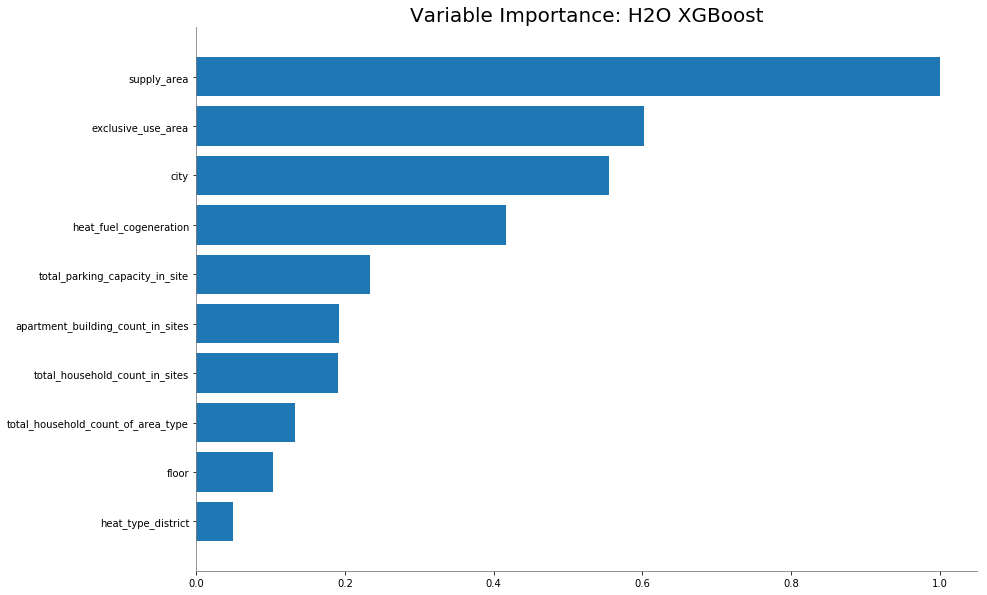

In [60]:
bestModel_500.varimp_plot()

In [61]:
bestModel_500.algo

'xgboost'

In [62]:
meta_data['mod_best']=bestModel_500._id
meta_data['mod_best_algo']=bestModel_500.algo


In [63]:
aml_leaderboard_df=leaderBoard.as_data_frame()
model_set=aml_leaderboard_df['model_id']
model_set

0         XGBoost_grid_1_AutoML_20190425_034434_model_5
1                          GBM_1_AutoML_20190425_031629
2             GBM_grid_1_AutoML_20190425_034434_model_4
3                      XGBoost_1_AutoML_20190425_031629
4         XGBoost_grid_1_AutoML_20190425_034434_model_3
5                          GBM_1_AutoML_20190425_034434
6                      XGBoost_1_AutoML_20190425_034434
7                      XGBoost_2_AutoML_20190425_034434
8         XGBoost_grid_1_AutoML_20190425_034434_model_1
9         XGBoost_grid_1_AutoML_20190425_034434_model_4
10        XGBoost_grid_1_AutoML_20190425_031629_model_1
11                         GBM_4_AutoML_20190425_034434
12                     XGBoost_2_AutoML_20190425_031629
13        XGBoost_grid_1_AutoML_20190425_031629_model_2
14                         GBM_4_AutoML_20190425_031629
15                         XRT_1_AutoML_20190425_031629
16                         DRF_1_AutoML_20190425_031629
17            GBM_grid_1_AutoML_20190425_031629_

In [66]:
DL = [ 36, 37, 47, 38, 39, 40, 42, 43, 34, 46, 35, 48,]
DRF = [16,18,]
GBM=[ 1, 5, 20, 21, 22, 23, 14, 11, 32, 33, 19, 41, 17, 53, 51, 31, 49, 30, 50, 2, 29, 44, 45, 57, 56]
GLM = [56,57,]
XGB = [3, 6, 12, 7, 28, 27, 10, 13, 8, 58, 4, 9, 0, 26, 25, 52, ]
XRT = [15,24,]

In [67]:
DL = get_DL_params(board_csv, DL, 'DL')
XGB = get_XG_params(board_csv, XGB, 'XGB')
DRF = get_DRF_params(board_csv, DRF, 'DRF')
GBM = get_GBM_params(board_csv, GBM, 'GBM')
XRT = get_XRT_params(board_csv, XRT, 'XRT')
GLM = get_GLM_params(board_csv, GLM, 'GLM')        

HP done
---   hyperparameter  existed ---
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
stopping_rounds not exist
stopping_metric not exist
topping_tolerance not exist
col_sample_rate not exist
 sample_rate not exist
 max_depth not exist
 learn_rate not exist
 ntrees not exist
stopping_rounds not exist
stopping_metric not exist
topping_tolerance not exist
col_sample_rate not exist
 sample_rate not exist
 max_depth not exist
 learn_rate not exist
 ntrees not exist
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done


In [68]:
# best model of each type
best_model_set = [0, 1, 15, 16, 34, 56, 58,]
best_sets_500 = get_best_models(best_model_set, model_set)
meta_data['models']=best_sets_500
best_sets_500


['XGBoost_grid_1_AutoML_20190425_034434_model_5',
 'GBM_1_AutoML_20190425_031629',
 'XRT_1_AutoML_20190425_031629',
 'DRF_1_AutoML_20190425_031629',
 'DeepLearning_grid_1_AutoML_20190425_034434_model_4',
 'GLM_grid_1_AutoML_20190425_034434_model_1',
 'XGBoost_grid_1_AutoML_20190425_034434_model_2']

In [69]:
# Update and save meta data

meta_data['end_time'] = time.time()
meta_data['execution_time'] = meta_data['end_time'] - meta_data['start_time']
  
n=run_id+'_meta_data.json'
dict_to_json(meta_data,n)

In [70]:
meta_data

{'start_time': 1556178269.322779,
 'target': 'transaction_real_price',
 'server_path': '/Users/bonnie/6105/project/DS/project/results',
 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv',
 'test_path': None,
 'max_models': 9,
 'run_time': 500,
 'run_id': 'eFMvlPR500',
 'scale': False,
 'classification': False,
 'model_path': None,
 'balance': False,
 'balance_threshold': 0.2,
 'project': None,
 'end_time': 1556179502.538707,
 'execution_time': 1233.2159280776978,
 'run_path': '/Users/bonnie/6105/project/DS/project/results/eFMvlPR500',
 'nthreads': 1,
 'min_mem_size': 1,
 'analysis': 0,
 'X': ['city',
  'exclusive_use_area',
  'floor',
  'total_parking_capacity_in_site',
  'total_household_count_in_sites',
  'apartment_building_count_in_sites',
  'supply_area',
  'total_household_count_of_area_type',
  'room_count',
  'bathroom_count',
  'heat_fuel_cogeneration',
  'heat_fuel_gas',
  'heat_type_central',
  'heat_type_district',
  'heat_type_individual',
  '

In [71]:
# Save logs
h2o.download_all_logs(dirname=logs_path, filename=logfile)

Writing H2O logs to /Users/bonnie/6105/project/DS/project/results/eFMvlPR500/logs/eFMvlPR500_autoh2o_log.zip


'/Users/bonnie/6105/project/DS/project/results/eFMvlPR500/logs/eFMvlPR500_autoh2o_log.zip'

### Generate MODEL 3 ( 1000 seconds) 
Set the runtime and the location of the folder which the model data should stored

In [125]:
runtime = 1000

In [126]:
rtime = str(runtime)
run_id= alphabet(6) + rtime

run_path = os.path.join(server_path,run_id)
os.mkdir(run_path)
os.chdir(run_path)    

print (run_id)

msBMSK1000


In [127]:
logfile=run_id+'_autoh2o_log.zip'
logs_path=os.path.join(run_path,'logs')
print(logs_path,' ',logfile)

/Users/bonnie/6105/project/DS/project/results/msBMSK1000/logs   msBMSK1000_autoh2o_log.zip


In [128]:
# meta data
meta_data = set_meta_data(analysis, run_id,server_path,data_path,test_path,model_path,
                          target,runtime,classification,scale,max_models,balance_y,
                          balance_threshold,name,run_path,nthreads,min_mem_size,X,
                          Variable_type)


print(meta_data)

{'start_time': 1556181606.957847, 'target': 'transaction_real_price', 'server_path': '/Users/bonnie/6105/project/DS/project/results', 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv', 'test_path': None, 'max_models': 9, 'run_time': 1000, 'run_id': 'msBMSK1000', 'scale': False, 'classification': False, 'model_path': None, 'balance': False, 'balance_threshold': 0.2, 'project': None, 'end_time': 1556181606.957849, 'execution_time': 0.0, 'run_path': '/Users/bonnie/6105/project/DS/project/results/msBMSK1000', 'nthreads': 1, 'min_mem_size': 1, 'analysis': 0, 'X': ['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', 'f

In [129]:
model_start_time = time.time()
leaderBoard = get_leaderBoard(runtime)

AutoML progress: |████████████████████████████████████████████████████████| 100%
get_leaderBoard done


In [130]:
execution_time =  time.time() - model_start_time
meta_data['model_execution_time_sec'] = execution_time
meta_data['model_execution_time'] = time.time() - model_start_time
print("Execution time for ", runtime,"sec =  ",meta_data['model_execution_time_sec'])


Execution time for  1000 sec =   955.7841777801514


In [131]:
board_csv = board_to_csv(leaderBoard)

every_params = get_every_params(board_csv)

--- create new folder leaderboard  ---
board_to_csv done
XGBoost_grid_1_AutoML_20190425_034434_model_5
--- create new folder param  ---
XGBoost_grid_1_AutoML_20190425_040839_model_7
---   param  existed ---
GBM_1_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_034434_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_1
---   param  existed ---
XGBoost_1_AutoML_20190425_044008
---   param  existed ---
GBM_1_AutoML_20190425_044008
---   param  existed ---
XGBoost_1_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_5
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_6
---   param  existed ---
GBM_grid_1_AutoML_20190425_044008_model_7
---   param  existed ---
XGBoost_1_AutoML_20190425_040839
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_034434_model_3
---   param  existed ---
GBM_1_AutoML_20190425_

In [132]:
all_varimp = get_all_varimp(board_csv)  

--- create new folder varimp  ---
all varimp done


In [133]:
bestModel_1000= get_BestModel(board_csv)
bestModel_1000

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190425_034434_model_5


ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 6426494700688825.0
RMSE: 80165420.85393693
MAE: 54535962.69703504
RMSLE: 0.21184011548141482
Mean Residual Deviance: 6426494700688825.0

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 2.3532474855228316e+16
RMSE: 153402981.89809844
MAE: 90918845.49757412
RMSLE: 0.31368784715308506
Mean Residual Deviance: 2.3532474855228316e+16
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,90918848.0000000,1839696.5,95816288.0000000,91183232.0000000,89934552.0000000,88611840.0000000,89048312.0000000
mean_residual_deviance,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
mse,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
r2,0.7603636,0.0170403,0.7535597,0.7253769,0.7528056,0.7716479,0.7984281
residual_deviance,23532475900000000.0000000,1714782600000000.0000000,25732130500000000.0000000,26206443000000000.0000000,20645164800000000.0000000,24424381600000000.0000000,20654257200000000.0000000
rmse,153195920.0000000,5634126.0,160412368.0000000,161884048.0000000,143684256.0000000,156283008.0000000,143715888.0000000
rmsle,0.3136399,0.0038774,0.3084553,0.3166682,0.3057718,0.3176187,0.3196857


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2019-04-25 03:48:03,2 min 9.426 sec,0.0,510052399.0745529,401904324.3927224,260153449801706944.0000000
,2019-04-25 03:48:03,2 min 9.512 sec,5.0,410643254.3515888,313658439.8320755,168627882344463648.0000000
,2019-04-25 03:48:03,2 min 9.592 sec,10.0,334489708.4313594,245223017.6948787,111883365046495808.0000000
,2019-04-25 03:48:03,2 min 9.678 sec,15.0,276921763.9709626,192776821.5477089,76685663360789552.0000000
,2019-04-25 03:48:04,2 min 9.770 sec,20.0,232652773.7544138,153714772.6150943,54127313135622432.0000000
---,---,---,---,---,---,---
,2019-04-25 03:48:07,2 min 12.719 sec,115.0,83743798.5030115,56418506.2544474,7013023787712987.0000000
,2019-04-25 03:48:07,2 min 12.915 sec,120.0,82814119.7391555,55989217.7504043,6858178428171183.0000000
,2019-04-25 03:48:07,2 min 13.118 sec,125.0,81358120.0617751,55210479.0641509,6619143699986209.0000000
,2019-04-25 03:48:07,2 min 13.322 sec,130.0,80481155.7217434,54725964.3638814,6477216426307506.0000000



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
supply_area,1284120368951404265472.0000000,1.0,0.2793377
exclusive_use_area,772957166907737243648.0000000,0.6019351,0.1681432
city,713206644014017675264.0000000,0.5554048,0.1551455
heat_fuel_cogeneration,534416448004059824128.0000000,0.4161732,0.1162529
total_parking_capacity_in_site,299381886963406602240.0000000,0.2331416,0.0651252
apartment_building_count_in_sites,247495335114331652096.0000000,0.1927353,0.0538382
total_household_count_in_sites,244401362170328121344.0000000,0.1903259,0.0531652
total_household_count_of_area_type,170907383734059663360.0000000,0.1330930,0.0371779
floor,131989861805672366080.0000000,0.1027862,0.0287121
heat_type_district,64536595854358740992.0000000,0.0502574,0.0140388


In [134]:
my_path = run_path + '/bestModel'
h2o.save_model(model=bestModel_1000, 
                      path = my_path, 
                     # force=True
                     )


'/Users/bonnie/6105/project/DS/project/results/msBMSK1000/bestModel/XGBoost_grid_1_AutoML_20190425_034434_model_5'

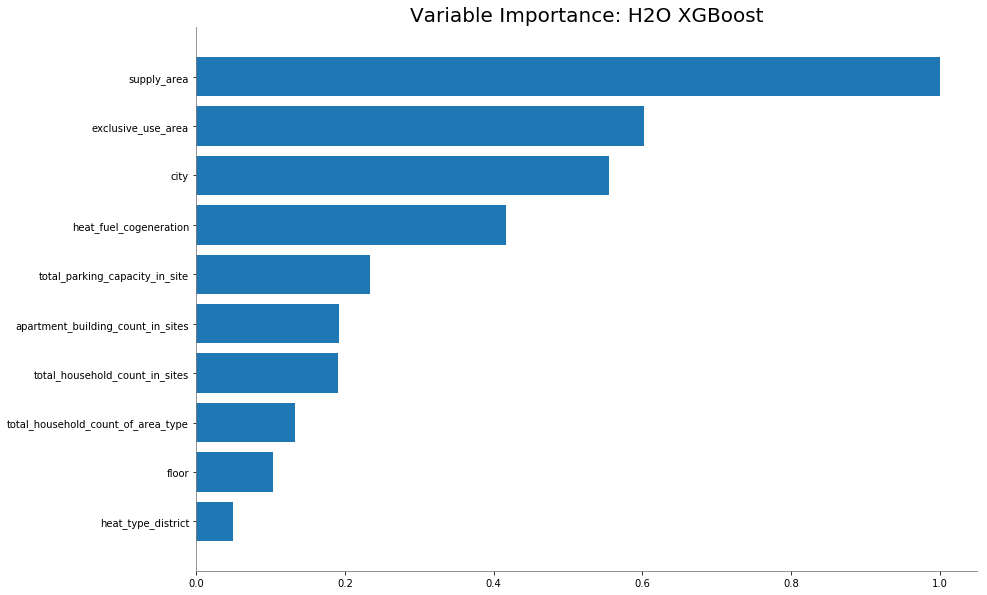

In [135]:
bestModel_1000.varimp_plot()

In [136]:
bestModel_1000.algo

'xgboost'

In [137]:
meta_data['mod_best']=bestModel_1000._id
meta_data['mod_best_algo']=bestModel_1000.algo


In [138]:
aml_leaderboard_df=leaderBoard.as_data_frame()
model_set=aml_leaderboard_df['model_id']
model_set

0          XGBoost_grid_1_AutoML_20190425_034434_model_5
1          XGBoost_grid_1_AutoML_20190425_040839_model_7
2                           GBM_1_AutoML_20190425_031629
3              GBM_grid_1_AutoML_20190425_034434_model_4
4          XGBoost_grid_1_AutoML_20190425_044008_model_1
5                       XGBoost_1_AutoML_20190425_044008
6                           GBM_1_AutoML_20190425_044008
7                       XGBoost_1_AutoML_20190425_031629
8          XGBoost_grid_1_AutoML_20190425_044008_model_4
9          XGBoost_grid_1_AutoML_20190425_040839_model_5
10         XGBoost_grid_1_AutoML_20190425_040839_model_6
11             GBM_grid_1_AutoML_20190425_044008_model_7
12                      XGBoost_1_AutoML_20190425_040839
13         XGBoost_grid_1_AutoML_20190425_034434_model_3
14                          GBM_1_AutoML_20190425_034434
15                      XGBoost_1_AutoML_20190425_034434
16                      XGBoost_2_AutoML_20190425_034434
17         XGBoost_grid_1_AutoM

In [139]:
DL = [ 122, 123, 118, 120, 147, 127, 131, 132, 136, 138, 108, 145, 119, 154, 111, 130, 144, 126, 149, 151, 124, 150, 110, 148, 135, 146,
]
DRF = [37, 44, 36, 66,]
GBM=[ 2, 14, 22, 6, 47, 48, 50, 55, 51, 53, 49, 46, 34, 24, 43, 39, 100, 103, 106, 104, 45, 134, 42, 165, 160, 94, 155, 83, 159, 3, 82, 139, 141, 99, 117, 113, 93, 86, 40, 128, 58, 125, 28, 18, 78, 84, 162, 29, 157, 54, 140, 109, 52, 79, 62, 121, 156, 68, 116, 112, 166, 31, 133, 80, 69, 97, 92, 56, 129, 91, 27, 107, 101, 153, 89, 95, 71, 115, 102, 85, 137, 87, 32, 75, 81, 90, 158, 142, 164, 96, 152, 161, 98, 114, 88, 11, 77, 73,]
XGB = [7, 15, 12, 5, 26, 16, 25, 33, 76, 74, 72, 70, 23, 30, 17, 173, 13, 21, 0, 60, 59, 163, 19, 64, 67, 41, 9, 10, 1, 105, 4, 174, 20, 8, 38, 65, 143, 175,]
XRT = [35, 57, 63, 61, ]
GLM = [170, 171, 172, 169,]

In [140]:
DL = get_DL_params(board_csv, DL, 'DL')
XGB = get_XG_params(board_csv, XGB, 'XGB')
DRF = get_DRF_params(board_csv, DRF, 'DRF')
GBM = get_GBM_params(board_csv, GBM, 'GBM')
XRT = get_XRT_params(board_csv, XRT, 'XRT')
GLM = get_GLM_params(board_csv, GLM, 'GLM')        

HP done
--- create new folder hyperparameter  ---
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done


In [141]:
# best model of each type
best_model_set = [0, 2, 35, 36, 108, 169,]
best_sets_1000 = get_best_models(best_model_set, model_set)
meta_data['models']=best_sets_1000
best_sets_1000


['XGBoost_grid_1_AutoML_20190425_034434_model_5',
 'GBM_1_AutoML_20190425_031629',
 'XRT_1_AutoML_20190425_031629',
 'DRF_1_AutoML_20190425_040839',
 'DeepLearning_grid_1_AutoML_20190425_034434_model_4',
 'GLM_grid_1_AutoML_20190425_044008_model_1']

In [142]:
# Update and save meta data

meta_data['end_time'] = time.time()
meta_data['execution_time'] = meta_data['end_time'] - meta_data['start_time']
  


In [143]:
n=run_id+'_meta_data.json'
dict_to_json(meta_data,n)

In [144]:
meta_data

{'start_time': 1556181606.957847,
 'target': 'transaction_real_price',
 'server_path': '/Users/bonnie/6105/project/DS/project/results',
 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv',
 'test_path': None,
 'max_models': 9,
 'run_time': 1000,
 'run_id': 'msBMSK1000',
 'scale': False,
 'classification': False,
 'model_path': None,
 'balance': False,
 'balance_threshold': 0.2,
 'project': None,
 'end_time': 1556183013.0109608,
 'execution_time': 1406.0531136989594,
 'run_path': '/Users/bonnie/6105/project/DS/project/results/msBMSK1000',
 'nthreads': 1,
 'min_mem_size': 1,
 'analysis': 0,
 'X': ['city',
  'exclusive_use_area',
  'floor',
  'total_parking_capacity_in_site',
  'total_household_count_in_sites',
  'apartment_building_count_in_sites',
  'supply_area',
  'total_household_count_of_area_type',
  'room_count',
  'bathroom_count',
  'heat_fuel_cogeneration',
  'heat_fuel_gas',
  'heat_type_central',
  'heat_type_district',
  'heat_type_individual',
 

In [145]:
# Save logs
h2o.download_all_logs(dirname=logs_path, filename=logfile)

Writing H2O logs to /Users/bonnie/6105/project/DS/project/results/msBMSK1000/logs/msBMSK1000_autoh2o_log.zip


'/Users/bonnie/6105/project/DS/project/results/msBMSK1000/logs/msBMSK1000_autoh2o_log.zip'

### Generate MODEL 4 ( 1500 seconds) 
Set the runtime and the location of the folder which the model data should stored

In [166]:
runtime = 1500

In [167]:
rtime = str(runtime)
run_id= alphabet(6) + rtime

run_path = os.path.join(server_path,run_id)
os.mkdir(run_path)
os.chdir(run_path)    

print (run_id)

ihFSck1500


In [168]:
logfile=run_id+'_autoh2o_log.zip'
logs_path=os.path.join(run_path,'logs')
print(logs_path,' ',logfile)

/Users/bonnie/6105/project/DS/project/results/ihFSck1500/logs   ihFSck1500_autoh2o_log.zip


In [169]:
# meta data
meta_data = set_meta_data(analysis, run_id,server_path,data_path,test_path,model_path,
                          target,runtime,classification,scale,max_models,balance_y,
                          balance_threshold,name,run_path,nthreads,min_mem_size,X,
                          Variable_type)


print(meta_data)

{'start_time': 1556185337.206079, 'target': 'transaction_real_price', 'server_path': '/Users/bonnie/6105/project/DS/project/results', 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv', 'test_path': None, 'max_models': 9, 'run_time': 1500, 'run_id': 'ihFSck1500', 'scale': False, 'classification': False, 'model_path': None, 'balance': False, 'balance_threshold': 0.2, 'project': None, 'end_time': 1556185337.206756, 'execution_time': 0.0, 'run_path': '/Users/bonnie/6105/project/DS/project/results/ihFSck1500', 'nthreads': 1, 'min_mem_size': 1, 'analysis': 0, 'X': ['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', 'f

In [170]:
model_start_time = time.time()
leaderBoard = get_leaderBoard(runtime)

AutoML progress: |████████████████████████████████████████████████████████| 100%
get_leaderBoard done


In [171]:
execution_time =  time.time() - model_start_time
meta_data['model_execution_time_sec'] = execution_time
meta_data['model_execution_time'] = time.time() - model_start_time
print("Execution time for ", runtime,"sec =  ",meta_data['model_execution_time_sec'])


Execution time for  1500 sec =   1363.7918326854706


In [172]:
board_csv = board_to_csv(leaderBoard)

every_params = get_every_params(board_csv)

--- create new folder leaderboard  ---
board_to_csv done
XGBoost_grid_1_AutoML_20190425_054218_model_6
--- create new folder param  ---
XGBoost_grid_1_AutoML_20190425_034434_model_5
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_054218_model_7
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_7
---   param  existed ---
GBM_1_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_034434_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_1
---   param  existed ---
XGBoost_1_AutoML_20190425_044008
---   param  existed ---
GBM_1_AutoML_20190425_044008
---   param  existed ---
XGBoost_1_AutoML_20190425_054218
---   param  existed ---
XGBoost_1_AutoML_20190425_031629
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_5
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_6
---   param  existed ---
GBM_grid_1_AutoML_

GBM_grid_1_AutoML_20190425_040839_model_25
---   param  existed ---
GBM_grid_1_AutoML_20190425_034434_model_7
---   param  existed ---
GBM_grid_1_AutoML_20190425_044008_model_28
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_7
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_040839_model_3
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_034434_model_5
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_044008_model_6
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_031629_model_1
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_044008_model_4
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_040839_model_5
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_050348_model_9
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_044008_model_2
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_054218_model_6
---   param  existed ---
GBM_grid_1_AutoML_20190425_050348_model_13

In [173]:
all_varimp = get_all_varimp(board_csv)  

--- create new folder varimp  ---
all varimp done


In [174]:
bestModel_1500= get_BestModel(board_csv)
bestModel_1500

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190425_054218_model_6


ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 3058306134911125.0
RMSE: 55301954.169008575
MAE: 30091745.64959569
RMSLE: 0.12035805824318067
Mean Residual Deviance: 3058306134911125.0

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 2.3445318879446148e+16
RMSE: 153118643.14787453
MAE: 90243396.85121293
RMSLE: 0.3132719590137167
Mean Residual Deviance: 2.3445318879446148e+16
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,9.02434E7,1655085.8,94574960.0000000,90208712.0000000,89259528.0000000,89629344.0000000,87544432.0000000
mean_residual_deviance,23445318100000000.0000000,1530099010000000.0000000,26492157100000000.0000000,24152581100000000.0000000,21104915200000000.0000000,24629477100000000.0000000,20847462000000000.0000000
mse,23445318100000000.0000000,1530099010000000.0000000,26492157100000000.0000000,24152581100000000.0000000,21104915200000000.0000000,24629477100000000.0000000,20847462000000000.0000000
r2,0.7613509,0.0139356,0.7462808,0.7468998,0.7473007,0.7697304,0.7965425
residual_deviance,23445318100000000.0000000,1530099010000000.0000000,26492157100000000.0000000,24152581100000000.0000000,21104915200000000.0000000,24629477100000000.0000000,20847462000000000.0000000
rmse,152954944.0000000,5005101.0,162764112.0000000,155411008.0000000,145275312.0000000,156937808.0000000,144386496.0000000
rmsle,0.3132485,0.0027104,0.3097516,0.315528,0.3075696,0.3167723,0.3166209


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2019-04-25 05:47:41,4 min 8.950 sec,0.0,510052399.0745529,401904324.3927224,260153449801706944.0000000
,2019-04-25 05:47:42,4 min 9.020 sec,5.0,418242001.5688898,314178038.8053908,174926371876351232.0000000
,2019-04-25 05:47:42,4 min 9.079 sec,10.0,348541590.7882628,246178542.8690027,121481240509212848.0000000
,2019-04-25 05:47:42,4 min 9.147 sec,15.0,296280659.0034764,195391477.3628032,87782228899534256.0000000
,2019-04-25 05:47:42,4 min 9.222 sec,20.0,256022471.0144172,158991257.8555256,65547505664328112.0000000
---,---,---,---,---,---,---
,2019-04-25 05:47:53,4 min 20.045 sec,135.0,62009785.1365539,33691147.8371968,3845213452681585.0000000
,2019-04-25 05:47:54,4 min 21.036 sec,140.0,59970771.5229437,32578474.4005391,3596493437057111.0000000
,2019-04-25 05:47:55,4 min 22.100 sec,145.0,58130106.6824970,31635478.7800539,3379109302918480.0000000
,2019-04-25 05:47:56,4 min 23.182 sec,150.0,56353131.6440373,30673309.8086253,3175675446090192.5000000



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
supply_area,1784638891063316054016.0000000,1.0,0.2832293
city,1157541283030854795264.0000000,0.6486137,0.1837064
exclusive_use_area,1095179094565725405184.0000000,0.6136699,0.1738093
heat_fuel_cogeneration,389352302228596064256.0000000,0.2181687,0.0617918
total_parking_capacity_in_site,310206288667791589376.0000000,0.1738202,0.0492310
heat_fuel_gas,295061334031828254720.0000000,0.1653339,0.0468274
total_household_count_in_sites,287814620018924060672.0000000,0.1612733,0.0456773
apartment_building_count_in_sites,278566724474723368960.0000000,0.1560914,0.0442096
total_household_count_of_area_type,189251635731874447360.0000000,0.1060448,0.0300350
floor,155643066115784966144.0000000,0.0872126,0.0247012


In [175]:
my_path = run_path + '/bestModel'
h2o.save_model(model=bestModel_1500, 
                      path = my_path, 
                     # force=True
                     )


'/Users/bonnie/6105/project/DS/project/results/ihFSck1500/bestModel/XGBoost_grid_1_AutoML_20190425_054218_model_6'

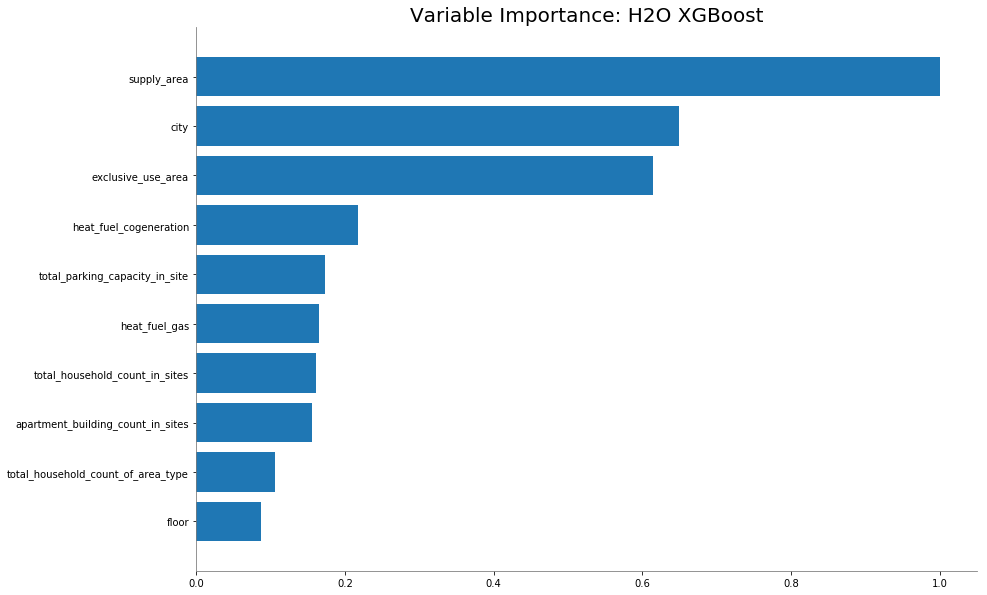

In [176]:
bestModel_1500.varimp_plot()

In [177]:
bestModel_1500.algo

'xgboost'

In [178]:
meta_data['mod_best']=bestModel_1500._id
meta_data['mod_best_algo']=bestModel_1500.algo


In [179]:
aml_leaderboard_df=leaderBoard.as_data_frame()
model_set=aml_leaderboard_df['model_id']
model_set

0          XGBoost_grid_1_AutoML_20190425_054218_model_6
1          XGBoost_grid_1_AutoML_20190425_034434_model_5
2          XGBoost_grid_1_AutoML_20190425_054218_model_7
3          XGBoost_grid_1_AutoML_20190425_040839_model_7
4                           GBM_1_AutoML_20190425_031629
5              GBM_grid_1_AutoML_20190425_034434_model_4
6          XGBoost_grid_1_AutoML_20190425_044008_model_1
7                       XGBoost_1_AutoML_20190425_044008
8                           GBM_1_AutoML_20190425_044008
9                       XGBoost_1_AutoML_20190425_054218
10                      XGBoost_1_AutoML_20190425_031629
11         XGBoost_grid_1_AutoML_20190425_044008_model_4
12         XGBoost_grid_1_AutoML_20190425_040839_model_5
13         XGBoost_grid_1_AutoML_20190425_040839_model_6
14             GBM_grid_1_AutoML_20190425_044008_model_7
15         XGBoost_grid_1_AutoML_20190425_054218_model_9
16                      XGBoost_1_AutoML_20190425_040839
17                          GBM

In [180]:
DL = [ 
        221, 222, 213, 216, 203, 207, 254, 227, 235, 238, 243, 245, 196, 252, 215, 268, 199, 233, 251, 226, 256, 261, 224, 258, 198, 255, 241, 253, 217, 234, 205, 231, 202, 230, 237, 274, 257, 160, 195, 232, 262, 264, 259, 223, 265,]
DRF = [70, 80, 64, 119, 107, 130,]
GBM=[ 4, 24, 40, 8, 17, 37, 83, 85, 89, 98, 96, 108, 91, 95, 86, 82, 68, 90, 60, 42, 77, 73, 54, 59, 181, 186, 193, 189, 188, 192, 81, 240, 76, 290, 280, 173, 269, 147, 279, 5, 144, 246, 248, 179, 211, 201, 170, 153, 74, 228, 102, 225, 49, 31, 139, 150, 283, 51, 272, 97, 247, 197, 93, 140, 111, 220, 270, 122, 209, 200, 292, 56, 239, 141, 123, 176, 167, 99, 229, 166, 48, 194, 183, 267, 159, 174, 127, 208, 185, 151, 244, 154, 57, 133, 143, 163, 275, 249, 289, 175, 266, 281, 177, 206, 155, 14, 138, 129, 184, 142, 78, 171, 260, 145, 146, 112, 19, 88, 156, 137, 187, 282, 162, 165, 191, 172, 180, 214, 284, 35, 120, 149, 273, 293, 285, 94, 204, 46, 125, 136, 182, 168, 134, 218, 92, 242, 212, 63, 66, 277, 104, 219, 161, 278, 158, 109, 210, 164, 38, 178, 288, 71, 287, 291, 157, 236, 43, 276, 148,]
GLM = [298, 297, 301, 296, 300, 299,]
XGB = [10, 25, 16, 7, 27, 9, 45, 28, 44, 58, 50, 26, 135, 131, 128, 124, 132, 126, 41, 53, 30, 302, 23, 39, 1, 105, 103, 286, 32, 117, 121, 75, 12, 13, 3, 190, 6, 303, 34, 11, 72, 118, 250, 306, 33, 47, 152, 79, 115, 169, 114, 55, 62, 29, 21, 67, 87, 101, 110, 36, 52, 304, 20, 22, 271, 305, 263, 69, 84, 0, 2, 18, 15,]
XRT = [61, 100, 113, 106, 65, 116,]

In [181]:
DL = get_DL_params(board_csv, DL, 'DL')
XGB = get_XG_params(board_csv, XGB, 'XGB')
DRF = get_DRF_params(board_csv, DRF, 'DRF')
GBM = get_GBM_params(board_csv, GBM, 'GBM')
XRT = get_XRT_params(board_csv, XRT, 'XRT')
GLM = get_GLM_params(board_csv, GLM, 'GLM')        

HP done
--- create new folder hyperparameter  ---
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done


In [182]:
# best model of each type
best_model_set = [0,4,61,64,160,296,]
best_sets_1500 = get_best_models(best_model_set, model_set)
meta_data['models']=best_sets_1500
best_sets_1500


['XGBoost_grid_1_AutoML_20190425_054218_model_6',
 'GBM_1_AutoML_20190425_031629',
 'XRT_1_AutoML_20190425_031629',
 'DRF_1_AutoML_20190425_040839',
 'DeepLearning_grid_1_AutoML_20190425_054218_model_1',
 'GLM_grid_1_AutoML_20190425_044008_model_1']

In [183]:
# Update and save meta data

meta_data['end_time'] = time.time()
meta_data['execution_time'] = meta_data['end_time'] - meta_data['start_time']
  
n=run_id+'_meta_data.json'
dict_to_json(meta_data,n)

In [184]:
meta_data

{'start_time': 1556185337.206079,
 'target': 'transaction_real_price',
 'server_path': '/Users/bonnie/6105/project/DS/project/results',
 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv',
 'test_path': None,
 'max_models': 9,
 'run_time': 1500,
 'run_id': 'ihFSck1500',
 'scale': False,
 'classification': False,
 'model_path': None,
 'balance': False,
 'balance_threshold': 0.2,
 'project': None,
 'end_time': 1556187162.738215,
 'execution_time': 1825.53213596344,
 'run_path': '/Users/bonnie/6105/project/DS/project/results/ihFSck1500',
 'nthreads': 1,
 'min_mem_size': 1,
 'analysis': 0,
 'X': ['city',
  'exclusive_use_area',
  'floor',
  'total_parking_capacity_in_site',
  'total_household_count_in_sites',
  'apartment_building_count_in_sites',
  'supply_area',
  'total_household_count_of_area_type',
  'room_count',
  'bathroom_count',
  'heat_fuel_cogeneration',
  'heat_fuel_gas',
  'heat_type_central',
  'heat_type_district',
  'heat_type_individual',
  'f

In [185]:
# Save logs
h2o.download_all_logs(dirname=logs_path, filename=logfile)

Writing H2O logs to /Users/bonnie/6105/project/DS/project/results/ihFSck1500/logs/ihFSck1500_autoh2o_log.zip


'/Users/bonnie/6105/project/DS/project/results/ihFSck1500/logs/ihFSck1500_autoh2o_log.zip'

### Generate MODEL 5 ( 2000 seconds) 
Set the runtime and the location of the folder which the model data should stored

In [186]:
runtime = 2000

In [187]:
rtime = str(runtime)
run_id= alphabet(6) + rtime

run_path = os.path.join(server_path,run_id)
os.mkdir(run_path)
os.chdir(run_path)    

print (run_id)

CzanFF2000


In [188]:
logfile=run_id+'_autoh2o_log.zip'
logs_path=os.path.join(run_path,'logs')
print(logs_path,' ',logfile)

/Users/bonnie/6105/project/DS/project/results/CzanFF2000/logs   CzanFF2000_autoh2o_log.zip


In [189]:
# meta data
meta_data = set_meta_data(analysis, run_id,server_path,data_path,test_path,model_path,
                          target,runtime,classification,scale,max_models,balance_y,
                          balance_threshold,name,run_path,nthreads,min_mem_size,X,
                          Variable_type)


print(meta_data)

{'start_time': 1556187167.476568, 'target': 'transaction_real_price', 'server_path': '/Users/bonnie/6105/project/DS/project/results', 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv', 'test_path': None, 'max_models': 9, 'run_time': 2000, 'run_id': 'CzanFF2000', 'scale': False, 'classification': False, 'model_path': None, 'balance': False, 'balance_threshold': 0.2, 'project': None, 'end_time': 1556187167.4765701, 'execution_time': 0.0, 'run_path': '/Users/bonnie/6105/project/DS/project/results/CzanFF2000', 'nthreads': 1, 'min_mem_size': 1, 'analysis': 0, 'X': ['city', 'exclusive_use_area', 'floor', 'total_parking_capacity_in_site', 'total_household_count_in_sites', 'apartment_building_count_in_sites', 'supply_area', 'total_household_count_of_area_type', 'room_count', 'bathroom_count', 'heat_fuel_cogeneration', 'heat_fuel_gas', 'heat_type_central', 'heat_type_district', 'heat_type_individual', 'front_door_structure_corridor', 'front_door_structure_mixed', '

In [190]:
model_start_time = time.time()
leaderBoard = get_leaderBoard(runtime)

AutoML progress: |████████████████████████████████████████████████████████| 100%
get_leaderBoard done


In [191]:
execution_time =  time.time() - model_start_time
meta_data['model_execution_time_sec'] = execution_time
meta_data['model_execution_time'] = time.time() - model_start_time
print("Execution time for ", runtime,"sec =  ",meta_data['model_execution_time_sec'])


Execution time for  2000 sec =   1797.248456954956


In [192]:
board_csv = board_to_csv(leaderBoard)

every_params = get_every_params(board_csv)

--- create new folder leaderboard  ---
board_to_csv done
XGBoost_grid_1_AutoML_20190425_061247_model_5
--- create new folder param  ---
XGBoost_grid_1_AutoML_20190425_054218_model_6
---   param  existed ---
GBM_1_AutoML_20190425_061247
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_034434_model_5
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_061247_model_2
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_054218_model_7
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_040839_model_7
---   param  existed ---
GBM_1_AutoML_20190425_031629
---   param  existed ---
GBM_grid_1_AutoML_20190425_034434_model_4
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_044008_model_1
---   param  existed ---
XGBoost_grid_1_AutoML_20190425_061247_model_7
---   param  existed ---
XGBoost_1_AutoML_20190425_044008
---   param  existed ---
GBM_1_AutoML_20190425_044008
---   param  existed ---
XGBoost_1_AutoML_20190425_054218
---   param  existed ---
XGBoost_1_AutoML_20190

GBM_grid_1_AutoML_20190425_054218_model_25
---   param  existed ---
GBM_grid_1_AutoML_20190425_040839_model_10
---   param  existed ---
GBM_grid_1_AutoML_20190425_054218_model_15
---   param  existed ---
DeepLearning_1_AutoML_20190425_040839
---   param  existed ---
GBM_grid_1_AutoML_20190425_050348_model_27
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_034434_model_6
---   param  existed ---
DeepLearning_1_AutoML_20190425_044008
---   param  existed ---
DeepLearning_grid_1_AutoML_20190425_050348_model_1
---   param  existed ---
GBM_grid_1_AutoML_20190425_054218_model_12
---   param  existed ---
GBM_grid_1_AutoML_20190425_054218_model_2
---   param  existed ---
DeepLearning_1_AutoML_20190425_061247
---   param  existed ---
GBM_grid_1_AutoML_20190425_061247_model_8
---   param  existed ---
GBM_grid_1_AutoML_20190425_040839_model_3
---   param  existed ---
DeepLearning_1_AutoML_20190425_031629
---   param  existed ---
DeepLearning_1_AutoML_20190425_034434
---   param  exis

In [193]:
all_varimp = get_all_varimp(board_csv)  

--- create new folder varimp  ---
all varimp done


In [194]:
bestModel_2000= get_BestModel(board_csv)
bestModel_2000

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20190425_061247_model_5


ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 5816853476665414.0
RMSE: 76268299.29050086
MAE: 46229019.4722372
RMSLE: 0.17690396458636065
Mean Residual Deviance: 5816853476665414.0

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 2.3382607125691124e+16
RMSE: 152913724.45170227
MAE: 90137824.6296496
RMSLE: 0.31093634277167725
Mean Residual Deviance: 2.3382607125691124e+16
Cross-Validation Metrics Summary: 


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,90137824.0000000,1720194.9,94745192.0000000,89716088.0000000,89148568.0000000,89563824.0000000,87515440.0000000
mean_residual_deviance,23382607300000000.0000000,1616059290000000.0000000,26254581000000000.0000000,24030997000000000.0000000,21081099600000000.0000000,25161494700000000.0000000,20384864000000000.0000000
mse,23382607300000000.0000000,1616059290000000.0000000,26254581000000000.0000000,24030997000000000.0000000,21081099600000000.0000000,25161494700000000.0000000,20384864000000000.0000000
r2,0.7620259,0.0145352,0.7485561,0.7481739,0.7475859,0.7647564,0.8010572
residual_deviance,23382607300000000.0000000,1616059290000000.0000000,26254581000000000.0000000,24030997000000000.0000000,21081099600000000.0000000,25161494700000000.0000000,20384864000000000.0000000
rmse,152728928.0000000,5314216.0,162032656.0000000,155019344.0000000,145193312.0000000,158623744.0000000,142775568.0000000
rmsle,0.3108959,0.0035453,0.3065266,0.3103514,0.3044514,0.31621,0.3169402


Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
,2019-04-25 06:19:45,5 min 15.917 sec,0.0,510052399.0745529,401904324.3927224,260153449801706944.0000000
,2019-04-25 06:19:45,5 min 15.970 sec,5.0,418495889.6627705,314314193.8485175,175138809664633760.0000000
,2019-04-25 06:19:45,5 min 16.016 sec,10.0,349709775.0411803,246363801.1789757,122296926759352912.0000000
,2019-04-25 06:19:45,5 min 16.075 sec,15.0,299245657.0630278,196418295.8727763,89547963271083248.0000000
,2019-04-25 06:19:45,5 min 16.145 sec,20.0,260142796.7636881,160260701.7320755,67674274708033504.0000000
---,---,---,---,---,---,---
,2019-04-25 06:19:52,5 min 23.585 sec,150.0,81121986.2703420,48660595.7735849,6580776656445555.0000000
,2019-04-25 06:19:53,5 min 24.071 sec,155.0,79778282.6056677,47968167.1115903,6364574375509785.0000000
,2019-04-25 06:19:53,5 min 24.578 sec,160.0,78501676.1712975,47346526.1649596,6162513161703253.0000000
,2019-04-25 06:19:54,5 min 25.089 sec,165.0,77163595.8103168,46649815.0442049,5954220518377946.0000000



See the whole table with table.as_data_frame()
Variable Importances: 


variable,relative_importance,scaled_importance,percentage
supply_area,1436747078848013664256.0000000,1.0,0.2745831
city,970252688970932551680.0000000,0.6753121,0.1854293
exclusive_use_area,888728176672550944768.0000000,0.6185697,0.1698488
heat_fuel_cogeneration,430438852735329632256.0000000,0.2995926,0.0822631
total_parking_capacity_in_site,321311848689538433024.0000000,0.2236384,0.0614073
apartment_building_count_in_sites,252033045990442270720.0000000,0.1754192,0.0481672
total_household_count_in_sites,242843996308560150528.0000000,0.1690235,0.0464110
total_household_count_of_area_type,188630754709808873472.0000000,0.1312902,0.0360501
floor,127563790942199611392.0000000,0.0887865,0.0243793
heat_fuel_gas,107952584889838075904.0000000,0.0751368,0.0206313


In [195]:
my_path = run_path + '/bestModel'
h2o.save_model(model=bestModel_2000, 
                      path = my_path, 
                     # force=True
                     )


'/Users/bonnie/6105/project/DS/project/results/CzanFF2000/bestModel/XGBoost_grid_1_AutoML_20190425_061247_model_5'

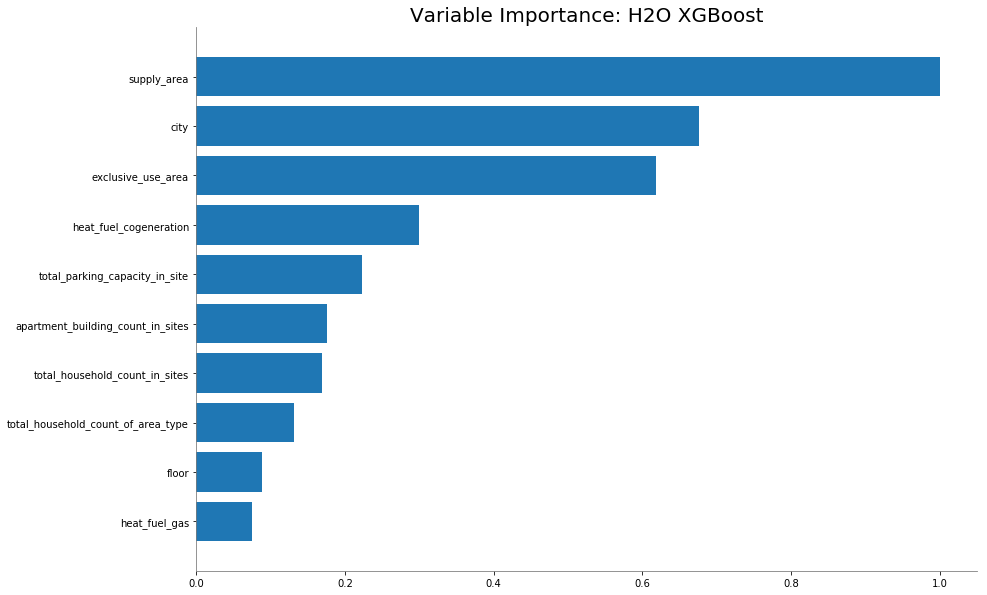

In [196]:
bestModel_2000.varimp_plot()

In [197]:
bestModel_2000.algo

'xgboost'

In [198]:
meta_data['mod_best']=bestModel_2000._id
meta_data['mod_best_algo']=bestModel_2000.algo


In [199]:
aml_leaderboard_df=leaderBoard.as_data_frame()
model_set=aml_leaderboard_df['model_id']
model_set

0          XGBoost_grid_1_AutoML_20190425_061247_model_5
1          XGBoost_grid_1_AutoML_20190425_054218_model_6
2                           GBM_1_AutoML_20190425_061247
3          XGBoost_grid_1_AutoML_20190425_034434_model_5
4          XGBoost_grid_1_AutoML_20190425_061247_model_2
5          XGBoost_grid_1_AutoML_20190425_054218_model_7
6          XGBoost_grid_1_AutoML_20190425_040839_model_7
7                           GBM_1_AutoML_20190425_031629
8              GBM_grid_1_AutoML_20190425_034434_model_4
9          XGBoost_grid_1_AutoML_20190425_044008_model_1
10         XGBoost_grid_1_AutoML_20190425_061247_model_7
11                      XGBoost_1_AutoML_20190425_044008
12                          GBM_1_AutoML_20190425_044008
13                      XGBoost_1_AutoML_20190425_054218
14                      XGBoost_1_AutoML_20190425_031629
15         XGBoost_grid_1_AutoML_20190425_061247_model_6
16         XGBoost_grid_1_AutoML_20190425_044008_model_4
17         XGBoost_grid_1_AutoM

In [202]:
DL = [ 263, 264, 253, 256, 243, 247, 260, 307, 269, 281, 284, 291, 293, 236, 305, 255, 322, 239, 279, 304, 268, 309, 315, 266, 312, 238, 308, 289, 306, 257, 280, 245, 276, 242, 275, 283, 334, 311, 194, 235, 278, 316, 318, 313, 265, 319, 303, 271, 301, 299, 326, 332, 330, 310,]
DRF = [85, 97, 78, 143, 129, 158, 84,]
GBM=[ 7, 32, 52, 12, 25, 48, 2, 100, 102, 108, 118, 116, 130, 93, 111, 115, 104, 99, 82, 109, 110, 73, 54, 94, 89, 67, 72, 105, 219, 226, 233, 229, 228, 232, 224, 98, 287, 92, 354, 340, 209, 323, 177, 339, 8, 173, 294, 296, 217, 251, 241, 206, 184, 90, 272, 122, 267, 61, 40, 168, 180, 345, 63, 331, 117, 295, 237, 113, 169, 133, 262, 324, 147, 249, 240, 361, 69, 285, 170, 148, 213, 203, 119, 274, 201, 60, 234, 221, 321, 193, 210, 154, 248, 225, 182, 292, 185, 70, 161, 172, 198, 335, 297, 353, 212, 320, 341, 214, 246, 186, 19, 167, 156, 222, 171, 95, 207, 314, 175, 176, 134, 27, 107, 187, 166, 227, 343, 197, 200, 231, 208, 218, 254, 347, 46, 144, 179, 333, 362, 348, 114, 244, 58, 150, 165, 220, 204, 162, 258, 112, 290, 252, 77, 80, 337, 126, 259, 195, 338, 191, 131, 250, 199, 50, 216, 352, 86, 351, 357, 189, 282, 55, 336, 178, 202, 342, 164, 288, 356, 181, 300, 192, 196, 355, 151, 49, 211, 138, 327, 153, 145, 350, 215, 223, 125, 190, 325, 328, 346, 344, 298, 358, 359, 360, 188, 174, 87, 277, 261, 137,]
GLM = [368, 366, 371, 365, 370, 369, 367, ]
XGB = [14, 34, 22, 11, 36, 13, 24, 57, 37, 56, 71, 62, 35, 23, 163, 159, 155, 149, 160, 152, 157, 53, 66, 39, 372, 31, 51, 3, 127, 123, 349, 41, 141, 146, 91, 17, 18, 6, 230, 9, 375, 45, 16, 88, 142, 302, 378, 42, 59, 183, 96, 139, 205, 136, 68, 76, 38, 29, 81, 106, 121, 132, 47, 64, 376, 28, 30, 329, 377, 317, 83, 101, 1, 5, 26, 21, 270, 43, 373, 65, 286, 44, 374, 273, 4, 75, 20, 0, 15, 10, 33,103,]
XRT = [74, 79, 120, 124, 128, 135, 140,]

In [203]:
DL = get_DL_params(board_csv, DL, 'DL')
XGB = get_XG_params(board_csv, XGB, 'XGB')
DRF = get_DRF_params(board_csv, DRF, 'DRF')
GBM = get_GBM_params(board_csv, GBM, 'GBM')
XRT = get_XRT_params(board_csv, XRT, 'XRT')
GLM = get_GLM_params(board_csv, GLM, 'GLM')        

HP done
---   hyperparameter  existed ---
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done
HP done
HP_to_csv done


In [204]:
# best model of each type
best_model_set = [0,2,74,78,194,363,]
best_sets_2000 = get_best_models(best_model_set, model_set)
meta_data['models']=best_sets_2000
best_sets_2000


['XGBoost_grid_1_AutoML_20190425_061247_model_5',
 'GBM_1_AutoML_20190425_061247',
 'XRT_1_AutoML_20190425_031629',
 'DRF_1_AutoML_20190425_040839',
 'DeepLearning_grid_1_AutoML_20190425_054218_model_1',
 'StackedEnsemble_AllModels_AutoML_20190425_031629']

In [205]:
# Update and save meta data

meta_data['end_time'] = time.time()
meta_data['execution_time'] = meta_data['end_time'] - meta_data['start_time']
  
n=run_id+'_meta_data.json'
dict_to_json(meta_data,n)

In [206]:
meta_data

{'start_time': 1556187167.476568,
 'target': 'transaction_real_price',
 'server_path': '/Users/bonnie/6105/project/DS/project/results',
 'data_path': '/Users/bonnie/6105/project/DS/project/data/trainPriceCleaned.csv',
 'test_path': None,
 'max_models': 9,
 'run_time': 2000,
 'run_id': 'CzanFF2000',
 'scale': False,
 'classification': False,
 'model_path': None,
 'balance': False,
 'balance_threshold': 0.2,
 'project': None,
 'end_time': 1556189506.807585,
 'execution_time': 2339.3310170173645,
 'run_path': '/Users/bonnie/6105/project/DS/project/results/CzanFF2000',
 'nthreads': 1,
 'min_mem_size': 1,
 'analysis': 0,
 'X': ['city',
  'exclusive_use_area',
  'floor',
  'total_parking_capacity_in_site',
  'total_household_count_in_sites',
  'apartment_building_count_in_sites',
  'supply_area',
  'total_household_count_of_area_type',
  'room_count',
  'bathroom_count',
  'heat_fuel_cogeneration',
  'heat_fuel_gas',
  'heat_type_central',
  'heat_type_district',
  'heat_type_individual',
  

In [207]:
# Save logs
h2o.download_all_logs(dirname=logs_path, filename=logfile)

Writing H2O logs to /Users/bonnie/6105/project/DS/project/results/CzanFF2000/logs/CzanFF2000_autoh2o_log.zip


'/Users/bonnie/6105/project/DS/project/results/CzanFF2000/logs/CzanFF2000_autoh2o_log.zip'

In [208]:
h2o.cluster().shutdown()

H2O session _sid_b242 closed.


## Collect the hyperparameters of each model

### Create the functions for the hyperparameters

In [495]:
def json_to_df(xrt_path, xrt_ms) :
    emp = xrt_path + '/' + xrt_ms[0]
    em=pd.read_json(emp)
    cc = ['model_ID'] + em.columns
    df_all=pd.DataFrame(columns=cc)

    for model_file in xrt_ms:
        jp = xrt_path + '/' + model_file        
        data=pd.read_json(jp)        
        
        def frame(i):
            j=0 
            col_index=[] #
            for j in range(len(data.columns)):
                col_index.append(data.iloc[i,j])
            data_index=pd.DataFrame(col_index,index=data.columns).T
            return data_index
        
        df_e=pd.DataFrame(columns=data.columns)
        i=0  
        for i in range(len(data.index)):
            df_one=frame(i)
            df_e=df_e.append(df_one) 
            df_e = df_e.drop(index = ['default'])
            name = df_e['model_id'][0]['name']
            
            pop = leaderboard.loc[leaderboard['model_id']==name]
            mean = pop['mean_residual_deviance'].tolist()
        
            df_e.insert(0,'_model_name',name)
            df_e.insert(1,'_mean_residual_deviance',mean)
            
            #df_e.rename(index=str,columns={'actual':name})
            #df_e = df_e.drop(df_e.loc[0])
        
            print(name)
            df_all = df_all.append(df_e,sort = True)
            df_all = df_all.reset_index(drop = True)
            df_all = df_all.drop([
            "model_id"         ,
            "training_frame"   ,
            "validation_frame" ,
            "response_column"  ,
            "ignored_columns"  ,
                
            ], axis = 1)
        
    
    return df_all

### Set the path to store the file

In [496]:
rpath = os.getcwd()

In [497]:
re_path = rpath + '/results'
re_path

'/Users/bonnie/6105/project/DS/project/results'

In [498]:
run_ro_path = re_path + '/2000_test'
os.listdir(run_ro_path)

['.DS_Store',
 'param_CzanFF2000_StackedEnsemble_BestOfFamily_AutoML_20190425_031629.json',
 'param_CzanFF2000_StackedEnsemble_AllModels_AutoML_20190425_031629.json',
 'XGB',
 'DRF',
 'GBM',
 'XRT',
 'DL',
 'GLM',
 'leaderboard_CzanFF2000.csv']

In [499]:
xrt_path = run_ro_path + '/XRT'
xgb_path = run_ro_path + '/XGB'
drf_path = run_ro_path + '/DRF'
gbm_path = run_ro_path + '/GBM'
dl_path = run_ro_path + '/DL'
glm_path = run_ro_path + '/GLM'

### Imput the leaderboard to get the value of  mean_residual_deviance to determine which is the better model

In [940]:
leaderboard = pd.read_csv('/Users/bonnie/6105/project/DS/project/results/2000_test/leaderboard_CzanFF2000.csv')
leaderboard.head()

,Unnamed: 0,model_id,mean_residual_deviance,rmse,mse,mae,rmsle,system_date,runtime
0,0,XGBoost_grid_1_AutoML_20190425_061247_model_5,23382607125691124,152913724.45170,23382607125691124,90137824.62965,0.31094,2019-04-25,2000
1,1,XGBoost_grid_1_AutoML_20190425_054218_model_6,23445318879446148,153118643.14787,23445318879446148,90243396.85121,0.31327,2019-04-25,2000
2,2,GBM_1_AutoML_20190425_061247,23462039486604652,153173233.58408,23462039486604652,93377560.88989,0.32139,2019-04-25,2000
3,3,XGBoost_grid_1_AutoML_20190425_034434_model_5,23532474855228316,153402981.89810,23532474855228316,90918845.49757,0.31369,2019-04-25,2000
4,4,XGBoost_grid_1_AutoML_20190425_061247_model_2,23570310854698670,153526254.61040,23570310854698670,90763783.90943,0.31324,2019-04-25,2000


In [501]:
pop = leaderboard.loc[leaderboard['model_id']=='XRT_1_AutoML_20190425_044008']
pop

,Unnamed: 0,model_id,mean_residual_deviance,rmse,mse,mae,rmsle,system_date,runtime
128,128,XRT_1_AutoML_20190425_044008,26021254323479296,161311048.36148,26021254323479296,95242653.81650,0.32726,2019-04-25,2000


In [502]:
mean_residual_deviance = pop['mean_residual_deviance'].tolist()
mean_residual_deviance

[26021254323479296]

### Get the hyperparameter of XRT MODEL

In [552]:
# get the model folder
xrt_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/XRT'

In [553]:
# get all the model file in floder
xrt_ms = os.listdir(xrt_path)
print(xrt_ms)
print ('length: ', len (xrt_ms))

['param_CzanFF2000_XRT_1_AutoML_20190425_044008.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_054218.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_034434.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_050348.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_061247.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_031629.json', 'param_CzanFF2000_XRT_1_AutoML_20190425_040839.json']
length:  7


In [554]:
# read json into python
jp = xrt_path + '/' + 'param_CzanFF2000_XRT_1_AutoML_20190425_044008.json'
data=pd.read_json(jp)
data

,balance_classes,binomial_double_trees,build_tree_one_node,calibrate_model,calibration_frame,categorical_encoding,check_constant_response,checkpoint,class_sampling_factors,col_sample_rate_change_per_level,col_sample_rate_per_tree,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,ignore_const_cols,ignored_columns,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_id,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,offset_column,r2_stopping,response_column,sample_rate,sample_rate_per_class,score_each_iteration,score_tree_interval,seed,stopping_metric,stopping_rounds,stopping_tolerance,training_frame,validation_frame,weights_column
0,"{'default': False, 'actual': False}","{'default': False, 'actual': False}","{'default': False, 'actual': False}","{'default': False, 'actual': False}","{'default': None, 'actual': None}","{'default': 'AUTO', 'actual': 'AUTO'}","{'default': True, 'actual': True}","{'default': None, 'actual': None}","{'default': None, 'actual': None}","{'default': 1.0, 'actual': 1.0}","{'default': 1.0, 'actual': 1.0}","{'default': None, 'actual': None}","{'default': 'AUTO', 'actual': 'gaussian'}","{'default': None, 'actual': None}","{'default': 'AUTO', 'actual': 'Modulo'}","{'default': None, 'actual': None}","{'default': 'AUTO', 'actual': 'Random'}","{'default': True, 'actual': True}","{'default': None, 'actual': []}","{'default': False, 'actual': False}","{'default': True, 'actual': False}","{'default': False, 'actual': True}","{'default': 5.0, 'actual': 5.0}","{'default': 20, 'actual': 20}","{'default': 20, 'actual': 20}","{'default': 0, 'actual': 0}","{'default': 0.0, 'actual': 0.0}","{'default': 1.0, 'actual': 1.0}","{'default': 1e-05, 'actual': 1e-05}","{'default': None, 'actual': {'__meta': {'schem...","{'default': -1, 'actual': -1}","{'default': 20, 'actual': 20}","{'default': 1024, 'actual': 1024}","{'default': 1024, 'actual': 1024}","{'default': 0, 'actual': 5}","{'default': 50, 'actual': 13}","{'default': None, 'actual': None}","{'default': 1.7976931348623151e+308, 'actual':...","{'default': None, 'actual': {'__meta': {'schem...","{'default': 0.6320000290870661, 'actual': 0.63...","{'default': None, 'actual': None}","{'default': False, 'actual': False}","{'default': 0, 'actual': 0}","{'default': -1, 'actual': -542286521019288021}","{'default': 'AUTO', 'actual': 'deviance'}","{'default': 0, 'actual': 0}","{'default': 0.001, 'actual': 0.011609086505314}","{'default': None, 'actual': {'__meta': {'schem...","{'default': None, 'actual': None}","{'default': None, 'actual': None}"


#### Find out this is nested json file, so we need to get the info in the nested json

In [555]:
# dataframe of all the model parameters
df_all = json_to_df(xrt_path, xrt_ms)

XRT_1_AutoML_20190425_044008
XRT_1_AutoML_20190425_054218
XRT_1_AutoML_20190425_034434
XRT_1_AutoML_20190425_050348
XRT_1_AutoML_20190425_061247
XRT_1_AutoML_20190425_031629
XRT_1_AutoML_20190425_040839


In [556]:
df_all

,_mean_residual_deviance,_model_name,balance_classes,binomial_double_trees,build_tree_one_node,calibrate_model,calibration_frame,categorical_encoding,check_constant_response,checkpoint,class_sampling_factors,col_sample_rate_change_per_level,col_sample_rate_per_tree,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbinomial_double_trees,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmtries,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDvalidation_frame,model_IDweights_column,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,offset_column,r2_stopping,sample_rate,sample_rate_per_class,score_each_iteration,score_tree_interval,seed,stopping_metric,stopping_rounds,stopping_tolerance,weights_column
0,26021254323479296.00000,XRT_1_AutoML_20190425_044008,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,Random,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,13,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,-542286521019288021,deviance,0,0.01161,None
1,26483232090218256.00000,XRT_1_AutoML_20190425_054218,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,Random,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,15,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,-5061120222178819186,deviance,0,0.01161,None
2,25770661484876564.00000,XRT_1_AutoML_20190425_034434,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,Random,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,16,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,5142220278587894502,deviance,0,0.01161,None
3,24889262951266228.00000,XRT_1_AutoML_20190425_050348,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,Random,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0

In [557]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance
count,7.00000
mean,25756472975333324.00000
std,663792727220643.12500
min,24821773831486484.00000
25%,25329962218071396.00000
50%,25928103083167748.00000
75%,26201138693159008.00000
max,26483232090218256.00000


#### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [558]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

97


_mean_residual_deviance                          float64
_model_name                                       object
balance_classes                                     bool
binomial_double_trees                               bool
build_tree_one_node                                 bool
calibrate_model                                     bool
calibration_frame                                 object
categorical_encoding                              object
check_constant_response                             bool
checkpoint                                        object
class_sampling_factors                            object
col_sample_rate_change_per_level                 float64
col_sample_rate_per_tree                         float64
custom_metric_func                                object
distribution                                      object
export_checkpoints_dir                            object
fold_assignment                                   object
fold_column                    

In [559]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate_change_per_level,col_sample_rate_per_tree,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbinomial_double_trees,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmtries,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDvalidation_frame,model_IDweights_column,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,r2_stopping,sample_rate,score_tree_interval,seed,stopping_rounds,stopping_tolerance
count,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000
mean,25756472975333324.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,18.28571,inf,0.63200,0.00000,1101468774712045312.00000,0.00000,0.01161
std,663792727220643.12500,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,0.00000,0.00000,0.00000,0.00000,7.47695,inf,0.00000,0.00000,5080351300747862016.00000,0.00000,0.00000
min,24821773831486484.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,13.00000,17976931348623151093931813769011000710688917642...,0.63200,0.00000,-5061120222178819072.00000,0.00000,0.01161
25%,25329962218071396.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,15.50000,17976931348623151093931813769011000710688917642...,0.63200,0.00000,-2585149284194851840.00000,0.00000,0.01161
50%,25928103083167748.00000,1.00000,1.

#### Generate the relevance betweent each model

In [941]:
# relevance 
dec = df.corr()
print(len(dec))
dec

44


,_mean_residual_deviance,balance_classes,beta_epsilon,compute_p_values,early_stopping,gradient_epsilon,ignore_const_cols,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda_min_ratio,lambda_search,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,prior,remove_collinear_columns,score_each_iteration,seed,standardize,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
_mean_residual_deviance,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
balance_classes,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
beta_epsilon,nan,nan,1.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.00000,nan,nan,nan,-0.00000,nan,-1.00000,nan,nan,nan,-1.00000,-1.00000,1.00000,-1.00000,nan,1.00000,-1.00000,1.00000,1.00000,nan,nan
compute_p_values,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
early_stopping,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
gradient_epsilon,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ignore_const_cols,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
intercept,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
keep_cross_validation_fold_assignment,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
keep_cross_validation_models,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [561]:
# get the msd's relevant column, because this is the target column
dec_msd = dec['_mean_residual_deviance']
print(len(dec_msd))
dec_msd


82


_mean_residual_deviance                          1.00000
balance_classes                                      nan
binomial_double_trees                                nan
build_tree_one_node                                  nan
calibrate_model                                      nan
check_constant_response                              nan
col_sample_rate_change_per_level                     nan
col_sample_rate_per_tree                             nan
ignore_const_cols                                    nan
keep_cross_validation_fold_assignment                nan
keep_cross_validation_models                         nan
keep_cross_validation_predictions                    nan
max_after_balance_size                               nan
max_confusion_matrix_size                            nan
max_depth                                            nan
max_hit_ratio_k                                      nan
max_runtime_secs                                     nan
min_rows                       

#### Delete the null columns in msd's relevant column

In [562]:
# get the null columns in msd's relevant column
dec_msd_nan = dec_msd.index[np.where(np.isnan(dec_msd))[0]]
print(len(dec_msd_nan))
dec_msd_nan

78


Index(['balance_classes', 'binomial_double_trees', 'build_tree_one_node',
       'calibrate_model', 'check_constant_response',
       'col_sample_rate_change_per_level', 'col_sample_rate_per_tree',
       'ignore_const_cols', 'keep_cross_validation_fold_assignment',
       'keep_cross_validation_models', 'keep_cross_validation_predictions',
       'max_after_balance_size', 'max_confusion_matrix_size', 'max_depth',
       'max_hit_ratio_k', 'max_runtime_secs', 'min_rows',
       'min_split_improvement', 'model_IDbalance_classes',
       'model_IDbinomial_double_trees', 'model_IDbuild_tree_one_node',
       'model_IDcalibrate_model', 'model_IDcalibration_frame',
       'model_IDcategorical_encoding', 'model_IDcheck_constant_response',
       'model_IDcheckpoint', 'model_IDclass_sampling_factors',
       'model_IDcol_sample_rate_change_per_level',
       'model_IDcol_sample_rate_per_tree', 'model_IDcustom_metric_func',
       'model_IDdistribution', 'model_IDexport_checkpoints_dir',
     

In [563]:
# make it as a list, so we can drop it
dec_msd_nan_list = dec_msd_nan.tolist()
dec_msd_nan_list

['balance_classes',
 'binomial_double_trees',
 'build_tree_one_node',
 'calibrate_model',
 'check_constant_response',
 'col_sample_rate_change_per_level',
 'col_sample_rate_per_tree',
 'ignore_const_cols',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'max_after_balance_size',
 'max_confusion_matrix_size',
 'max_depth',
 'max_hit_ratio_k',
 'max_runtime_secs',
 'min_rows',
 'min_split_improvement',
 'model_IDbalance_classes',
 'model_IDbinomial_double_trees',
 'model_IDbuild_tree_one_node',
 'model_IDcalibrate_model',
 'model_IDcalibration_frame',
 'model_IDcategorical_encoding',
 'model_IDcheck_constant_response',
 'model_IDcheckpoint',
 'model_IDclass_sampling_factors',
 'model_IDcol_sample_rate_change_per_level',
 'model_IDcol_sample_rate_per_tree',
 'model_IDcustom_metric_func',
 'model_IDdistribution',
 'model_IDexport_checkpoints_dir',
 'model_IDfold_assignment',
 'model_IDfold_column',
 'model_IDhistogram_type',

In [564]:
# drop the nan columns in parameter table
df = df.drop(dec_msd_nan_list, axis = 1)
df

,_mean_residual_deviance,_model_name,calibration_frame,categorical_encoding,checkpoint,class_sampling_factors,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,ntrees,offset_column,sample_rate_per_class,seed,stopping_metric,stopping_tolerance,weights_column
0,26021254323479296.00000,XRT_1_AutoML_20190425_044008,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,13,None,None,-542286521019288021,deviance,0.01161,None
1,26483232090218256.00000,XRT_1_AutoML_20190425_054218,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,15,None,None,-5061120222178819186,deviance,0.01161,None
2,25770661484876564.00000,XRT_1_AutoML_20190425_034434,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,16,None,None,5142220278587894502,deviance,0.01161,None
3,24889262951266228.00000,XRT_1_AutoML_20190425_050348,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,17,None,None,4459023187792658759,deviance,0.01161,None
4,25928103083167748.00000,XRT_1_AutoML_20190425_061247,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,35,None,None,8348626130045625785,deviance,0.01161,None
5,24821773831486484.00000,XRT_1_AutoML_20190425_031629,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,16,None,None,-4628012047370416590,deviance,0.01161,None
6,26381023062838724.00000,XRT_1_AutoML_20190425_040839,None,AUTO,None,None,None,gaussian,None,Modulo,None,Random,16,None,None,-8169382873339601,deviance,0.01161,None


In [565]:
# drop the none columns in parameter table
df = df.drop(columns = [
    'calibration_frame',
    'checkpoint',
    'class_sampling_factors',
    'custom_metric_func',
    'export_checkpoints_dir',
    'fold_column',
    'offset_column',
    'sample_rate_per_class',
    'weights_column',  
    ]
    , axis = 1)
df

,_mean_residual_deviance,_model_name,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
0,26021254323479296.00000,XRT_1_AutoML_20190425_044008,AUTO,gaussian,Modulo,Random,13,-542286521019288021,deviance,0.01161
1,26483232090218256.00000,XRT_1_AutoML_20190425_054218,AUTO,gaussian,Modulo,Random,15,-5061120222178819186,deviance,0.01161
2,25770661484876564.00000,XRT_1_AutoML_20190425_034434,AUTO,gaussian,Modulo,Random,16,5142220278587894502,deviance,0.01161
3,24889262951266228.00000,XRT_1_AutoML_20190425_050348,AUTO,gaussian,Modulo,Random,17,4459023187792658759,deviance,0.01161
4,25928103083167748.00000,XRT_1_AutoML_20190425_061247,AUTO,gaussian,Modulo,Random,35,8348626130045625785,deviance,0.01161
5,24821773831486484.00000,XRT_1_AutoML_20190425_031629,AUTO,gaussian,Modulo,Random,16,-4628012047370416590,deviance,0.01161
6,26381023062838724.00000,XRT_1_AutoML_20190425_040839,AUTO,gaussian,Modulo,Random,16,-8169382873339601,deviance,0.01161


In [566]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,ntrees,seed,stopping_tolerance
count,7.00000,7.00000,7.00000,7.00000
mean,25756472975333324.00000,18.28571,1101468774712045312.00000,0.01161
std,663792727220643.12500,7.47695,5080351300747862016.00000,0.00000
min,24821773831486484.00000,13.00000,-5061120222178819072.00000,0.01161
25%,25329962218071396.00000,15.50000,-2585149284194851840.00000,0.01161
50%,25928103083167748.00000,16.00000,-8169382873339601.00000,0.01161
75%,26201138693159008.00000,16.50000,4800621733190277120.00000,0.01161
max,26483232090218256.00000,35.00000,8348626130045625344.00000,0.01161


#### Get the heatmap and save the plot

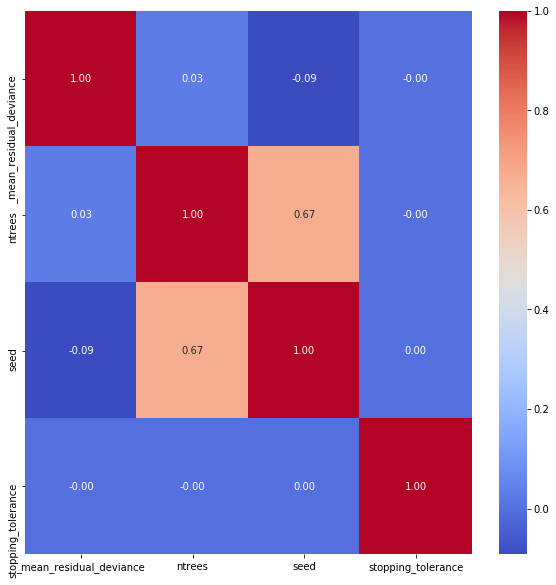

In [567]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'xrt_hm.png'
plt.figure(figsize=(10,10))
xrt_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

#### Calculate the range of the hyperparameter 

In [568]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop('_model_name', axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

9


['_mean_residual_deviance',
 'categorical_encoding',
 'distribution',
 'fold_assignment',
 'histogram_type',
 'ntrees',
 'seed',
 'stopping_metric',
 'stopping_tolerance']

In [569]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

2.6483232090218256e+16 2.4821773831486484e+16
AUTO AUTO
gaussian gaussian
Modulo Modulo
Random Random
35 13
8348626130045625785 -5061120222178819186
deviance deviance
0.011609086505314 0.011609086505314
9
[2.6483232090218256e+16, 'AUTO', 'gaussian', 'Modulo', 'Random', 35, 8348626130045625785, 'deviance', 0.011609086505314]


In [570]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
max,26483232090218256.00000,AUTO,gaussian,Modulo,Random,35,8348626130045625785,deviance,0.01161
min,24821773831486484.00000,AUTO,gaussian,Modulo,Random,13,-5061120222178819186,deviance,0.01161


In [571]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'xrt_range.csv'
range_df.to_csv(range_path,sep=',')

### For the following part of the gernerate hyperparameters, it's the same code but for four different type of models, which are XGB model, DL model, DRF model, GBM model, GLM model .

### Get the hyperparameter of XGB MODEL

In [572]:
# get the model folder
xgb_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/XGB'

In [573]:
# get all the model file in floder
xgb_ms = os.listdir(xgb_path)
print ('length: ', len (xgb_ms))
print(xgb_ms)

length:  92
['param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_054218_model_12.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_050348_model_13.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_034434_model_5.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_054218_model_5.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_040839_model_3.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_061247_model_3.json', 'param_CzanFF2000_XGBoost_2_AutoML_20190425_031629.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_054218_model_9.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_050348_model_3.json', 'param_CzanFF2000_XGBoost_1_AutoML_20190425_044008.json', 'param_CzanFF2000_XGBoost_3_AutoML_20190425_061247.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_044008_model_7.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_061247_model_11.json', 'param_CzanFF2000_XGBoost_grid_1_AutoML_20190425_061247_model_10.json', 'param_CzanFF2000_XGBoost_gr

In [574]:
# dataframe of all the model parameters
df_all = json_to_df(xgb_path, xgb_ms)

XGBoost_grid_1_AutoML_20190425_054218_model_12
XGBoost_grid_1_AutoML_20190425_050348_model_13
XGBoost_grid_1_AutoML_20190425_034434_model_5
XGBoost_grid_1_AutoML_20190425_054218_model_5
XGBoost_grid_1_AutoML_20190425_040839_model_3
XGBoost_grid_1_AutoML_20190425_061247_model_3
XGBoost_2_AutoML_20190425_031629
XGBoost_grid_1_AutoML_20190425_054218_model_9
XGBoost_grid_1_AutoML_20190425_050348_model_3
XGBoost_1_AutoML_20190425_044008
XGBoost_3_AutoML_20190425_061247
XGBoost_grid_1_AutoML_20190425_044008_model_7
XGBoost_grid_1_AutoML_20190425_061247_model_11
XGBoost_grid_1_AutoML_20190425_061247_model_10
XGBoost_grid_1_AutoML_20190425_044008_model_6
XGBoost_grid_1_AutoML_20190425_050348_model_2
XGBoost_grid_1_AutoML_20190425_034434_model_8
XGBoost_grid_1_AutoML_20190425_054218_model_8
XGBoost_grid_1_AutoML_20190425_061247_model_2
XGBoost_grid_1_AutoML_20190425_040839_model_2
XGBoost_grid_1_AutoML_20190425_054218_model_4
XGBoost_grid_1_AutoML_20190425_050348_model_12
XGBoost_grid_1_AutoML_

In [575]:
# table of all the parameter of all the model
df_all

,_mean_residual_deviance,_model_name,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,colsample_bylevel,colsample_bytree,distribution,dmatrix_type,eta,export_checkpoints_dir,fold_assignment,fold_column,gamma,gpu_id,grow_policy,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,learn_rate,max_abs_leafnode_pred,max_bins,max_delta_step,max_depth,max_leaves,max_runtime_secs,min_child_weight,min_data_in_leaf,min_rows,min_split_improvement,min_sum_hessian_in_leaf,model_IDbackend,model_IDbooster,model_IDcategorical_encoding,model_IDcol_sample_rate,model_IDcol_sample_rate_per_tree,model_IDcolsample_bylevel,model_IDcolsample_bytree,model_IDdistribution,model_IDdmatrix_type,model_IDeta,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDgamma,model_IDgpu_id,model_IDgrow_policy,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDmax_abs_leafnode_pred,model_IDmax_bins,model_IDmax_delta_step,model_IDmax_depth,model_IDmax_leaves,model_IDmax_runtime_secs,model_IDmin_child_weight,model_IDmin_data_in_leaf,model_IDmin_rows,model_IDmin_split_improvement,model_IDmin_sum_hessian_in_leaf,model_IDmodel_id,model_IDmonotone_constraints,model_IDnfolds,model_IDnormalize_type,model_IDnthread,model_IDntrees,model_IDoffset_column,model_IDone_drop,model_IDquiet_mode,model_IDrate_drop,model_IDreg_alpha,model_IDreg_lambda,model_IDresponse_column,model_IDsample_rate,model_IDsample_type,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDskip_drop,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDsubsample,model_IDtraining_frame,model_IDtree_method,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,monotone_constraints,nfolds,normalize_type,nthread,ntrees,offset_column,one_drop,quiet_mode,rate_drop,reg_alpha,reg_lambda,sample_rate,sample_type,score_each_iteration,score_tree_interval,seed,skip_drop,stopping_metric,stopping_rounds,stopping_tolerance,subsample,tree_method,tweedie_power,weights_column
0,24193380889541324.00000,XGBoost_grid_1_AutoML_20190425_054218_model_12,auto,gbtree,AUTO,1.00000,0.80000,1.00000,1.00000,AUTO,auto,0.30000,None,Modulo,None,0.00000,0,depthwise,True,False,False,True,0.05000,0.00000,256,0.00000,10,0,0.00000,1.00000,0.00000,3.00000,0.00000,100.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,5,tree,-1,123,None,False,True,0.00000,0.01000,0.10000,0.60000,uniform,False,5,2977682302805851952,0.00000,deviance,0,0.01161,1.00000,auto,1.50000,None
1,26481424079832496.00000,XGBoost_grid_1_AutoML_20190425_050348_model_13,auto,gbtree,AUTO,0.80000,0.80000,1.00000,1.00000,AUTO,auto,0.30000,None,Modulo,None,0.00000,0,depthwise,True,False,False,True,0.05000,0.00000,256,0.00000,5,0,0.00000,1.00000,0.00000,3.00000,0.00000,100.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,5,tree,-1,230,None,False,True,0.00000,0.00100,10.00000,0.80000,uniform,False,5,4915753551083076130,0.00000,deviance,0,0.01161,1.00000,auto,1.50000,None
2,23532474855228316.00000,XGBoost_grid_1_AutoML_20190425_034434_model_5,auto,gbtree,AUTO,1.00000,0.90000,1.00000,1.00000,AUTO,auto,0.30000,None,Modulo,None,0.00000,0,depthwise,True,False,False,True,0.05000,0.00000,256,0.00000,10,0,0.00000,1.00000,0.00000,3.00000,0.00000,100.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [576]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance
count,92.00000
mean,36035197059124368.00000
std,34259251773808432.00000
min,23382607125691124.00000
25%,24221102404935152.00000
50%,24756638256873492.00000
75%,27336863379643608.00000
max,215990325033176512.00000


### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [577]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

119


_mean_residual_deviance                          float64
_model_name                                       object
backend                                           object
booster                                           object
categorical_encoding                              object
col_sample_rate                                  float64
col_sample_rate_per_tree                         float64
colsample_bylevel                                float64
colsample_bytree                                 float64
distribution                                      object
dmatrix_type                                      object
eta                                              float64
export_checkpoints_dir                            object
fold_assignment                                   object
fold_column                                       object
gamma                                            float64
gpu_id                                             int64
grow_policy                    

In [578]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate,col_sample_rate_per_tree,colsample_bylevel,colsample_bytree,eta,gamma,gpu_id,learn_rate,max_abs_leafnode_pred,max_bins,max_delta_step,max_depth,max_leaves,max_runtime_secs,min_child_weight,min_data_in_leaf,min_rows,min_split_improvement,min_sum_hessian_in_leaf,model_IDbackend,model_IDbooster,model_IDcategorical_encoding,model_IDcol_sample_rate,model_IDcol_sample_rate_per_tree,model_IDcolsample_bylevel,model_IDcolsample_bytree,model_IDdistribution,model_IDdmatrix_type,model_IDeta,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDgamma,model_IDgpu_id,model_IDgrow_policy,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDmax_abs_leafnode_pred,model_IDmax_bins,model_IDmax_delta_step,model_IDmax_depth,model_IDmax_leaves,model_IDmax_runtime_secs,model_IDmin_child_weight,model_IDmin_data_in_leaf,model_IDmin_rows,model_IDmin_split_improvement,model_IDmin_sum_hessian_in_leaf,model_IDmodel_id,model_IDmonotone_constraints,model_IDnfolds,model_IDnormalize_type,model_IDnthread,model_IDntrees,model_IDoffset_column,model_IDone_drop,model_IDquiet_mode,model_IDrate_drop,model_IDreg_alpha,model_IDreg_lambda,model_IDresponse_column,model_IDsample_rate,model_IDsample_type,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDskip_drop,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDsubsample,model_IDtraining_frame,model_IDtree_method,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nthread,ntrees,rate_drop,reg_alpha,reg_lambda,sample_rate,score_tree_interval,seed,skip_drop,stopping_rounds,stopping_tolerance,subsample,tweedie_power
count,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000
mean,36035197059124368.00000,0.79783,0.84239,1.00000,1.00000,0.30000,0.00000,0.00000,0.05000,0.00000,256.00000,0.00000,10.92391,0.00000,0.00000,1.00000,0.00000,4.97359,0.00000,100.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5.00000,-1.00000,121.82609,0.00000,0.31452,9.99482,0.78478,5.00000,-157211796205702944.00000,0.00000,0.00000,0.01161,1.00000,1.50000
std,34259251773808432.00000,0.14372,0.10402,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,5.97289,0.00000,0.00000,0.00000,0.00000,5.68629,0.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,0.00000,59.76871,0.00000,0.41245,28.05953,0.13981,0.00000,5264360994429481984.00000,0.00000,0.00000,0.00000,0.00000,0.00000
min,23382607125691124.00000,0.60000,0.70000,1.00000,1.00000,0.30000,0.00000,0.00000,0.05000,0.00000,256.00000,0.00000,5.00000,0.00000,0.00000,1.00000,0.00000,0.01000,0.00000,100.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,

In [579]:
# relevance 
dec = df.corr()
print(len(dec))
dec

102


,_mean_residual_deviance,col_sample_rate,col_sample_rate_per_tree,colsample_bylevel,colsample_bytree,eta,gamma,gpu_id,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,learn_rate,max_abs_leafnode_pred,max_bins,max_delta_step,max_depth,max_leaves,max_runtime_secs,min_child_weight,min_data_in_leaf,min_rows,min_split_improvement,min_sum_hessian_in_leaf,model_IDbackend,model_IDbooster,model_IDcategorical_encoding,model_IDcol_sample_rate,model_IDcol_sample_rate_per_tree,model_IDcolsample_bylevel,model_IDcolsample_bytree,model_IDdistribution,model_IDdmatrix_type,model_IDeta,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDgamma,model_IDgpu_id,model_IDgrow_policy,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDmax_abs_leafnode_pred,model_IDmax_bins,model_IDmax_delta_step,model_IDmax_depth,model_IDmax_leaves,model_IDmax_runtime_secs,model_IDmin_child_weight,model_IDmin_data_in_leaf,model_IDmin_rows,model_IDmin_split_improvement,model_IDmin_sum_hessian_in_leaf,model_IDmodel_id,model_IDmonotone_constraints,model_IDnfolds,model_IDnormalize_type,model_IDnthread,model_IDntrees,model_IDoffset_column,model_IDone_drop,model_IDquiet_mode,model_IDrate_drop,model_IDreg_alpha,model_IDreg_lambda,model_IDresponse_column,model_IDsample_rate,model_IDsample_type,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDskip_drop,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDsubsample,model_IDtraining_frame,model_IDtree_method,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nthread,ntrees,one_drop,quiet_mode,rate_drop,reg_alpha,reg_lambda,sample_rate,score_each_iteration,score_tree_interval,seed,skip_drop,stopping_rounds,stopping_tolerance,subsample,tweedie_power
_mean_residual_deviance,1.00000,-0.08920,-0.07318,nan,nan,-0.00000,nan,nan,nan,nan,nan,nan,0.00000,nan,nan,nan,-0.09502,nan,nan,nan,nan,0.09019,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.32645,nan,nan,nan,-0.11020,0.48186,-0.05436,nan,nan,0.03406,nan,nan,-0.00000,nan,nan
col_sample_rate,-0.08920,1.00000,-0.11138,nan,nan,-0.00000,nan,nan,nan,nan,nan,nan,0.00000,nan,nan,nan,-0.01044,nan,nan,nan,nan,0.04769,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.09309,nan,nan,nan,0.03428,0.00021,0.12960,nan,nan,0.10429,nan,nan,-0.00000,nan,nan
col_sample_rate_per_tree,-0.07318,-0.11138,1.00000,nan,nan,-0.00000,nan,nan,nan,nan,nan,nan,0.00000,nan,nan,nan,0.05123,nan,nan,nan,nan,-0.04316,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.20199,nan,nan,nan,0.18105,0.06039,-0.25740,nan,nan,0.14435,nan,nan,-0.00000,nan,nan
colsample_bylevel,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
colsample_bytree,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,

In [580]:
# get the msd's relevant column, because this is the target column
dec_msd = dec['_mean_residual_deviance']
print(len(dec_msd))
dec_msd


102


_mean_residual_deviance                          1.00000
col_sample_rate                                 -0.08920
col_sample_rate_per_tree                        -0.07318
colsample_bylevel                                    nan
colsample_bytree                                     nan
eta                                             -0.00000
gamma                                                nan
gpu_id                                               nan
ignore_const_cols                                    nan
keep_cross_validation_fold_assignment                nan
keep_cross_validation_models                         nan
keep_cross_validation_predictions                    nan
learn_rate                                       0.00000
max_abs_leafnode_pred                                nan
max_bins                                             nan
max_delta_step                                       nan
max_depth                                       -0.09502
max_leaves                     

In [581]:
# get the null columns in msd's relevant column
dec_msd_nan = dec_msd.index[np.where(np.isnan(dec_msd))[0]]
print(len(dec_msd_nan))
dec_msd_nan

89


Index(['colsample_bylevel', 'colsample_bytree', 'gamma', 'gpu_id',
       'ignore_const_cols', 'keep_cross_validation_fold_assignment',
       'keep_cross_validation_models', 'keep_cross_validation_predictions',
       'max_abs_leafnode_pred', 'max_bins', 'max_delta_step', 'max_leaves',
       'max_runtime_secs', 'min_child_weight', 'min_data_in_leaf',
       'min_split_improvement', 'min_sum_hessian_in_leaf', 'model_IDbackend',
       'model_IDbooster', 'model_IDcategorical_encoding',
       'model_IDcol_sample_rate', 'model_IDcol_sample_rate_per_tree',
       'model_IDcolsample_bylevel', 'model_IDcolsample_bytree',
       'model_IDdistribution', 'model_IDdmatrix_type', 'model_IDeta',
       'model_IDexport_checkpoints_dir', 'model_IDfold_assignment',
       'model_IDfold_column', 'model_IDgamma', 'model_IDgpu_id',
       'model_IDgrow_policy', 'model_IDignore_const_cols',
       'model_IDignored_columns',
       'model_IDkeep_cross_validation_fold_assignment',
       'model_IDkeep_cr

In [582]:
# make it as a list, so we can drop it
dec_msd_nan_list = dec_msd_nan.tolist()
dec_msd_nan_list

['colsample_bylevel',
 'colsample_bytree',
 'gamma',
 'gpu_id',
 'ignore_const_cols',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'max_abs_leafnode_pred',
 'max_bins',
 'max_delta_step',
 'max_leaves',
 'max_runtime_secs',
 'min_child_weight',
 'min_data_in_leaf',
 'min_split_improvement',
 'min_sum_hessian_in_leaf',
 'model_IDbackend',
 'model_IDbooster',
 'model_IDcategorical_encoding',
 'model_IDcol_sample_rate',
 'model_IDcol_sample_rate_per_tree',
 'model_IDcolsample_bylevel',
 'model_IDcolsample_bytree',
 'model_IDdistribution',
 'model_IDdmatrix_type',
 'model_IDeta',
 'model_IDexport_checkpoints_dir',
 'model_IDfold_assignment',
 'model_IDfold_column',
 'model_IDgamma',
 'model_IDgpu_id',
 'model_IDgrow_policy',
 'model_IDignore_const_cols',
 'model_IDignored_columns',
 'model_IDkeep_cross_validation_fold_assignment',
 'model_IDkeep_cross_validation_models',
 'model_IDkeep_cross_validation_predictions',
 'mod

In [583]:
# drop the nan columns in parameter table
df = df.drop(dec_msd_nan_list, axis = 1)
df

,_mean_residual_deviance,_model_name,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,dmatrix_type,eta,export_checkpoints_dir,fold_assignment,fold_column,grow_policy,learn_rate,max_depth,min_rows,monotone_constraints,normalize_type,ntrees,offset_column,reg_alpha,reg_lambda,sample_rate,sample_type,seed,stopping_metric,stopping_tolerance,tree_method,weights_column
0,24193380889541324.00000,XGBoost_grid_1_AutoML_20190425_054218_model_12,auto,gbtree,AUTO,1.00000,0.80000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,10,3.00000,None,tree,123,None,0.01000,0.10000,0.60000,uniform,2977682302805851952,deviance,0.01161,auto,None
1,26481424079832496.00000,XGBoost_grid_1_AutoML_20190425_050348_model_13,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,3.00000,None,tree,230,None,0.00100,10.00000,0.80000,uniform,4915753551083076130,deviance,0.01161,auto,None
2,23532474855228316.00000,XGBoost_grid_1_AutoML_20190425_034434_model_5,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,10,3.00000,None,tree,132,None,0.10000,1.00000,0.60000,uniform,2272108584447827933,deviance,0.01161,auto,None
3,25356194267686344.00000,XGBoost_grid_1_AutoML_20190425_054218_model_5,auto,gbtree,AUTO,1.00000,0.70000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,10,0.10000,None,tree,317,None,1.00000,100.00000,1.00000,uniform,-220612972657063119,deviance,0.01161,auto,None
4,27015205134244564.00000,XGBoost_grid_1_AutoML_20190425_040839_model_3,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,10.00000,None,tree,162,None,1.00000,0.00100,0.80000,uniform,604549568096783977,deviance,0.01161,auto,None
5,24825256448338740.00000,XGBoost_grid_1_AutoML_20190425_061247_model_3,auto,gbtree,AUTO,1.00000,1.00000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,1.00000,None,tree,254,None,0.00100,1.00000,0.60000,uniform,81578391032172089,deviance,0.01161,auto,None
6,24645684223842348.00000,XGBoost_2_AutoML_20190425_031629,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,3.00000,None,tree,98,None,0.00000,1.00000,0.80000,uniform,-7716342643894783951,deviance,0.01161,auto,None
7,24147056604861600.00000,XGBoost_grid_1_AutoML_20190425_054218_model_9,auto,gbtree,AUTO,0.80000,0.90000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,0.01000,None,tree,231,None,0.00100,0.10000,1.00000,uniform,-2173971084511364982,deviance,0.01161,auto,None
8,24834461101080704.00000,XGBoost_grid_1_AutoML_20190425_050348_model_3,auto,gbtree,AUTO,0.60000,1.00000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,20,0.10000,None,tree,98,None,0.50000,0.01000,0.60000,uniform,-3384676310408015048,deviance,0.01161,auto,None
9,23946398297111744.00000,XGBoost_1_AutoML_20190425_044008,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,None,Modulo,None,depthwise,0.05000,5,3.00000,None,tree,104,None,0.00000,1.00000,0.80000,uniform,-5125921721342670463,deviance,0.01161,auto,None


In [584]:
# drop the none columns in parameter table
df = df.drop(columns = [
    'export_checkpoints_dir',
    'fold_column',
    'offset_column',
    'monotone_constraints',
    'weights_column',  
    ]
    , axis = 1)
df

,_mean_residual_deviance,_model_name,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,dmatrix_type,eta,fold_assignment,grow_policy,learn_rate,max_depth,min_rows,normalize_type,ntrees,reg_alpha,reg_lambda,sample_rate,sample_type,seed,stopping_metric,stopping_tolerance,tree_method
0,24193380889541324.00000,XGBoost_grid_1_AutoML_20190425_054218_model_12,auto,gbtree,AUTO,1.00000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,3.00000,tree,123,0.01000,0.10000,0.60000,uniform,2977682302805851952,deviance,0.01161,auto
1,26481424079832496.00000,XGBoost_grid_1_AutoML_20190425_050348_model_13,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,230,0.00100,10.00000,0.80000,uniform,4915753551083076130,deviance,0.01161,auto
2,23532474855228316.00000,XGBoost_grid_1_AutoML_20190425_034434_model_5,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,3.00000,tree,132,0.10000,1.00000,0.60000,uniform,2272108584447827933,deviance,0.01161,auto
3,25356194267686344.00000,XGBoost_grid_1_AutoML_20190425_054218_model_5,auto,gbtree,AUTO,1.00000,0.70000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,0.10000,tree,317,1.00000,100.00000,1.00000,uniform,-220612972657063119,deviance,0.01161,auto
4,27015205134244564.00000,XGBoost_grid_1_AutoML_20190425_040839_model_3,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,10.00000,tree,162,1.00000,0.00100,0.80000,uniform,604549568096783977,deviance,0.01161,auto
5,24825256448338740.00000,XGBoost_grid_1_AutoML_20190425_061247_model_3,auto,gbtree,AUTO,1.00000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,1.00000,tree,254,0.00100,1.00000,0.60000,uniform,81578391032172089,deviance,0.01161,auto
6,24645684223842348.00000,XGBoost_2_AutoML_20190425_031629,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,98,0.00000,1.00000,0.80000,uniform,-7716342643894783951,deviance,0.01161,auto
7,24147056604861600.00000,XGBoost_grid_1_AutoML_20190425_054218_model_9,auto,gbtree,AUTO,0.80000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,0.01000,tree,231,0.00100,0.10000,1.00000,uniform,-2173971084511364982,deviance,0.01161,auto
8,24834461101080704.00000,XGBoost_grid_1_AutoML_20190425_050348_model_3,auto,gbtree,AUTO,0.60000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,20,0.10000,tree,98,0.50000,0.01000,0.60000,uniform,-3384676310408015048,deviance,0.01161,auto
9,23946398297111744.00000,XGBoost_1_AutoML_20190425_044008,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,104,0.00000,1.00000,0.80000,uniform,-5125921721342670463,deviance,0.01161,auto


In [585]:
# get dummy variable
onehot_encoding_booster = pd.get_dummies(df['booster'], prefix = 'booster')
df = pd.concat([df, onehot_encoding_booster], axis=1)
df

,_mean_residual_deviance,_model_name,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,dmatrix_type,eta,fold_assignment,grow_policy,learn_rate,max_depth,min_rows,normalize_type,ntrees,reg_alpha,reg_lambda,sample_rate,sample_type,seed,stopping_metric,stopping_tolerance,tree_method,booster_dart,booster_gbtree
0,24193380889541324.00000,XGBoost_grid_1_AutoML_20190425_054218_model_12,auto,gbtree,AUTO,1.00000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,3.00000,tree,123,0.01000,0.10000,0.60000,uniform,2977682302805851952,deviance,0.01161,auto,0,1
1,26481424079832496.00000,XGBoost_grid_1_AutoML_20190425_050348_model_13,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,230,0.00100,10.00000,0.80000,uniform,4915753551083076130,deviance,0.01161,auto,0,1
2,23532474855228316.00000,XGBoost_grid_1_AutoML_20190425_034434_model_5,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,3.00000,tree,132,0.10000,1.00000,0.60000,uniform,2272108584447827933,deviance,0.01161,auto,0,1
3,25356194267686344.00000,XGBoost_grid_1_AutoML_20190425_054218_model_5,auto,gbtree,AUTO,1.00000,0.70000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,10,0.10000,tree,317,1.00000,100.00000,1.00000,uniform,-220612972657063119,deviance,0.01161,auto,0,1
4,27015205134244564.00000,XGBoost_grid_1_AutoML_20190425_040839_model_3,auto,gbtree,AUTO,1.00000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,10.00000,tree,162,1.00000,0.00100,0.80000,uniform,604549568096783977,deviance,0.01161,auto,0,1
5,24825256448338740.00000,XGBoost_grid_1_AutoML_20190425_061247_model_3,auto,gbtree,AUTO,1.00000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,1.00000,tree,254,0.00100,1.00000,0.60000,uniform,81578391032172089,deviance,0.01161,auto,0,1
6,24645684223842348.00000,XGBoost_2_AutoML_20190425_031629,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,98,0.00000,1.00000,0.80000,uniform,-7716342643894783951,deviance,0.01161,auto,0,1
7,24147056604861600.00000,XGBoost_grid_1_AutoML_20190425_054218_model_9,auto,gbtree,AUTO,0.80000,0.90000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,0.01000,tree,231,0.00100,0.10000,1.00000,uniform,-2173971084511364982,deviance,0.01161,auto,0,1
8,24834461101080704.00000,XGBoost_grid_1_AutoML_20190425_050348_model_3,auto,gbtree,AUTO,0.60000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,20,0.10000,tree,98,0.50000,0.01000,0.60000,uniform,-3384676310408015048,deviance,0.01161,auto,0,1
9,23946398297111744.00000,XGBoost_1_AutoML_20190425_044008,auto,gbtree,AUTO,0.80000,0.80000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,3.00000,tree,104,0.00000,1.00000,0.80000,uniform,-5125921721342670463,deviance,0.01161,auto,0,1


In [586]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate,col_sample_rate_per_tree,eta,learn_rate,max_depth,min_rows,ntrees,reg_alpha,reg_lambda,sample_rate,seed,stopping_tolerance,booster_dart,booster_gbtree
count,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000,92.00000
mean,36035197059124368.00000,0.79783,0.84239,0.30000,0.05000,10.92391,4.97359,121.82609,0.31452,9.99482,0.78478,-157211796205702944.00000,0.01161,0.27174,0.72826
std,34259251773808432.00000,0.14372,0.10402,0.00000,0.00000,5.97289,5.68629,59.76871,0.41245,28.05953,0.13981,5264360994429481984.00000,0.00000,0.44729,0.44729
min,23382607125691124.00000,0.60000,0.70000,0.30000,0.05000,5.00000,0.01000,2.00000,0.00000,0.00100,0.60000,-9085632511738749952.00000,0.01161,0.00000,0.00000
25%,24221102404935152.00000,0.60000,0.80000,0.30000,0.05000,5.00000,1.00000,98.00000,0.00100,0.01000,0.60000,-4840875397309902848.00000,0.01161,0.00000,0.00000
50%,24756638256873492.00000,0.80000,0.80000,0.30000,0.05000,10.00000,3.00000,104.00000,0.01000,1.00000,0.80000,281021357299277952.00000,0.01161,0.00000,1.00000
75%,27336863379643608.00000,0.85000,0.90000,0.30000,0.05000,15.00000,5.00000,134.00000,0.50000,1.00000,0.80000,3419532188604873728.00000,0.01161,1.00000,1.00000
max,215990325033176512.00000,1.00000,1.00000,0.30000,0.05000,20.00000,20.00000,342.00000,1.00000,100.00000,1.00000,9029067611563076608.00000,0.01161,1.00000,1.00000


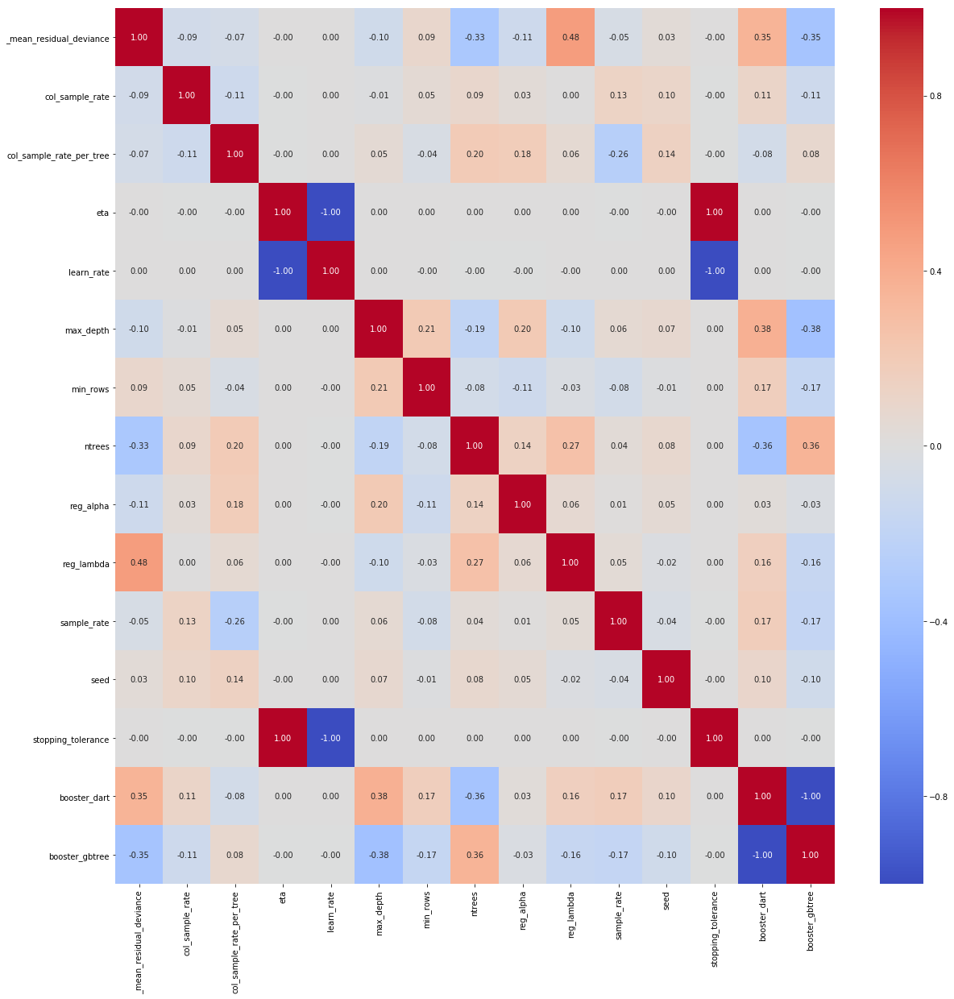

In [587]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'xgb_hm.png'
plt.figure(figsize=(20,20))
xgb_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

In [588]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop(['_model_name','booster_dart','booster_gbtree',], axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

24


['_mean_residual_deviance',
 'backend',
 'booster',
 'categorical_encoding',
 'col_sample_rate',
 'col_sample_rate_per_tree',
 'distribution',
 'dmatrix_type',
 'eta',
 'fold_assignment',
 'grow_policy',
 'learn_rate',
 'max_depth',
 'min_rows',
 'normalize_type',
 'ntrees',
 'reg_alpha',
 'reg_lambda',
 'sample_rate',
 'sample_type',
 'seed',
 'stopping_metric',
 'stopping_tolerance',
 'tree_method']

In [589]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

2.159903250331765e+17 2.3382607125691124e+16
auto auto
gbtree dart
AUTO AUTO
1.0 0.6000000000000001
1.0 0.7000000000000001
AUTO AUTO
auto auto
0.30000000000000004 0.30000000000000004
Modulo Modulo
depthwise depthwise
0.05 0.05
20 5
20.0 0.01
tree tree
342 2
1.0 0.0
100.0 0.001
1.0 0.6000000000000001
uniform uniform
9029067611563076446 -9085632511738749858
deviance deviance
0.011609086505314 0.011609086505314
auto auto
24
[2.159903250331765e+17, 'auto', 'gbtree', 'AUTO', 1.0, 1.0, 'AUTO', 'auto', 0.30000000000000004, 'Modulo', 'depthwise', 0.05, 20, 20.0, 'tree', 342, 1.0, 100.0, 1.0, 'uniform', 9029067611563076446, 'deviance', 0.011609086505314, 'auto']


In [590]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,dmatrix_type,eta,fold_assignment,grow_policy,learn_rate,max_depth,min_rows,normalize_type,ntrees,reg_alpha,reg_lambda,sample_rate,sample_type,seed,stopping_metric,stopping_tolerance,tree_method
max,215990325033176512.00000,auto,gbtree,AUTO,1.00000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,20,20.00000,tree,342,1.00000,100.00000,1.00000,uniform,9029067611563076446,deviance,0.01161,auto
min,23382607125691124.00000,auto,dart,AUTO,0.60000,0.70000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,0.01000,tree,2,0.00000,0.00100,0.60000,uniform,-9085632511738749858,deviance,0.01161,auto


In [591]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'xgb_range.csv'
range_df.to_csv(range_path,sep=',')

### Get the hyperparameter of DL MODEL

In [944]:
# get the model folder
dl_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/DL'

In [945]:
# get all the model file in floder
dl_ms = os.listdir(dl_path)
print(dl_ms)
print ('length: ', len (dl_ms))

['param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_050348_model_5.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_044008_model_1.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_031629_model_3.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_050348_model_9.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_061247_model_5.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_054218_model_3.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_034434_model_3.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_040839_model_5.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_040839_model_4.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_034434_model_2.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_054218_model_2.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_061247_model_4.json', 'param_CzanFF2000_DeepLearning_grid_1_AutoML_20190425_050348_model_8.json', 'param_Czan

In [946]:
# dataframe of all the model parameters
df_all = json_to_df(dl_path, dl_ms)

DeepLearning_grid_1_AutoML_20190425_050348_model_5
DeepLearning_grid_1_AutoML_20190425_044008_model_1
DeepLearning_grid_1_AutoML_20190425_031629_model_3
DeepLearning_grid_1_AutoML_20190425_050348_model_9
DeepLearning_grid_1_AutoML_20190425_061247_model_5
DeepLearning_grid_1_AutoML_20190425_054218_model_3
DeepLearning_grid_1_AutoML_20190425_034434_model_3
DeepLearning_grid_1_AutoML_20190425_040839_model_5
DeepLearning_grid_1_AutoML_20190425_040839_model_4
DeepLearning_grid_1_AutoML_20190425_034434_model_2
DeepLearning_grid_1_AutoML_20190425_054218_model_2
DeepLearning_grid_1_AutoML_20190425_061247_model_4
DeepLearning_grid_1_AutoML_20190425_050348_model_8
DeepLearning_1_AutoML_20190425_061247
DeepLearning_grid_1_AutoML_20190425_031629_model_2
DeepLearning_grid_1_AutoML_20190425_061247_model_8
DeepLearning_grid_1_AutoML_20190425_050348_model_4
DeepLearning_grid_1_AutoML_20190425_061247_model_3
DeepLearning_1_AutoML_20190425_040839
DeepLearning_grid_1_AutoML_20190425_054218_model_5
DeepLe

In [947]:
df_all

,_mean_residual_deviance,_model_name,activation,adaptive_rate,autoencoder,average_activation,balance_classes,categorical_encoding,checkpoint,class_sampling_factors,classification_stop,col_major,diagnostics,distribution,elastic_averaging,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,export_checkpoints_dir,export_weights_and_biases,fast_mode,fold_assignment,fold_column,force_load_balance,hidden,hidden_dropout_ratios,huber_alpha,ignore_const_cols,initial_biases,initial_weight_distribution,initial_weight_scale,initial_weights,input_dropout_ratio,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,l1,l2,loss,max_after_balance_size,max_categorical_features,max_confusion_matrix_size,max_hit_ratio_k,max_runtime_secs,max_w2,mini_batch_size,missing_values_handling,model_IDactivation,model_IDadaptive_rate,model_IDautoencoder,model_IDaverage_activation,model_IDbalance_classes,model_IDcategorical_encoding,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDclassification_stop,model_IDcol_major,model_IDdiagnostics,model_IDdistribution,model_IDelastic_averaging,model_IDelastic_averaging_moving_rate,model_IDelastic_averaging_regularization,model_IDepochs,model_IDepsilon,model_IDexport_checkpoints_dir,model_IDexport_weights_and_biases,model_IDfast_mode,model_IDfold_assignment,model_IDfold_column,model_IDforce_load_balance,model_IDhidden,model_IDhidden_dropout_ratios,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDinitial_biases,model_IDinitial_weight_distribution,model_IDinitial_weight_scale,model_IDinitial_weights,model_IDinput_dropout_ratio,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDl1,model_IDl2,model_IDloss,model_IDmax_after_balance_size,model_IDmax_categorical_features,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmax_w2,model_IDmini_batch_size,model_IDmissing_values_handling,model_IDmodel_id,model_IDmomentum_ramp,model_IDmomentum_stable,model_IDmomentum_start,model_IDnesterov_accelerated_gradient,model_IDnfolds,model_IDoffset_column,model_IDoverwrite_with_best_model,model_IDpretrained_autoencoder,model_IDquantile_alpha,model_IDquiet_mode,model_IDrate,model_IDrate_annealing,model_IDrate_decay,model_IDregression_stop,model_IDreplicate_training_data,model_IDreproducible,model_IDresponse_column,model_IDrho,model_IDscore_duty_cycle,model_IDscore_each_iteration,model_IDscore_interval,model_IDscore_training_samples,model_IDscore_validation_samples,model_IDscore_validation_sampling,model_IDseed,model_IDshuffle_training_data,model_IDsingle_node_mode,model_IDsparse,model_IDsparsity_beta,model_IDstandardize,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtarget_ratio_comm_to_comp,model_IDtrain_samples_per_iteration,model_IDtraining_frame,model_IDtweedie_power,model_IDuse_all_factor_levels,model_IDvalidation_frame,model_IDvariable_importances,model_IDweights_column,momentum_ramp,momentum_stable,momentum_start,nesterov_accelerated_gradient,nfolds,offset_column,overwrite_with_best_model,pretrained_autoencoder,quantile_alpha,quiet_mode,rate,rate_annealing,rate_decay,regression_stop,replicate_training_data,reproducible,rho,score_duty_cycle,score_each_iteration,score_interval,score_training_samples,score_validation_samples,score_validation_sampling,seed,shuffle_training_data,single_node_mode,sparse,sparsity_beta,standardize,stopping_metric,stopping_rounds,stopping_tolerance,target_ratio_comm_to_comp,train_samples_per_iteration,tweedie_power,use_all_factor_levels,variable_importances,weights_column
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,True,False,0.00000,False,AUTO,None,None,0.00000,False,True,AUTO,False,0.90000,0.00100,30.40000,0.00000,None,False,True,Modulo,None,True,"[200, 200]","[0.30000000000000004, 0.300000000

In [948]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance
count,54.00000
mean,38923303401383704.00000
std,5094455739366425.00000
min,30167347574307860.00000
25%,35142720556902700.00000
50%,37782115334146000.00000
75%,41481071648866432.00000
max,56204217974007896.00000


### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [949]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

175


_mean_residual_deviance                          float64
_model_name                                       object
activation                                        object
adaptive_rate                                       bool
autoencoder                                         bool
average_activation                               float64
balance_classes                                     bool
categorical_encoding                              object
checkpoint                                        object
class_sampling_factors                            object
classification_stop                              float64
col_major                                           bool
diagnostics                                         bool
distribution                                      object
elastic_averaging                                   bool
elastic_averaging_moving_rate                    float64
elastic_averaging_regularization                 float64
epochs                         

In [950]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,average_activation,classification_stop,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,huber_alpha,initial_weight_scale,input_dropout_ratio,l1,l2,max_after_balance_size,max_categorical_features,max_confusion_matrix_size,max_hit_ratio_k,max_runtime_secs,max_w2,mini_batch_size,model_IDactivation,model_IDadaptive_rate,model_IDautoencoder,model_IDaverage_activation,model_IDbalance_classes,model_IDcategorical_encoding,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDclassification_stop,model_IDcol_major,model_IDdiagnostics,model_IDdistribution,model_IDelastic_averaging,model_IDelastic_averaging_moving_rate,model_IDelastic_averaging_regularization,model_IDepochs,model_IDepsilon,model_IDexport_checkpoints_dir,model_IDexport_weights_and_biases,model_IDfast_mode,model_IDfold_assignment,model_IDfold_column,model_IDforce_load_balance,model_IDhidden,model_IDhidden_dropout_ratios,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDinitial_biases,model_IDinitial_weight_distribution,model_IDinitial_weight_scale,model_IDinitial_weights,model_IDinput_dropout_ratio,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDl1,model_IDl2,model_IDloss,model_IDmax_after_balance_size,model_IDmax_categorical_features,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmax_w2,model_IDmini_batch_size,model_IDmissing_values_handling,model_IDmodel_id,model_IDmomentum_ramp,model_IDmomentum_stable,model_IDmomentum_start,model_IDnesterov_accelerated_gradient,model_IDnfolds,model_IDoffset_column,model_IDoverwrite_with_best_model,model_IDpretrained_autoencoder,model_IDquantile_alpha,model_IDquiet_mode,model_IDrate,model_IDrate_annealing,model_IDrate_decay,model_IDregression_stop,model_IDreplicate_training_data,model_IDreproducible,model_IDresponse_column,model_IDrho,model_IDscore_duty_cycle,model_IDscore_each_iteration,model_IDscore_interval,model_IDscore_training_samples,model_IDscore_validation_samples,model_IDscore_validation_sampling,model_IDseed,model_IDshuffle_training_data,model_IDsingle_node_mode,model_IDsparse,model_IDsparsity_beta,model_IDstandardize,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtarget_ratio_comm_to_comp,model_IDtrain_samples_per_iteration,model_IDtraining_frame,model_IDtweedie_power,model_IDuse_all_factor_levels,model_IDvalidation_frame,model_IDvariable_importances,model_IDweights_column,momentum_ramp,momentum_stable,momentum_start,nfolds,quantile_alpha,rate,rate_annealing,rate_decay,regression_stop,rho,score_duty_cycle,score_interval,score_training_samples,score_validation_samples,seed,sparsity_beta,stopping_rounds,stopping_tolerance,target_ratio_comm_to_comp,train_samples_per_iteration,tweedie_power
count,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000
mean,38923303401383704.00000,0.00000,

In [951]:
# relevance 
dec = df.corr()
print(len(dec))
dec

154


,_mean_residual_deviance,adaptive_rate,autoencoder,average_activation,balance_classes,classification_stop,col_major,diagnostics,elastic_averaging,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,export_weights_and_biases,fast_mode,force_load_balance,huber_alpha,ignore_const_cols,initial_weight_scale,input_dropout_ratio,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,l1,l2,max_after_balance_size,max_categorical_features,max_confusion_matrix_size,max_hit_ratio_k,max_runtime_secs,max_w2,mini_batch_size,model_IDactivation,model_IDadaptive_rate,model_IDautoencoder,model_IDaverage_activation,model_IDbalance_classes,model_IDcategorical_encoding,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDclassification_stop,model_IDcol_major,model_IDdiagnostics,model_IDdistribution,model_IDelastic_averaging,model_IDelastic_averaging_moving_rate,model_IDelastic_averaging_regularization,model_IDepochs,model_IDepsilon,model_IDexport_checkpoints_dir,model_IDexport_weights_and_biases,model_IDfast_mode,model_IDfold_assignment,model_IDfold_column,model_IDforce_load_balance,model_IDhidden,model_IDhidden_dropout_ratios,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDinitial_biases,model_IDinitial_weight_distribution,model_IDinitial_weight_scale,model_IDinitial_weights,model_IDinput_dropout_ratio,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDl1,model_IDl2,model_IDloss,model_IDmax_after_balance_size,model_IDmax_categorical_features,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmax_w2,model_IDmini_batch_size,model_IDmissing_values_handling,model_IDmodel_id,model_IDmomentum_ramp,model_IDmomentum_stable,model_IDmomentum_start,model_IDnesterov_accelerated_gradient,model_IDnfolds,model_IDoffset_column,model_IDoverwrite_with_best_model,model_IDpretrained_autoencoder,model_IDquantile_alpha,model_IDquiet_mode,model_IDrate,model_IDrate_annealing,model_IDrate_decay,model_IDregression_stop,model_IDreplicate_training_data,model_IDreproducible,model_IDresponse_column,model_IDrho,model_IDscore_duty_cycle,model_IDscore_each_iteration,model_IDscore_interval,model_IDscore_training_samples,model_IDscore_validation_samples,model_IDscore_validation_sampling,model_IDseed,model_IDshuffle_training_data,model_IDsingle_node_mode,model_IDsparse,model_IDsparsity_beta,model_IDstandardize,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtarget_ratio_comm_to_comp,model_IDtrain_samples_per_iteration,model_IDtraining_frame,model_IDtweedie_power,model_IDuse_all_factor_levels,model_IDvalidation_frame,model_IDvariable_importances,model_IDweights_column,momentum_ramp,momentum_stable,momentum_start,nesterov_accelerated_gradient,nfolds,overwrite_with_best_model,quantile_alpha,quiet_mode,rate,rate_annealing,rate_decay,regression_stop,replicate_training_data,reproducible,rho,score_duty_cycle,score_each_iteration,score_interval,score_training_samples,score_validation_samples,seed,shuffle_training_data,single_node_mode,sparse,sparsity_beta,standardize,stopping_rounds,stopping_tolerance,target_ratio_comm_to_comp,train_samples_per_iteration,tweedie_power,use_all_factor_levels,variable_importances
_mean_residual_deviance,1.00000,nan,nan,nan,nan,nan,nan,nan,nan,-0.00000,0.00000,-0.23366,0.22815,nan,nan,nan,-0.00000,nan,nan,0.48016,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,-0.00000,nan,-0.00000,nan,nan,-0.16181,-0.00000,na

In [952]:
# get the msd's relevant column, because this is the target column
dec_msd = dec['_mean_residual_deviance']
print(len(dec_msd))
dec_msd


154


_mean_residual_deviance                          1.00000
adaptive_rate                                        nan
autoencoder                                          nan
average_activation                                   nan
balance_classes                                      nan
classification_stop                                  nan
col_major                                            nan
diagnostics                                          nan
elastic_averaging                                    nan
elastic_averaging_moving_rate                   -0.00000
elastic_averaging_regularization                 0.00000
epochs                                          -0.23366
epsilon                                          0.22815
export_weights_and_biases                            nan
fast_mode                                            nan
force_load_balance                                   nan
huber_alpha                                     -0.00000
ignore_const_cols              

In [953]:
# get the null columns in msd's relevant column
dec_msd_nan = dec_msd.index[np.where(np.isnan(dec_msd))[0]]
print(len(dec_msd_nan))
dec_msd_nan

138


Index(['adaptive_rate', 'autoencoder', 'average_activation', 'balance_classes',
       'classification_stop', 'col_major', 'diagnostics', 'elastic_averaging',
       'export_weights_and_biases', 'fast_mode',
       ...
       'shuffle_training_data', 'single_node_mode', 'sparse', 'sparsity_beta',
       'standardize', 'stopping_rounds', 'train_samples_per_iteration',
       'tweedie_power', 'use_all_factor_levels', 'variable_importances'],
      dtype='object', length=138)

In [954]:
# make it as a list, so we can drop it
dec_msd_nan_list = dec_msd_nan.tolist()
dec_msd_nan_list

['adaptive_rate',
 'autoencoder',
 'average_activation',
 'balance_classes',
 'classification_stop',
 'col_major',
 'diagnostics',
 'elastic_averaging',
 'export_weights_and_biases',
 'fast_mode',
 'force_load_balance',
 'ignore_const_cols',
 'initial_weight_scale',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'l1',
 'l2',
 'max_after_balance_size',
 'max_categorical_features',
 'max_confusion_matrix_size',
 'max_hit_ratio_k',
 'max_runtime_secs',
 'mini_batch_size',
 'model_IDactivation',
 'model_IDadaptive_rate',
 'model_IDautoencoder',
 'model_IDaverage_activation',
 'model_IDbalance_classes',
 'model_IDcategorical_encoding',
 'model_IDcheckpoint',
 'model_IDclass_sampling_factors',
 'model_IDclassification_stop',
 'model_IDcol_major',
 'model_IDdiagnostics',
 'model_IDdistribution',
 'model_IDelastic_averaging',
 'model_IDelastic_averaging_moving_rate',
 'model_IDelastic_averaging_regularization',
 'model_IDepochs

In [955]:
# drop the nan columns in parameter table
df = df.drop(dec_msd_nan_list, axis = 1)
df

,_mean_residual_deviance,_model_name,activation,categorical_encoding,checkpoint,class_sampling_factors,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,export_checkpoints_dir,fold_assignment,fold_column,hidden,hidden_dropout_ratios,huber_alpha,initial_biases,initial_weight_distribution,initial_weights,input_dropout_ratio,loss,max_w2,missing_values_handling,offset_column,pretrained_autoencoder,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,weights_column
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,30.40000,0.00000,None,Modulo,None,"[200, 200]","[0.30000000000000004, 0.30000000000000004]",0.90000,None,UniformAdaptive,None,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,6269502352962092313,deviance,0.01161,0.05000,None
1,35953911004693948.00000,DeepLearning_grid_1_AutoML_20190425_044008_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,27.20000,0.00000,None,Modulo,None,[500],[0.30000000000000004],0.90000,None,UniformAdaptive,None,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-5839772405624913473,deviance,0.01161,0.05000,None
2,37733681350905808.00000,DeepLearning_grid_1_AutoML_20190425_031629_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,8.00000,0.00000,None,Modulo,None,"[200, 200]","[0.1, 0.1]",0.90000,None,UniformAdaptive,None,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,4883446505457302949,deviance,0.01161,0.05000,None
3,42204451119159328.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,8.00000,0.00000,None,Modulo,None,"[50, 50, 50]","[0.5, 0.5, 0.5]",0.90000,None,UniformAdaptive,None,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,3871912937488958675,deviance,0.01161,0.05000,None
4,47296697542438680.00000,DeepLearning_grid_1_AutoML_20190425_061247_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,1.31442,0.00000,None,Modulo,None,"[500, 500]","[0.5, 0.5]",0.90000,None,UniformAdaptive,None,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-3777843418831108861,deviance,0.01161,0.05000,None
5,37349115157788296.00000,DeepLearning_grid_1_AutoML_20190425_054218_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,8.00000,0.00000,None,Modulo,None,[50],[0.4],0.90000,None,UniformAdaptive,None,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-4107458869201228939,deviance,0.01161,0.05000,None
6,39263879747749056.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,8.00000,0.00000,None,Modulo,None,[200],[0.1],0.90000,None,UniformAdaptive,None,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-7816793359688431003,deviance,0.01161,0.05000,None
7,41531004535441176.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,None,None,AUTO,0.90000,0.00100,1.56213,0.00000,None,Modulo,None,"[500, 500]","[0.4, 0.4]",0.90000,None,UniformAdaptive,None,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,None,None,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,7728281712323670652,deviance,0.01161,0.05000,None
8,36134823345634552.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,

In [956]:
# drop the none columns in parameter table
df = df.drop(columns = [
    'checkpoint',
    'class_sampling_factors',
    'export_checkpoints_dir',
    'fold_column',
    'initial_biases',
    'initial_weights',   
    'offset_column',
    'pretrained_autoencoder',
    'weights_column'  
    ],axis = 1)
df

,_mean_residual_deviance,_model_name,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,hidden,hidden_dropout_ratios,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,30.40000,0.00000,Modulo,"[200, 200]","[0.30000000000000004, 0.30000000000000004]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,6269502352962092313,deviance,0.01161,0.05000
1,35953911004693948.00000,DeepLearning_grid_1_AutoML_20190425_044008_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,27.20000,0.00000,Modulo,[500],[0.30000000000000004],0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-5839772405624913473,deviance,0.01161,0.05000
2,37733681350905808.00000,DeepLearning_grid_1_AutoML_20190425_031629_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[200, 200]","[0.1, 0.1]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,4883446505457302949,deviance,0.01161,0.05000
3,42204451119159328.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[50, 50, 50]","[0.5, 0.5, 0.5]",0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,3871912937488958675,deviance,0.01161,0.05000
4,47296697542438680.00000,DeepLearning_grid_1_AutoML_20190425_061247_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.31442,0.00000,Modulo,"[500, 500]","[0.5, 0.5]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-3777843418831108861,deviance,0.01161,0.05000
5,37349115157788296.00000,DeepLearning_grid_1_AutoML_20190425_054218_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[50],[0.4],0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-4107458869201228939,deviance,0.01161,0.05000
6,39263879747749056.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[200],[0.1],0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-7816793359688431003,deviance,0.01161,0.05000
7,41531004535441176.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.56213,0.00000,Modulo,"[500, 500]","[0.4, 0.4]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,7728281712323670652,deviance,0.01161,0.05000
8,36134823345634552.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,43.20000,0.00000,Modulo,"[200, 200]","[0.0, 0.0]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-6602817116731865904,deviance,0.01161,0.05000
9,38837466319908448.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[50],[0.5],0.90000,UniformAdaptive,0.00000,Automatic,3402823500000000295

In [957]:
# get dummy variable
onehot_encoding_activation = pd.get_dummies(df['activation'], prefix = 'activation')
df = pd.concat([df, onehot_encoding_activation], axis=1)
df

,_mean_residual_deviance,_model_name,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,hidden,hidden_dropout_ratios,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,activation_Rectifier,activation_RectifierWithDropout
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,30.40000,0.00000,Modulo,"[200, 200]","[0.30000000000000004, 0.30000000000000004]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,6269502352962092313,deviance,0.01161,0.05000,0,1
1,35953911004693948.00000,DeepLearning_grid_1_AutoML_20190425_044008_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,27.20000,0.00000,Modulo,[500],[0.30000000000000004],0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-5839772405624913473,deviance,0.01161,0.05000,0,1
2,37733681350905808.00000,DeepLearning_grid_1_AutoML_20190425_031629_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[200, 200]","[0.1, 0.1]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,4883446505457302949,deviance,0.01161,0.05000,0,1
3,42204451119159328.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[50, 50, 50]","[0.5, 0.5, 0.5]",0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,3871912937488958675,deviance,0.01161,0.05000,0,1
4,47296697542438680.00000,DeepLearning_grid_1_AutoML_20190425_061247_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.31442,0.00000,Modulo,"[500, 500]","[0.5, 0.5]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-3777843418831108861,deviance,0.01161,0.05000,0,1
5,37349115157788296.00000,DeepLearning_grid_1_AutoML_20190425_054218_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[50],[0.4],0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-4107458869201228939,deviance,0.01161,0.05000,0,1
6,39263879747749056.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[200],[0.1],0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-7816793359688431003,deviance,0.01161,0.05000,0,1
7,41531004535441176.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.56213,0.00000,Modulo,"[500, 500]","[0.4, 0.4]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,7728281712323670652,deviance,0.01161,0.05000,0,1
8,36134823345634552.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,43.20000,0.00000,Modulo,"[200, 200]","[0.0, 0.0]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-6602817116731865904,deviance,0.01161,0.05000,0,1
9,38837466319908448.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.0000

In [958]:
hidden_list= df['hidden']
hidden_item = []
for i in hidden_list:
    print (i)
    ded = []
    if len(i)==1:
        for tt in i :      
            ded.append(tt)
            ded.append(0)
            ded.append(0)
            print (ded)
        hidden_item.append(ded)   
    elif len(i)==2:
        for tt in i :
            ded.append(tt)
        ded.append(0)
        print (ded)
        hidden_item.append(ded)
    else:
        for tt in i :         
            ded.append(tt)
        print (ded)
        hidden_item.append(ded)
        
print('list_length: ',len(hidden_list))
print('item_length: ',len(hidden_item))

[200, 200]
[200, 200, 0]
[500]
[500, 0, 0]
[200, 200]
[200, 200, 0]
[50, 50, 50]
[50, 50, 50]
[500, 500]
[500, 500, 0]
[50]
[50, 0, 0]
[200]
[200, 0, 0]
[500, 500]
[500, 500, 0]
[200, 200]
[200, 200, 0]
[50]
[50, 0, 0]
[50]
[50, 0, 0]
[200, 200]
[200, 200, 0]
[50, 50, 50]
[50, 50, 50]
[10, 10, 10]
[10, 10, 10]
[50, 50]
[50, 50, 0]
[50, 50, 50]
[50, 50, 50]
[200]
[200, 0, 0]
[200]
[200, 0, 0]
[10, 10, 10]
[10, 10, 10]
[50, 50]
[50, 50, 0]
[200, 200]
[200, 200, 0]
[200]
[200, 0, 0]
[50]
[50, 0, 0]
[500, 500, 500]
[500, 500, 500]
[200, 200, 200]
[200, 200, 200]
[200]
[200, 0, 0]
[50]
[50, 0, 0]
[50, 50]
[50, 50, 0]
[200]
[200, 0, 0]
[10, 10, 10]
[10, 10, 10]
[200]
[200, 0, 0]
[50]
[50, 0, 0]
[200, 200, 200]
[200, 200, 200]
[50, 50, 50]
[50, 50, 50]
[500]
[500, 0, 0]
[10, 10, 10]
[10, 10, 10]
[200, 200, 200]
[200, 200, 200]
[500]
[500, 0, 0]
[200, 200]
[200, 200, 0]
[500, 500]
[500, 500, 0]
[50, 50, 50]
[50, 50, 50]
[10, 10, 10]
[10, 10, 10]
[500]
[500, 0, 0]
[10, 10, 10]
[10, 10, 10]
[200

In [959]:
item_table = pd.DataFrame(hidden_item, columns =['hidden1','hidden2','hidden3'])
df = pd.concat([df, item_table], axis=1)
df

,_mean_residual_deviance,_model_name,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,hidden,hidden_dropout_ratios,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,activation_Rectifier,activation_RectifierWithDropout,hidden1,hidden2,hidden3
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,30.40000,0.00000,Modulo,"[200, 200]","[0.30000000000000004, 0.30000000000000004]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,6269502352962092313,deviance,0.01161,0.05000,0,1,200,200,0
1,35953911004693948.00000,DeepLearning_grid_1_AutoML_20190425_044008_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,27.20000,0.00000,Modulo,[500],[0.30000000000000004],0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-5839772405624913473,deviance,0.01161,0.05000,0,1,500,0,0
2,37733681350905808.00000,DeepLearning_grid_1_AutoML_20190425_031629_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[200, 200]","[0.1, 0.1]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,4883446505457302949,deviance,0.01161,0.05000,0,1,200,200,0
3,42204451119159328.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[50, 50, 50]","[0.5, 0.5, 0.5]",0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,3871912937488958675,deviance,0.01161,0.05000,0,1,50,50,50
4,47296697542438680.00000,DeepLearning_grid_1_AutoML_20190425_061247_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.31442,0.00000,Modulo,"[500, 500]","[0.5, 0.5]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-3777843418831108861,deviance,0.01161,0.05000,0,1,500,500,0
5,37349115157788296.00000,DeepLearning_grid_1_AutoML_20190425_054218_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[50],[0.4],0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-4107458869201228939,deviance,0.01161,0.05000,0,1,50,0,0
6,39263879747749056.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[200],[0.1],0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-7816793359688431003,deviance,0.01161,0.05000,0,1,200,0,0
7,41531004535441176.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.56213,0.00000,Modulo,"[500, 500]","[0.4, 0.4]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,7728281712323670652,deviance,0.01161,0.05000,0,1,500,500,0
8,36134823345634552.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,43.20000,0.00000,Modulo,"[200, 200]","[0.0, 0.0]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-6602817116731865904,deviance,0.01161,0.05000,0,1,200,200,0
9,38837466319908448.000

In [960]:
hidden_list_ratios= df['hidden_dropout_ratios']
hidden_item_ratios = []
for i in hidden_list_ratios:
    print (i)
    ded = []
    
    if i == None:
        print('inside')
        ded.append(0.0)
        ded.append(0.0)
        ded.append(0.0)
        print (ded)
        hidden_item_ratios.append(ded)
    
    elif len(i)==1:
        for tt in i :      
            ded.append(tt)
            ded.append(0.0)
            ded.append(0.0)
            print (ded)
        hidden_item_ratios.append(ded)   
    elif len(i)==2:
        for tt in i :
            ded.append(tt)
        ded.append(0.0)
        print (ded)
        hidden_item_ratios.append(ded)
        
    else:
        for tt in i :         
            ded.append(tt)
        print (ded)
        hidden_item_ratios.append(ded)

print('list_length: ',len(hidden_list_ratios))
print('item_length: ',len(hidden_item_ratios))

[0.30000000000000004, 0.30000000000000004]
[0.30000000000000004, 0.30000000000000004, 0.0]
[0.30000000000000004]
[0.30000000000000004, 0.0, 0.0]
[0.1, 0.1]
[0.1, 0.1, 0.0]
[0.5, 0.5, 0.5]
[0.5, 0.5, 0.5]
[0.5, 0.5]
[0.5, 0.5, 0.0]
[0.4]
[0.4, 0.0, 0.0]
[0.1]
[0.1, 0.0, 0.0]
[0.4, 0.4]
[0.4, 0.4, 0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.5]
[0.5, 0.0, 0.0]
[0.5]
[0.5, 0.0, 0.0]
[0.2, 0.2]
[0.2, 0.2, 0.0]
[0.30000000000000004, 0.30000000000000004, 0.30000000000000004]
[0.30000000000000004, 0.30000000000000004, 0.30000000000000004]
None
inside
[0.0, 0.0, 0.0]
[0.0, 0.0]
[0.0, 0.0, 0.0]
[0.30000000000000004, 0.30000000000000004, 0.30000000000000004]
[0.30000000000000004, 0.30000000000000004, 0.30000000000000004]
[0.30000000000000004]
[0.30000000000000004, 0.0, 0.0]
[0.5]
[0.5, 0.0, 0.0]
None
inside
[0.0, 0.0, 0.0]
[0.2, 0.2]
[0.2, 0.2, 0.0]
[0.30000000000000004, 0.30000000000000004]
[0.30000000000000004, 0.30000000000000004, 0.0]
[0.5]
[0.5, 0.0, 0.0]
[0.2]
[0.2, 0.0, 0.0]
[0.4, 0.4, 0.4]
[0.4, 0

In [961]:
ratios_item_table = pd.DataFrame(hidden_item_ratios, columns =['hidden_ratios1','hidden_ratios2','hidden_ratios3'])
df = pd.concat([df, ratios_item_table], axis=1)
df

,_mean_residual_deviance,_model_name,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,hidden,hidden_dropout_ratios,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,activation_Rectifier,activation_RectifierWithDropout,hidden1,hidden2,hidden3,hidden_ratios1,hidden_ratios2,hidden_ratios3
0,33749490115423616.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,30.40000,0.00000,Modulo,"[200, 200]","[0.30000000000000004, 0.30000000000000004]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,6269502352962092313,deviance,0.01161,0.05000,0,1,200,200,0,0.30000,0.30000,0.00000
1,35953911004693948.00000,DeepLearning_grid_1_AutoML_20190425_044008_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,27.20000,0.00000,Modulo,[500],[0.30000000000000004],0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-5839772405624913473,deviance,0.01161,0.05000,0,1,500,0,0,0.30000,0.00000,0.00000
2,37733681350905808.00000,DeepLearning_grid_1_AutoML_20190425_031629_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[200, 200]","[0.1, 0.1]",0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,4883446505457302949,deviance,0.01161,0.05000,0,1,200,200,0,0.10000,0.10000,0.00000
3,42204451119159328.00000,DeepLearning_grid_1_AutoML_20190425_050348_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,"[50, 50, 50]","[0.5, 0.5, 0.5]",0.90000,UniformAdaptive,0.05000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,3871912937488958675,deviance,0.01161,0.05000,0,1,50,50,50,0.50000,0.50000,0.50000
4,47296697542438680.00000,DeepLearning_grid_1_AutoML_20190425_061247_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.31442,0.00000,Modulo,"[500, 500]","[0.5, 0.5]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-3777843418831108861,deviance,0.01161,0.05000,0,1,500,500,0,0.50000,0.50000,0.00000
5,37349115157788296.00000,DeepLearning_grid_1_AutoML_20190425_054218_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[50],[0.4],0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.95000,0.10000,Uniform,-4107458869201228939,deviance,0.01161,0.05000,0,1,50,0,0,0.40000,0.00000,0.00000
6,39263879747749056.00000,DeepLearning_grid_1_AutoML_20190425_034434_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,8.00000,0.00000,Modulo,[200],[0.1],0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,-7816793359688431003,deviance,0.01161,0.05000,0,1,200,0,0,0.10000,0.00000,0.00000
7,41531004535441176.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,1.56213,0.00000,Modulo,"[500, 500]","[0.4, 0.4]",0.90000,UniformAdaptive,0.10000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,7728281712323670652,deviance,0.01161,0.05000,0,1,500,500,0,0.40000,0.40000,0.00000
8,36134823345634552.00000,DeepLearning_grid_1_AutoML_20190425_040839_mod...,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,43.20000,0.00000,Modulo,"[200, 200]","[0.0, 0.0

In [962]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,huber_alpha,input_dropout_ratio,max_w2,rate,rate_annealing,regression_stop,rho,score_duty_cycle,seed,stopping_tolerance,target_ratio_comm_to_comp,activation_Rectifier,activation_RectifierWithDropout,hidden1,hidden2,hidden3,hidden_ratios1,hidden_ratios2,hidden_ratios3
count,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000,54.00000
mean,38923303401383704.00000,0.90000,0.00100,49.26580,0.00000,0.90000,0.07500,340282350000000256207311784481564655616.00000,0.00500,0.00000,0.00000,0.95778,0.10000,-210597676285172864.00000,0.01161,0.05000,0.12963,0.87037,192.03704,104.07407,43.88889,0.25556,0.12593,0.06481
std,5094455739366425.00000,0.00000,0.00000,108.48467,0.00000,0.00000,0.07252,228802028400940171657216.00000,0.00000,0.00000,0.00000,0.03323,0.00000,5604461869051721728.00000,0.00000,0.00000,0.33905,0.33905,173.70958,150.99067,107.42995,0.18901,0.17066,0.14296
min,30167347574307860.00000,0.90000,0.00100,0.65849,0.00000,0.90000,0.00000,340282350000000029533720606738594398208.00000,0.00500,0.00000,0.00000,0.90000,0.10000,-9022752228871362560.00000,0.01161,0.05000,0.00000,0.00000,10.00000,0.00000,0.00000,0.00000,0.00000,0.00000
25%,35142720556902700.00000,0.90000,0.00100,8.00000,0.00000,0.90000,0.00000,340282350000000029533720606738594398208.00000,0.00500,0.00000,0.00000,0.95000,0.10000,-5155220933908190208.00000,0.01161,0.05000,0.00000,1.00000,50.00000,0.00000,0.00000,0.10000,0.00000,0.00000
50%,37782115334146000.00000,0.90000,0.00100,9.19402,0.00000,0.90000,0.05000,340282350000000029533720606738594398208.00000,0.00500,0.00000,0.00000,0.95000,0.10000,-1229383437717476864.00000,0.01161,0.05000,0.00000,1.00000,200.00000,30.00000,0.00000,0.30000,0.00000,0.00000
75%,41481071648866432.00000,0.90000,0.00100,29.60000,0.00000,0.90000,0.10000,340282350000000029533720606738594398208.00000,0.00500,0.00000,0.00000,0.99000,0.10000,4583114467046300160.00000,0.01161,0.05000,0.00000,1.00000,200.00000,200.00000,10.00000,0.40000,0.27500,0.00000
max,56204217974007896.00000,0.90000,0.00100,529.60000,0.00000,0.90000,0.20000,340282350000000029533720606738594398208.00000,0.00500,0.00000,0.00000,0.99000,0.10000,9094407270751128576.00000,0.01161,0.05000,1.00000,1.00000,500.00000,500.00000,500.00000,0.50000,0.50000,0.50000


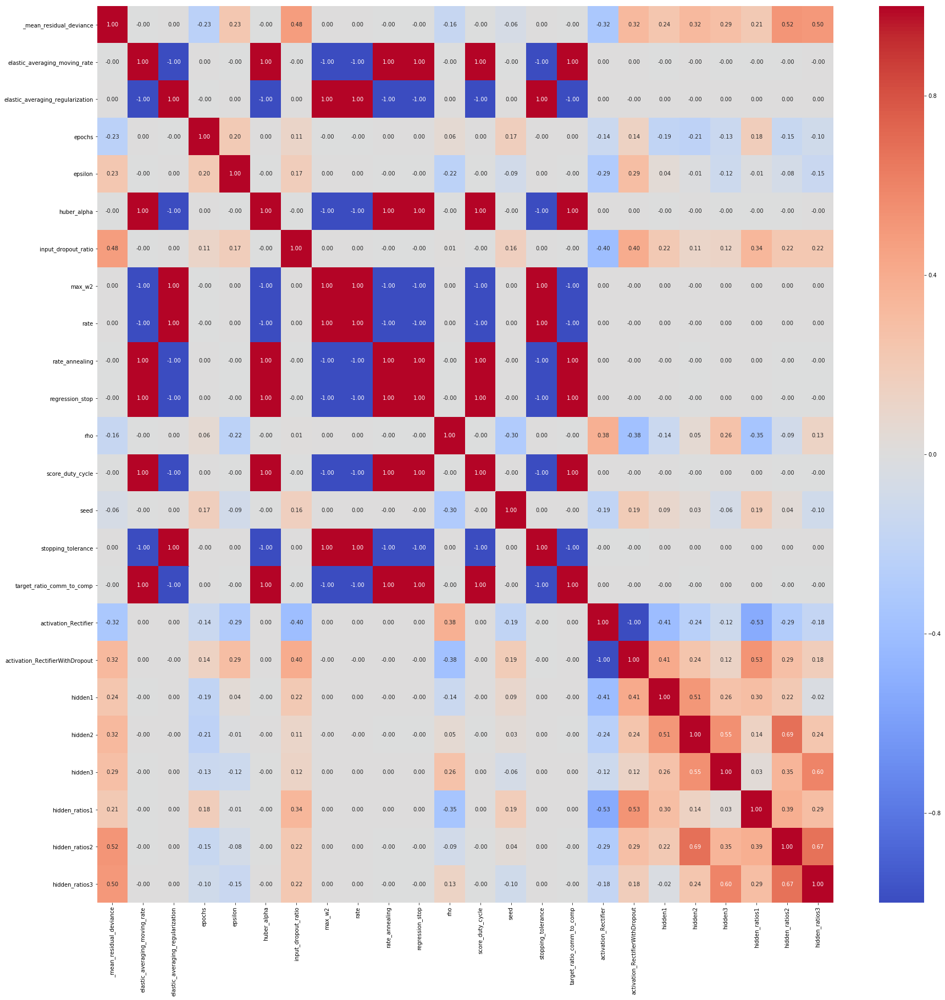

In [963]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'dl_hm.png'
plt.figure(figsize=(30,30))
dl_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

In [964]:
df.dtypes

_mean_residual_deviance             float64
_model_name                          object
activation                           object
categorical_encoding                 object
distribution                         object
elastic_averaging_moving_rate       float64
elastic_averaging_regularization    float64
epochs                              float64
epsilon                             float64
fold_assignment                      object
hidden                               object
hidden_dropout_ratios                object
huber_alpha                         float64
initial_weight_distribution          object
input_dropout_ratio                 float64
loss                                 object
max_w2                              float64
missing_values_handling              object
rate                                float64
rate_annealing                      float64
regression_stop                     float64
rho                                 float64
score_duty_cycle                

In [965]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop([
    '_model_name',
    'activation_Rectifier',
    'activation_RectifierWithDropout',
    'hidden_dropout_ratios',
    'hidden',
  
], axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

31


['_mean_residual_deviance',
 'activation',
 'categorical_encoding',
 'distribution',
 'elastic_averaging_moving_rate',
 'elastic_averaging_regularization',
 'epochs',
 'epsilon',
 'fold_assignment',
 'huber_alpha',
 'initial_weight_distribution',
 'input_dropout_ratio',
 'loss',
 'max_w2',
 'missing_values_handling',
 'rate',
 'rate_annealing',
 'regression_stop',
 'rho',
 'score_duty_cycle',
 'score_validation_sampling',
 'seed',
 'stopping_metric',
 'stopping_tolerance',
 'target_ratio_comm_to_comp',
 'hidden1',
 'hidden2',
 'hidden3',
 'hidden_ratios1',
 'hidden_ratios2',
 'hidden_ratios3']

In [966]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    print(i)
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

_mean_residual_deviance
5.6204217974007896e+16 3.016734757430786e+16
activation
RectifierWithDropout Rectifier
categorical_encoding
AUTO AUTO
distribution
AUTO AUTO
elastic_averaging_moving_rate
0.9 0.9
elastic_averaging_regularization
0.001 0.001
epochs
529.6 0.658490566037735
epsilon
1e-06 1e-09
fold_assignment
Modulo Modulo
huber_alpha
0.9 0.9
initial_weight_distribution
UniformAdaptive UniformAdaptive
input_dropout_ratio
0.2 0.0
loss
Automatic Automatic
max_w2
3.4028235000000003e+38 3.4028235000000003e+38
missing_values_handling
MeanImputation MeanImputation
rate
0.005 0.005
rate_annealing
1e-06 1e-06
regression_stop
1e-06 1e-06
rho
0.99 0.9
score_duty_cycle
0.1 0.1
score_validation_sampling
Uniform Uniform
seed
9094407270751128389 -9022752228871362374
stopping_metric
deviance deviance
stopping_tolerance
0.011609086505314 0.011609086505314
target_ratio_comm_to_comp
0.05 0.05
hidden1
500 10
hidden2
500 0
hidden3
500 0
hidden_ratios1
0.5 0.0
hidden_ratios2
0.5 0.0
hidden_ratios3
0.5 

In [967]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,hidden1,hidden2,hidden3,hidden_ratios1,hidden_ratios2,hidden_ratios3
max,56204217974007896.00000,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,529.60000,0.00000,Modulo,0.90000,UniformAdaptive,0.20000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,9094407270751128389,deviance,0.01161,0.05000,500,500,500,0.50000,0.50000,0.50000
min,30167347574307860.00000,Rectifier,AUTO,AUTO,0.90000,0.00100,0.65849,0.00000,Modulo,0.90000,UniformAdaptive,0.00000,Automatic,340282350000000029533720606738594398208.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-9022752228871362374,deviance,0.01161,0.05000,10,0,0,0.00000,0.00000,0.00000


In [968]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'dl_range.csv'
range_df.to_csv(range_path,sep=',')

### Get the hyperparameter of DRF MODEL

In [794]:
# get the model folder
drf_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/DRF'

In [795]:
# get all the model file in floder
drf_ms = os.listdir(drf_path)
print(drf_ms)
print ('length: ', len (drf_ms))

['param_CzanFF2000_DRF_1_AutoML_20190425_031629.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_040839.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_061247.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_054218.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_050348.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_034434.json', 'param_CzanFF2000_DRF_1_AutoML_20190425_044008.json']
length:  7


In [796]:
# dataframe of all the model parameters
df_all = json_to_df(drf_path, drf_ms)

DRF_1_AutoML_20190425_031629
DRF_1_AutoML_20190425_040839
DRF_1_AutoML_20190425_061247
DRF_1_AutoML_20190425_054218
DRF_1_AutoML_20190425_050348
DRF_1_AutoML_20190425_034434
DRF_1_AutoML_20190425_044008


In [797]:
df_all

,_mean_residual_deviance,_model_name,balance_classes,binomial_double_trees,build_tree_one_node,calibrate_model,calibration_frame,categorical_encoding,check_constant_response,checkpoint,class_sampling_factors,col_sample_rate_change_per_level,col_sample_rate_per_tree,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbinomial_double_trees,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmtries,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDvalidation_frame,model_IDweights_column,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,offset_column,r2_stopping,sample_rate,sample_rate_per_class,score_each_iteration,score_tree_interval,seed,stopping_metric,stopping_rounds,stopping_tolerance,weights_column
0,24969446332052852.00000,DRF_1_AutoML_20190425_031629,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,29,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,-109059479828034882,deviance,0,0.01161,None
1,24849988548945272.00000,DRF_1_AutoML_20190425_040839,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,18,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,3760058581049223230,deviance,0,0.01161,None
2,24952927150073368.00000,DRF_1_AutoML_20190425_061247,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,20,1024,1024,5,14,None,17976931348623151093931813769011000710688917642...,0.63200,None,False,0,-39027317935955149,deviance,0,0.01161,None
3,27701369652351192.00000,DRF_1_AutoML_20190425_054218,False,False,False,False,None,AUTO,True,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,True,False,False,True,5.00000,20,20,0,0.00000,1.00000,0.00001,NaN

In [798]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance
count,7.00000
mean,25770697766998084.00000
std,1084710344146690.25000
min,24849988548945272.00000
25%,24961186741063112.00000
50%,25225871239041112.00000
75%,26347640723261384.00000
max,27701369652351192.00000


### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [799]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

97


_mean_residual_deviance                          float64
_model_name                                       object
balance_classes                                     bool
binomial_double_trees                               bool
build_tree_one_node                                 bool
calibrate_model                                     bool
calibration_frame                                 object
categorical_encoding                              object
check_constant_response                             bool
checkpoint                                        object
class_sampling_factors                            object
col_sample_rate_change_per_level                 float64
col_sample_rate_per_tree                         float64
custom_metric_func                                object
distribution                                      object
export_checkpoints_dir                            object
fold_assignment                                   object
fold_column                    

In [800]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate_change_per_level,col_sample_rate_per_tree,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbinomial_double_trees,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmtries,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDvalidation_frame,model_IDweights_column,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,r2_stopping,sample_rate,score_tree_interval,seed,stopping_rounds,stopping_tolerance
count,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000
mean,25770697766998084.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,18.14286,inf,0.63200,0.00000,2074215488276085504.00000,0.00000,0.01161
std,1084710344146690.25000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,0.00000,0.00000,0.00000,0.00000,5.45981,inf,0.00000,0.00000,3987037411178936832.00000,0.00000,0.00000
min,24849988548945272.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,12.00000,17976931348623151093931813769011000710688917642...,0.63200,0.00000,-4477005182244811264.00000,0.00000,0.01161
25%,24961186741063112.00000,1.00000,1.00000,5.00000,20.00000,20.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-1.00000,20.00000,1024.00000,1024.00000,5.00000,15.00000,17976931348623151093931813769011000710688917642...,0.63200,0.00000,-74043398881995008.00000,0.00000,0.01161
50%,25225871239041112.00000,1.00000,1.0

In [801]:
# relevance 
dec = df.corr()
print(len(dec))
dec

82


,_mean_residual_deviance,balance_classes,binomial_double_trees,build_tree_one_node,calibrate_model,check_constant_response,col_sample_rate_change_per_level,col_sample_rate_per_tree,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbinomial_double_trees,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmtries,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDvalidation_frame,model_IDweights_column,mtries,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,r2_stopping,sample_rate,score_each_iteration,score_tree_interval,seed,stopping_rounds,stopping_tolerance
_mean_residual_deviance,1.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,-0.48613,nan,nan,nan,nan,0.26139,nan,0.00000
balance_classes,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
binomial_double_trees,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
build_tree_one_node,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
calibrate_model,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
check_constant_response,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
col_sample_rate_change_per_level,nan,nan,na

In [802]:
# get the msd's relevant column, because this is the target column
dec_msd = dec['_mean_residual_deviance']
print(len(dec_msd))
dec_msd


82


_mean_residual_deviance                          1.00000
balance_classes                                      nan
binomial_double_trees                                nan
build_tree_one_node                                  nan
calibrate_model                                      nan
check_constant_response                              nan
col_sample_rate_change_per_level                     nan
col_sample_rate_per_tree                             nan
ignore_const_cols                                    nan
keep_cross_validation_fold_assignment                nan
keep_cross_validation_models                         nan
keep_cross_validation_predictions                    nan
max_after_balance_size                               nan
max_confusion_matrix_size                            nan
max_depth                                            nan
max_hit_ratio_k                                      nan
max_runtime_secs                                     nan
min_rows                       

In [803]:
# get the null columns in msd's relevant column
dec_msd_nan = dec_msd.index[np.where(np.isnan(dec_msd))[0]]
print(len(dec_msd_nan))
dec_msd_nan

78


Index(['balance_classes', 'binomial_double_trees', 'build_tree_one_node',
       'calibrate_model', 'check_constant_response',
       'col_sample_rate_change_per_level', 'col_sample_rate_per_tree',
       'ignore_const_cols', 'keep_cross_validation_fold_assignment',
       'keep_cross_validation_models', 'keep_cross_validation_predictions',
       'max_after_balance_size', 'max_confusion_matrix_size', 'max_depth',
       'max_hit_ratio_k', 'max_runtime_secs', 'min_rows',
       'min_split_improvement', 'model_IDbalance_classes',
       'model_IDbinomial_double_trees', 'model_IDbuild_tree_one_node',
       'model_IDcalibrate_model', 'model_IDcalibration_frame',
       'model_IDcategorical_encoding', 'model_IDcheck_constant_response',
       'model_IDcheckpoint', 'model_IDclass_sampling_factors',
       'model_IDcol_sample_rate_change_per_level',
       'model_IDcol_sample_rate_per_tree', 'model_IDcustom_metric_func',
       'model_IDdistribution', 'model_IDexport_checkpoints_dir',
     

In [804]:
# make it as a list, so we can drop it
dec_msd_nan_list = dec_msd_nan.tolist()
dec_msd_nan_list

['balance_classes',
 'binomial_double_trees',
 'build_tree_one_node',
 'calibrate_model',
 'check_constant_response',
 'col_sample_rate_change_per_level',
 'col_sample_rate_per_tree',
 'ignore_const_cols',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'max_after_balance_size',
 'max_confusion_matrix_size',
 'max_depth',
 'max_hit_ratio_k',
 'max_runtime_secs',
 'min_rows',
 'min_split_improvement',
 'model_IDbalance_classes',
 'model_IDbinomial_double_trees',
 'model_IDbuild_tree_one_node',
 'model_IDcalibrate_model',
 'model_IDcalibration_frame',
 'model_IDcategorical_encoding',
 'model_IDcheck_constant_response',
 'model_IDcheckpoint',
 'model_IDclass_sampling_factors',
 'model_IDcol_sample_rate_change_per_level',
 'model_IDcol_sample_rate_per_tree',
 'model_IDcustom_metric_func',
 'model_IDdistribution',
 'model_IDexport_checkpoints_dir',
 'model_IDfold_assignment',
 'model_IDfold_column',
 'model_IDhistogram_type',

In [805]:
# drop the nan columns in parameter table
df = df.drop(dec_msd_nan_list, axis = 1)
df

,_mean_residual_deviance,_model_name,calibration_frame,categorical_encoding,checkpoint,class_sampling_factors,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,ntrees,offset_column,sample_rate_per_class,seed,stopping_metric,stopping_tolerance,weights_column
0,24969446332052852.00000,DRF_1_AutoML_20190425_031629,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,29,None,None,-109059479828034882,deviance,0.01161,None
1,24849988548945272.00000,DRF_1_AutoML_20190425_040839,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,18,None,None,3760058581049223230,deviance,0.01161,None
2,24952927150073368.00000,DRF_1_AutoML_20190425_061247,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,14,None,None,-39027317935955149,deviance,0.01161,None
3,27701369652351192.00000,DRF_1_AutoML_20190425_054218,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,12,None,None,7991581400575865866,deviance,0.01161,None
4,26022783175976344.00000,DRF_1_AutoML_20190425_050348,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,16,None,None,3465120126922232374,deviance,0.01161,None
5,25225871239041112.00000,DRF_1_AutoML_20190425_034434,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,19,None,None,3927840289394080204,deviance,0.01161,None
6,26672498270546420.00000,DRF_1_AutoML_20190425_044008,None,AUTO,None,None,None,gaussian,None,Modulo,None,AUTO,19,None,None,-4477005182244811168,deviance,0.01161,None


In [806]:
# drop the none columns in parameter table
df = df.drop(columns = [
    'calibration_frame',
    'checkpoint',
    'class_sampling_factors',
    'custom_metric_func',
    'export_checkpoints_dir',
    'fold_column',
    'sample_rate_per_class',
    'offset_column',
    'weights_column'  
    ],axis = 1)
df

,_mean_residual_deviance,_model_name,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
0,24969446332052852.00000,DRF_1_AutoML_20190425_031629,AUTO,gaussian,Modulo,AUTO,29,-109059479828034882,deviance,0.01161
1,24849988548945272.00000,DRF_1_AutoML_20190425_040839,AUTO,gaussian,Modulo,AUTO,18,3760058581049223230,deviance,0.01161
2,24952927150073368.00000,DRF_1_AutoML_20190425_061247,AUTO,gaussian,Modulo,AUTO,14,-39027317935955149,deviance,0.01161
3,27701369652351192.00000,DRF_1_AutoML_20190425_054218,AUTO,gaussian,Modulo,AUTO,12,7991581400575865866,deviance,0.01161
4,26022783175976344.00000,DRF_1_AutoML_20190425_050348,AUTO,gaussian,Modulo,AUTO,16,3465120126922232374,deviance,0.01161
5,25225871239041112.00000,DRF_1_AutoML_20190425_034434,AUTO,gaussian,Modulo,AUTO,19,3927840289394080204,deviance,0.01161
6,26672498270546420.00000,DRF_1_AutoML_20190425_044008,AUTO,gaussian,Modulo,AUTO,19,-4477005182244811168,deviance,0.01161


In [812]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,ntrees,seed,stopping_tolerance
count,7.00000,7.00000,7.00000,7.00000
mean,25770697766998084.00000,18.14286,2074215488276085504.00000,0.01161
std,1084710344146690.25000,5.45981,3987037411178936832.00000,0.00000
min,24849988548945272.00000,12.00000,-4477005182244811264.00000,0.01161
25%,24961186741063112.00000,15.00000,-74043398881995008.00000,0.01161
50%,25225871239041112.00000,18.00000,3465120126922232320.00000,0.01161
75%,26347640723261384.00000,19.00000,3843949435221651456.00000,0.01161
max,27701369652351192.00000,29.00000,7991581400575865856.00000,0.01161


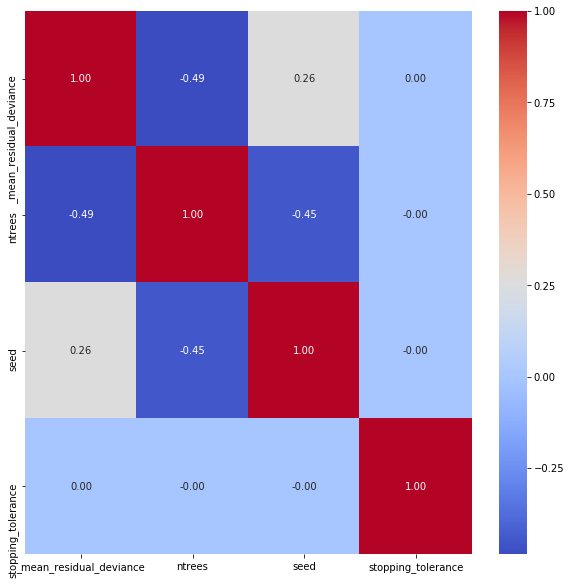

In [813]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'drf_hm.png'
plt.figure(figsize=(10,10))
drf_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

In [814]:
df.dtypes

_mean_residual_deviance    float64
_model_name                 object
categorical_encoding        object
distribution                object
fold_assignment             object
histogram_type              object
ntrees                       int64
seed                         int64
stopping_metric             object
stopping_tolerance         float64
dtype: object

In [815]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop([
    '_model_name',  
], axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

9


['_mean_residual_deviance',
 'categorical_encoding',
 'distribution',
 'fold_assignment',
 'histogram_type',
 'ntrees',
 'seed',
 'stopping_metric',
 'stopping_tolerance']

In [816]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    print(i)
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

_mean_residual_deviance
2.770136965235119e+16 2.484998854894527e+16
categorical_encoding
AUTO AUTO
distribution
gaussian gaussian
fold_assignment
Modulo Modulo
histogram_type
AUTO AUTO
ntrees
29 12
seed
7991581400575865866 -4477005182244811168
stopping_metric
deviance deviance
stopping_tolerance
0.011609086505314 0.011609086505314
9
[2.770136965235119e+16, 'AUTO', 'gaussian', 'Modulo', 'AUTO', 29, 7991581400575865866, 'deviance', 0.011609086505314]


In [817]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
max,27701369652351192.00000,AUTO,gaussian,Modulo,AUTO,29,7991581400575865866,deviance,0.01161
min,24849988548945272.00000,AUTO,gaussian,Modulo,AUTO,12,-4477005182244811168,deviance,0.01161


In [818]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'drf_range.csv'
range_df.to_csv(range_path,sep=',')

### Get the hyperparameter of GBM MODEL

In [819]:
# get the model folder
gbm_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/GBM'

In [822]:
# get all the model file in floder
gbm_ms = os.listdir(gbm_path)
print(gbm_ms)
print ('length: ', len (gbm_ms))

['param_CzanFF2000_GBM_grid_1_AutoML_20190425_040839_model_5.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_034434_model_3.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_054218_model_3.json', 'param_CzanFF2000_GBM_4_AutoML_20190425_050348.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_061247_model_15.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_050348_model_21.json', 'param_CzanFF2000_GBM_5_AutoML_20190425_044008.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_044008_model_14.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_040839_model_31.json', 'param_CzanFF2000_GBM_3_AutoML_20190425_031629.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_054218_model_20.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_040839_model_27.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_061247_model_5.json', 'param_CzanFF2000_GBM_4_AutoML_20190425_034434.json', 'param_CzanFF2000_GBM_grid_1_AutoML_20190425_050348_model_9.json', 'param_CzanFF2000_GBM_1_AutoML_20190425_

In [823]:
# dataframe of all the model parameters
df_all = json_to_df(gbm_path, gbm_ms)

GBM_grid_1_AutoML_20190425_040839_model_5
GBM_grid_1_AutoML_20190425_034434_model_3
GBM_grid_1_AutoML_20190425_054218_model_3
GBM_4_AutoML_20190425_050348
GBM_grid_1_AutoML_20190425_061247_model_15
GBM_grid_1_AutoML_20190425_050348_model_21
GBM_5_AutoML_20190425_044008
GBM_grid_1_AutoML_20190425_044008_model_14
GBM_grid_1_AutoML_20190425_040839_model_31
GBM_3_AutoML_20190425_031629
GBM_grid_1_AutoML_20190425_054218_model_20
GBM_grid_1_AutoML_20190425_040839_model_27
GBM_grid_1_AutoML_20190425_061247_model_5
GBM_4_AutoML_20190425_034434
GBM_grid_1_AutoML_20190425_050348_model_9
GBM_1_AutoML_20190425_050348
GBM_grid_1_AutoML_20190425_040839_model_9
GBM_grid_1_AutoML_20190425_044008_model_22
GBM_grid_1_AutoML_20190425_050348_model_17
GBM_grid_1_AutoML_20190425_061247_model_23
GBM_grid_1_AutoML_20190425_031629_model_3
GBM_grid_1_AutoML_20190425_061247_model_35
GBM_grid_1_AutoML_20190425_040839_model_11
GBM_grid_1_AutoML_20190425_054218_model_16
GBM_1_AutoML_20190425_034434
GBM_grid_1_AutoM

In [824]:
df_all

,_mean_residual_deviance,_model_name,balance_classes,build_tree_one_node,calibrate_model,calibration_frame,categorical_encoding,check_constant_response,checkpoint,class_sampling_factors,col_sample_rate,col_sample_rate_change_per_level,col_sample_rate_per_tree,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,huber_alpha,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,learn_rate,learn_rate_annealing,max_abs_leafnode_pred,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDlearn_rate_annealing,model_IDmax_abs_leafnode_pred,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmonotone_constraints,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDpred_noise_bandwidth,model_IDquantile_alpha,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,monotone_constraints,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,offset_column,pred_noise_bandwidth,quantile_alpha,r2_stopping,sample_rate,sample_rate_per_class,score_each_iteration,score_tree_interval,seed,stopping_metric,stopping_rounds,stopping_tolerance,tweedie_power,weights_column
0,38105678026797064.00000,GBM_grid_1_AutoML_20190425_040839_model_5,False,False,False,None,AUTO,True,None,None,0.70000,1.00000,0.40000,None,gaussian,None,Modulo,None,AUTO,0.90000,True,False,False,True,0.80000,1.00000,17976931348623151093931813769011000710688917642...,5.00000,20,17,0,0.00000,15.00000,0.00010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,20,1024,1024,5,37,None,0.00000,0.50000,17976931348623151093931813769011000710688917642...,0.90000,None,False,5,3846649455465332253,deviance,0,0.01161,1.50000,None
1,58598724802885144.00000,GBM_grid_1_AutoML_20190425_034434_model_3,False,False,False,None,AUTO,True,None,None,0.70000,1.00000,0.70000,None,gaussian,None,Modulo,None,AUTO,0.90000,True,False,False,True,0.00100,1.00000,17976931348623151093931813769011000710688917642...,5.00000,20,17,0,0.00000,10.00000,0.00010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,20,1024,1024,5,487,None,0.00000,0.50000,17976931348623151093931813769011000710688917642...,0.70000,None,False,5,-3917196823294341591,deviance,0,0.01161,1.50000,None
2,25015435267992884.00000,GBM_grid_1_AutoML_20190425_054218_model_3,False,False,False,None,AUTO,True,None,None,0.40000,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,0.90000,True,

In [825]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance
count,210.00000
mean,36275619685406992.00000
std,17350147220310644.00000
min,23462039486604652.00000
25%,25667638243275180.00000
50%,30304531719384848.00000
75%,35856485752977096.00000
max,98531673008743552.00000


### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [826]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

111


_mean_residual_deviance                          float64
_model_name                                       object
balance_classes                                     bool
build_tree_one_node                                 bool
calibrate_model                                     bool
calibration_frame                                 object
categorical_encoding                              object
check_constant_response                             bool
checkpoint                                        object
class_sampling_factors                            object
col_sample_rate                                  float64
col_sample_rate_change_per_level                 float64
col_sample_rate_per_tree                         float64
custom_metric_func                                object
distribution                                      object
export_checkpoints_dir                            object
fold_assignment                                   object
fold_column                    

In [827]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate,col_sample_rate_change_per_level,col_sample_rate_per_tree,huber_alpha,learn_rate,learn_rate_annealing,max_abs_leafnode_pred,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDlearn_rate_annealing,model_IDmax_abs_leafnode_pred,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmonotone_constraints,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDpred_noise_bandwidth,model_IDquantile_alpha,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,pred_noise_bandwidth,quantile_alpha,r2_stopping,sample_rate,score_tree_interval,seed,stopping_rounds,stopping_tolerance,tweedie_power
count,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000
mean,36275619685406992.00000,0.70667,1.00000,0.72381,0.90000,0.16369,1.00000,inf,5.00000,20.00000,10.91429,0.00000,0.00000,38.81429,0.00005,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,20.00000,1024.00000,1024.00000,5.00000,169.66190,0.00000,0.50000,inf,0.78524,5.00000,573642929782864576.00000,0.00000,0.01161,1.50000
std,17350147220310644.00000,0.22994,0.00000,0.21721,0.00000,0.24031,0.00000,inf,0.00000,0.00000,4.43586,0.00000,0.00000,41.87620,0.00004,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,0.00000,0.00000,0.00000,164.26290,0.00000,0.00000,inf,0.15035,0.00000,4913956648118019072.00000,0.00000,0.00000,0.00000
min,23462039486604652.00000,0.40000,1.00000,0.40000,0.90000,0.00100,1.00000,17976931348623151093931813769011000710688917642...,5.00000,20.00000,3.00000,0.00000,0.00000,1.00000,0.00001,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,

In [828]:
# relevance 
dec = df.corr()
print(len(dec))
dec

95


,_mean_residual_deviance,balance_classes,build_tree_one_node,calibrate_model,check_constant_response,col_sample_rate,col_sample_rate_change_per_level,col_sample_rate_per_tree,huber_alpha,ignore_const_cols,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,learn_rate,learn_rate_annealing,max_abs_leafnode_pred,max_after_balance_size,max_confusion_matrix_size,max_depth,max_hit_ratio_k,max_runtime_secs,min_rows,min_split_improvement,model_IDbalance_classes,model_IDbuild_tree_one_node,model_IDcalibrate_model,model_IDcalibration_frame,model_IDcategorical_encoding,model_IDcheck_constant_response,model_IDcheckpoint,model_IDclass_sampling_factors,model_IDcol_sample_rate,model_IDcol_sample_rate_change_per_level,model_IDcol_sample_rate_per_tree,model_IDcustom_metric_func,model_IDdistribution,model_IDexport_checkpoints_dir,model_IDfold_assignment,model_IDfold_column,model_IDhistogram_type,model_IDhuber_alpha,model_IDignore_const_cols,model_IDignored_columns,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlearn_rate,model_IDlearn_rate_annealing,model_IDmax_abs_leafnode_pred,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_depth,model_IDmax_hit_ratio_k,model_IDmax_runtime_secs,model_IDmin_rows,model_IDmin_split_improvement,model_IDmodel_id,model_IDmonotone_constraints,model_IDnbins,model_IDnbins_cats,model_IDnbins_top_level,model_IDnfolds,model_IDntrees,model_IDoffset_column,model_IDpred_noise_bandwidth,model_IDquantile_alpha,model_IDr2_stopping,model_IDresponse_column,model_IDsample_rate,model_IDsample_rate_per_class,model_IDscore_each_iteration,model_IDscore_tree_interval,model_IDseed,model_IDstopping_metric,model_IDstopping_rounds,model_IDstopping_tolerance,model_IDtraining_frame,model_IDtweedie_power,model_IDvalidation_frame,model_IDweights_column,nbins,nbins_cats,nbins_top_level,nfolds,ntrees,pred_noise_bandwidth,quantile_alpha,r2_stopping,sample_rate,score_each_iteration,score_tree_interval,seed,stopping_rounds,stopping_tolerance,tweedie_power
_mean_residual_deviance,1.00000,nan,nan,nan,nan,0.09536,nan,-0.00469,0.00000,nan,nan,nan,nan,-0.13509,nan,nan,nan,nan,-0.19353,nan,nan,-0.11772,0.07109,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.11977,nan,nan,nan,-0.14194,nan,nan,-0.11342,nan,0.00000,nan
balance_classes,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
build_tree_one_node,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
calibrate_model,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
check_constant_response,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,n

In [829]:
# get the msd's relevant column, because this is the target column
dec_msd = dec['_mean_residual_deviance']
print(len(dec_msd))
dec_msd


95


_mean_residual_deviance                          1.00000
balance_classes                                      nan
build_tree_one_node                                  nan
calibrate_model                                      nan
check_constant_response                              nan
col_sample_rate                                  0.09536
col_sample_rate_change_per_level                     nan
col_sample_rate_per_tree                        -0.00469
huber_alpha                                      0.00000
ignore_const_cols                                    nan
keep_cross_validation_fold_assignment                nan
keep_cross_validation_models                         nan
keep_cross_validation_predictions                    nan
learn_rate                                      -0.13509
learn_rate_annealing                                 nan
max_abs_leafnode_pred                                nan
max_after_balance_size                               nan
max_confusion_matrix_size      

In [830]:
# get the null columns in msd's relevant column
dec_msd_nan = dec_msd.index[np.where(np.isnan(dec_msd))[0]]
print(len(dec_msd_nan))
dec_msd_nan

83


Index(['balance_classes', 'build_tree_one_node', 'calibrate_model',
       'check_constant_response', 'col_sample_rate_change_per_level',
       'ignore_const_cols', 'keep_cross_validation_fold_assignment',
       'keep_cross_validation_models', 'keep_cross_validation_predictions',
       'learn_rate_annealing', 'max_abs_leafnode_pred',
       'max_after_balance_size', 'max_confusion_matrix_size',
       'max_hit_ratio_k', 'max_runtime_secs', 'model_IDbalance_classes',
       'model_IDbuild_tree_one_node', 'model_IDcalibrate_model',
       'model_IDcalibration_frame', 'model_IDcategorical_encoding',
       'model_IDcheck_constant_response', 'model_IDcheckpoint',
       'model_IDclass_sampling_factors', 'model_IDcol_sample_rate',
       'model_IDcol_sample_rate_change_per_level',
       'model_IDcol_sample_rate_per_tree', 'model_IDcustom_metric_func',
       'model_IDdistribution', 'model_IDexport_checkpoints_dir',
       'model_IDfold_assignment', 'model_IDfold_column',
       'model_I

In [831]:
# make it as a list, so we can drop it
dec_msd_nan_list = dec_msd_nan.tolist()
dec_msd_nan_list

['balance_classes',
 'build_tree_one_node',
 'calibrate_model',
 'check_constant_response',
 'col_sample_rate_change_per_level',
 'ignore_const_cols',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'learn_rate_annealing',
 'max_abs_leafnode_pred',
 'max_after_balance_size',
 'max_confusion_matrix_size',
 'max_hit_ratio_k',
 'max_runtime_secs',
 'model_IDbalance_classes',
 'model_IDbuild_tree_one_node',
 'model_IDcalibrate_model',
 'model_IDcalibration_frame',
 'model_IDcategorical_encoding',
 'model_IDcheck_constant_response',
 'model_IDcheckpoint',
 'model_IDclass_sampling_factors',
 'model_IDcol_sample_rate',
 'model_IDcol_sample_rate_change_per_level',
 'model_IDcol_sample_rate_per_tree',
 'model_IDcustom_metric_func',
 'model_IDdistribution',
 'model_IDexport_checkpoints_dir',
 'model_IDfold_assignment',
 'model_IDfold_column',
 'model_IDhistogram_type',
 'model_IDhuber_alpha',
 'model_IDignore_const_cols',
 'model_

In [832]:
# drop the nan columns in parameter table
df = df.drop(dec_msd_nan_list, axis = 1)
df

,_mean_residual_deviance,_model_name,calibration_frame,categorical_encoding,checkpoint,class_sampling_factors,col_sample_rate,col_sample_rate_per_tree,custom_metric_func,distribution,export_checkpoints_dir,fold_assignment,fold_column,histogram_type,huber_alpha,learn_rate,max_depth,min_rows,min_split_improvement,monotone_constraints,ntrees,offset_column,sample_rate,sample_rate_per_class,seed,stopping_metric,stopping_tolerance,weights_column
0,38105678026797064.00000,GBM_grid_1_AutoML_20190425_040839_model_5,None,AUTO,None,None,0.70000,0.40000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.80000,17,15.00000,0.00010,None,37,None,0.90000,None,3846649455465332253,deviance,0.01161,None
1,58598724802885144.00000,GBM_grid_1_AutoML_20190425_034434_model_3,None,AUTO,None,None,0.70000,0.70000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.00100,17,10.00000,0.00010,None,487,None,0.70000,None,-3917196823294341591,deviance,0.01161,None
2,25015435267992884.00000,GBM_grid_1_AutoML_20190425_054218_model_3,None,AUTO,None,None,0.40000,1.00000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.08000,15,1.00000,0.00001,None,54,None,0.80000,None,8054614333856496531,deviance,0.01161,None
3,24771929265689876.00000,GBM_4_AutoML_20190425_050348,None,AUTO,None,None,0.80000,0.80000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.10000,15,100.00000,0.00001,None,64,None,0.80000,None,8572296394851566548,deviance,0.01161,None
4,40009087455736736.00000,GBM_grid_1_AutoML_20190425_061247_model_15,None,AUTO,None,None,0.40000,0.40000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.01000,3,5.00000,0.00001,None,383,None,0.90000,None,9209026673105970395,deviance,0.01161,None
5,65621748528120832.00000,GBM_grid_1_AutoML_20190425_050348_model_21,None,AUTO,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.00100,7,100.00000,0.00010,None,454,None,1.00000,None,4010221049332325167,deviance,0.01161,None
6,32323971173835444.00000,GBM_5_AutoML_20190425_044008,None,AUTO,None,None,0.80000,0.80000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.10000,15,100.00000,0.00001,None,65,None,0.80000,None,-441285879644080979,deviance,0.01161,None
7,31916112476256352.00000,GBM_grid_1_AutoML_20190425_044008_model_14,None,AUTO,None,None,1.00000,1.00000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.08000,9,100.00000,0.00001,None,110,None,0.80000,None,5532608390363354808,deviance,0.01161,None
8,27090906021665576.00000,GBM_grid_1_AutoML_20190425_040839_model_31,None,AUTO,None,None,0.40000,0.70000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.05000,7,1.00000,0.00001,None,88,None,0.50000,None,1781734522232379578,deviance,0.01161,None
9,25526087376836304.00000,GBM_3_AutoML_20190425_031629,None,AUTO,None,None,0.80000,0.80000,None,gaussian,None,Modulo,None,AUTO,0.90000,0.10000,15,100.00000,0.00001,None,62,None,0.80000,None,7224883551881429633,deviance,0.01161,None


In [833]:
# drop the none columns in parameter table
df = df.drop(columns = [
    'calibration_frame',
    'checkpoint',
    'class_sampling_factors',
    'custom_metric_func',
    'export_checkpoints_dir',
    'fold_column',
    'sample_rate_per_class',
    'monotone_constraints',
    'offset_column',
    'weights_column'  
    ],axis = 1)
df

,_mean_residual_deviance,_model_name,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,fold_assignment,histogram_type,huber_alpha,learn_rate,max_depth,min_rows,min_split_improvement,ntrees,sample_rate,seed,stopping_metric,stopping_tolerance
0,38105678026797064.00000,GBM_grid_1_AutoML_20190425_040839_model_5,AUTO,0.70000,0.40000,gaussian,Modulo,AUTO,0.90000,0.80000,17,15.00000,0.00010,37,0.90000,3846649455465332253,deviance,0.01161
1,58598724802885144.00000,GBM_grid_1_AutoML_20190425_034434_model_3,AUTO,0.70000,0.70000,gaussian,Modulo,AUTO,0.90000,0.00100,17,10.00000,0.00010,487,0.70000,-3917196823294341591,deviance,0.01161
2,25015435267992884.00000,GBM_grid_1_AutoML_20190425_054218_model_3,AUTO,0.40000,1.00000,gaussian,Modulo,AUTO,0.90000,0.08000,15,1.00000,0.00001,54,0.80000,8054614333856496531,deviance,0.01161
3,24771929265689876.00000,GBM_4_AutoML_20190425_050348,AUTO,0.80000,0.80000,gaussian,Modulo,AUTO,0.90000,0.10000,15,100.00000,0.00001,64,0.80000,8572296394851566548,deviance,0.01161
4,40009087455736736.00000,GBM_grid_1_AutoML_20190425_061247_model_15,AUTO,0.40000,0.40000,gaussian,Modulo,AUTO,0.90000,0.01000,3,5.00000,0.00001,383,0.90000,9209026673105970395,deviance,0.01161
5,65621748528120832.00000,GBM_grid_1_AutoML_20190425_050348_model_21,AUTO,1.00000,1.00000,gaussian,Modulo,AUTO,0.90000,0.00100,7,100.00000,0.00010,454,1.00000,4010221049332325167,deviance,0.01161
6,32323971173835444.00000,GBM_5_AutoML_20190425_044008,AUTO,0.80000,0.80000,gaussian,Modulo,AUTO,0.90000,0.10000,15,100.00000,0.00001,65,0.80000,-441285879644080979,deviance,0.01161
7,31916112476256352.00000,GBM_grid_1_AutoML_20190425_044008_model_14,AUTO,1.00000,1.00000,gaussian,Modulo,AUTO,0.90000,0.08000,9,100.00000,0.00001,110,0.80000,5532608390363354808,deviance,0.01161
8,27090906021665576.00000,GBM_grid_1_AutoML_20190425_040839_model_31,AUTO,0.40000,0.70000,gaussian,Modulo,AUTO,0.90000,0.05000,7,1.00000,0.00001,88,0.50000,1781734522232379578,deviance,0.01161
9,25526087376836304.00000,GBM_3_AutoML_20190425_031629,AUTO,0.80000,0.80000,gaussian,Modulo,AUTO,0.90000,0.10000,15,100.00000,0.00001,62,0.80000,7224883551881429633,deviance,0.01161


In [834]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,col_sample_rate,col_sample_rate_per_tree,huber_alpha,learn_rate,max_depth,min_rows,min_split_improvement,ntrees,sample_rate,seed,stopping_tolerance
count,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000,210.00000
mean,36275619685406992.00000,0.70667,0.72381,0.90000,0.16369,10.91429,38.81429,0.00005,169.66190,0.78524,573642929782864576.00000,0.01161
std,17350147220310644.00000,0.22994,0.21721,0.00000,0.24031,4.43586,41.87620,0.00004,164.26290,0.15035,4913956648118019072.00000,0.00000
min,23462039486604652.00000,0.40000,0.40000,0.90000,0.00100,3.00000,1.00000,0.00001,1.00000,0.50000,-9111061617578221568.00000,0.01161
25%,25667638243275180.00000,0.40000,0.70000,0.90000,0.00800,7.00000,5.00000,0.00001,60.00000,0.70000,-3530857295128903168.00000,0.01161
50%,30304531719384848.00000,0.70000,0.70000,0.90000,0.08000,12.00000,15.00000,0.00001,83.00000,0.80000,81055194229897376.00000,0.01161
75%,35856485752977096.00000,1.00000,1.00000,0.90000,0.10000,15.00000,100.00000,0.00010,297.50000,0.90000,4679187977448361984.00000,0.01161
max,98531673008743552.00000,1.00000,1.00000,0.90000,0.80000,17.00000,100.00000,0.00010,739.00000,1.00000,9209026673105970176.00000,0.01161


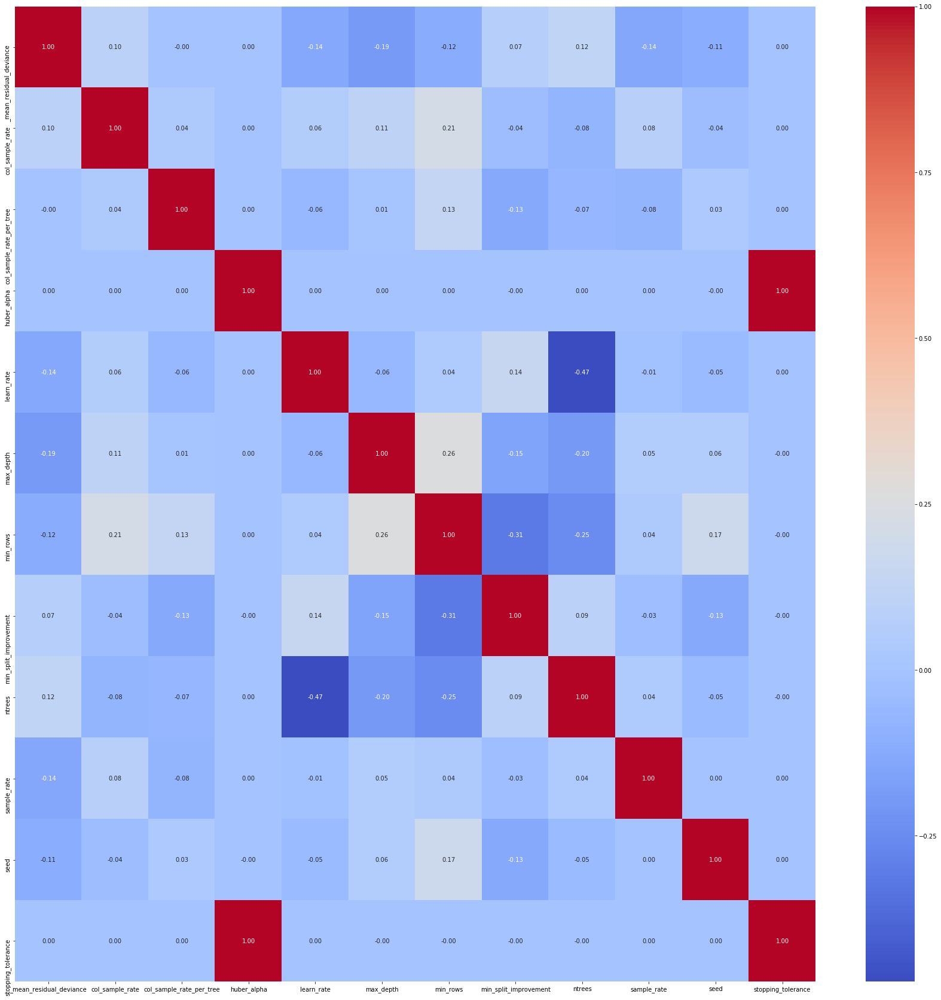

In [835]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'gbm_hm.png'
plt.figure(figsize=(30,30))
gbm_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

In [836]:
df.dtypes

_mean_residual_deviance     float64
_model_name                  object
categorical_encoding         object
col_sample_rate             float64
col_sample_rate_per_tree    float64
distribution                 object
fold_assignment              object
histogram_type               object
huber_alpha                 float64
learn_rate                  float64
max_depth                     int64
min_rows                    float64
min_split_improvement       float64
ntrees                        int64
sample_rate                 float64
seed                          int64
stopping_metric              object
stopping_tolerance          float64
dtype: object

In [837]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop([
    '_model_name',  
], axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

17


['_mean_residual_deviance',
 'categorical_encoding',
 'col_sample_rate',
 'col_sample_rate_per_tree',
 'distribution',
 'fold_assignment',
 'histogram_type',
 'huber_alpha',
 'learn_rate',
 'max_depth',
 'min_rows',
 'min_split_improvement',
 'ntrees',
 'sample_rate',
 'seed',
 'stopping_metric',
 'stopping_tolerance']

In [838]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    print(i)
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

_mean_residual_deviance
9.853167300874355e+16 2.3462039486604652e+16
categorical_encoding
AUTO AUTO
col_sample_rate
1.0 0.4
col_sample_rate_per_tree
1.0 0.4
distribution
gaussian gaussian
fold_assignment
Modulo Modulo
histogram_type
AUTO AUTO
huber_alpha
0.9 0.9
learn_rate
0.8 0.001
max_depth
17 3
min_rows
100.0 1.0
min_split_improvement
0.0001 1e-05
ntrees
739 1
sample_rate
1.0 0.5
seed
9209026673105970395 -9111061617578221222
stopping_metric
deviance deviance
stopping_tolerance
0.011609086505314 0.011609086505314
17
[9.853167300874355e+16, 'AUTO', 1.0, 1.0, 'gaussian', 'Modulo', 'AUTO', 0.9, 0.8, 17, 100.0, 0.0001, 739, 1.0, 9209026673105970395, 'deviance', 0.011609086505314]


In [839]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,fold_assignment,histogram_type,huber_alpha,learn_rate,max_depth,min_rows,min_split_improvement,ntrees,sample_rate,seed,stopping_metric,stopping_tolerance
max,98531673008743552.00000,AUTO,1.00000,1.00000,gaussian,Modulo,AUTO,0.90000,0.80000,17,100.00000,0.00010,739,1.00000,9209026673105970395,deviance,0.01161
min,23462039486604652.00000,AUTO,0.40000,0.40000,gaussian,Modulo,AUTO,0.90000,0.00100,3,1.00000,0.00001,1,0.50000,-9111061617578221222,deviance,0.01161


In [840]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'gbm_range.csv'
range_df.to_csv(range_path,sep=',')

### Get the hyperparameter of GLM MODEL

In [975]:
# get the model folder
glm_path

'/Users/bonnie/6105/project/DS/project/results/2000_test/GLM'

In [976]:
# get all the model file in floder
glm_ms = os.listdir(glm_path)
print(glm_ms)
print ('length: ', len (glm_ms))

['param_CzanFF2000_GLM_grid_1_AutoML_20190425_061247_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_040839_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_050348_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_031629_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_034434_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_054218_model_1.json', 'param_CzanFF2000_GLM_grid_1_AutoML_20190425_044008_model_1.json']
length:  7


In [977]:
# dataframe of all the model parameters
df_all = json_to_df(glm_path, glm_ms)

GLM_grid_1_AutoML_20190425_061247_model_1
GLM_grid_1_AutoML_20190425_040839_model_1
GLM_grid_1_AutoML_20190425_050348_model_1
GLM_grid_1_AutoML_20190425_031629_model_1
GLM_grid_1_AutoML_20190425_034434_model_1
GLM_grid_1_AutoML_20190425_054218_model_1
GLM_grid_1_AutoML_20190425_044008_model_1


In [978]:
df_all

,_mean_residual_deviance,_model_name,alpha,balance_classes,beta_constraints,beta_epsilon,class_sampling_factors,compute_p_values,custom_metric_func,early_stopping,export_checkpoints_dir,family,fold_assignment,fold_column,gradient_epsilon,ignore_const_cols,interaction_pairs,interactions,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,model_IDalpha,model_IDbalance_classes,model_IDbeta_constraints,model_IDbeta_epsilon,model_IDclass_sampling_factors,model_IDcompute_p_values,model_IDcustom_metric_func,model_IDearly_stopping,model_IDexport_checkpoints_dir,model_IDfamily,model_IDfold_assignment,model_IDfold_column,model_IDgradient_epsilon,model_IDignore_const_cols,model_IDignored_columns,model_IDinteraction_pairs,model_IDinteractions,model_IDintercept,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlambda,model_IDlambda_min_ratio,model_IDlambda_search,model_IDlink,model_IDmax_active_predictors,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_iterations,model_IDmax_runtime_secs,model_IDmissing_values_handling,model_IDmodel_id,model_IDnfolds,model_IDnlambdas,model_IDnon_negative,model_IDobj_reg,model_IDobjective_epsilon,model_IDoffset_column,model_IDprior,model_IDremove_collinear_columns,model_IDresponse_column,model_IDscore_each_iteration,model_IDseed,model_IDsolver,model_IDstandardize,model_IDtheta,model_IDtraining_frame,model_IDtweedie_link_power,model_IDtweedie_variance_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,offset_column,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,weights_column
0,98665337105472112.00000,GLM_grid_1_AutoML_20190425_061247_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None
1,98665337105472112.00000,GLM_grid_1_AutoML_20190425_040839_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-4844715198400296124,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None
2,98665337105472112.00000,GLM_grid_1_AutoML_20190425_050348_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,F

In [979]:
alpha_list= df_all['alpha']
alpha_item = []
for i in alpha_list:
    print (i)
    ded = []
    for tt in i :      
        ded.append(tt)
    print (ded)
    alpha_item.append(ded)   
      
print('list_length: ',len(alpha_list))
print('item_length: ',len(alpha_item))

[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
list_length:  7
item_length:  7


In [980]:
alpha_item_table = pd.DataFrame(alpha_item, columns =['alpha1',
                                                      'alpha2',
                                                      'alpha3',
                                                      'alpha4',
                                                      'alpha5',
                                                      'alpha6'
                                                     ])
df_all = pd.concat([df_all, alpha_item_table], axis=1)
df_all

,_mean_residual_deviance,_model_name,alpha,balance_classes,beta_constraints,beta_epsilon,class_sampling_factors,compute_p_values,custom_metric_func,early_stopping,export_checkpoints_dir,family,fold_assignment,fold_column,gradient_epsilon,ignore_const_cols,interaction_pairs,interactions,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,model_IDalpha,model_IDbalance_classes,model_IDbeta_constraints,model_IDbeta_epsilon,model_IDclass_sampling_factors,model_IDcompute_p_values,model_IDcustom_metric_func,model_IDearly_stopping,model_IDexport_checkpoints_dir,model_IDfamily,model_IDfold_assignment,model_IDfold_column,model_IDgradient_epsilon,model_IDignore_const_cols,model_IDignored_columns,model_IDinteraction_pairs,model_IDinteractions,model_IDintercept,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlambda,model_IDlambda_min_ratio,model_IDlambda_search,model_IDlink,model_IDmax_active_predictors,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_iterations,model_IDmax_runtime_secs,model_IDmissing_values_handling,model_IDmodel_id,model_IDnfolds,model_IDnlambdas,model_IDnon_negative,model_IDobj_reg,model_IDobjective_epsilon,model_IDoffset_column,model_IDprior,model_IDremove_collinear_columns,model_IDresponse_column,model_IDscore_each_iteration,model_IDseed,model_IDsolver,model_IDstandardize,model_IDtheta,model_IDtraining_frame,model_IDtweedie_link_power,model_IDtweedie_variance_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,offset_column,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,weights_column,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6
0,98665337105472112.00000,GLM_grid_1_AutoML_20190425_061247_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000
1,98665337105472112.00000,GLM_grid_1_AutoML_20190425_040839_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-4844715198400296124,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000
2,98665337105472112.00000,GLM_grid_1_AutoML_20190425_050348_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [981]:
lambda_list= df_all['lambda']
lambda_item = []
for i in lambda_list:
    print (i)
    ded = []
    for tt in i :      
        ded.append(tt)
    print (ded)
    lambda_item.append(ded)   
      
print('list_length: ',len(lambda_list))
print('item_length: ',len(lambda_item))

[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
[15960969243.255198, 9912032309.071613, 6155539992.51000

In [982]:
lambda_item_table = pd.DataFrame(lambda_item, columns =['lambda1',
                                                      'lambda2',
                                                      'lambda3',
                                                      'lambda4',
                                                      'lambda5',
                                                      'lambda6'
                                                     ])
df_all = pd.concat([df_all, lambda_item_table], axis=1)
df_all

,_mean_residual_deviance,_model_name,alpha,balance_classes,beta_constraints,beta_epsilon,class_sampling_factors,compute_p_values,custom_metric_func,early_stopping,export_checkpoints_dir,family,fold_assignment,fold_column,gradient_epsilon,ignore_const_cols,interaction_pairs,interactions,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,model_IDalpha,model_IDbalance_classes,model_IDbeta_constraints,model_IDbeta_epsilon,model_IDclass_sampling_factors,model_IDcompute_p_values,model_IDcustom_metric_func,model_IDearly_stopping,model_IDexport_checkpoints_dir,model_IDfamily,model_IDfold_assignment,model_IDfold_column,model_IDgradient_epsilon,model_IDignore_const_cols,model_IDignored_columns,model_IDinteraction_pairs,model_IDinteractions,model_IDintercept,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlambda,model_IDlambda_min_ratio,model_IDlambda_search,model_IDlink,model_IDmax_active_predictors,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_iterations,model_IDmax_runtime_secs,model_IDmissing_values_handling,model_IDmodel_id,model_IDnfolds,model_IDnlambdas,model_IDnon_negative,model_IDobj_reg,model_IDobjective_epsilon,model_IDoffset_column,model_IDprior,model_IDremove_collinear_columns,model_IDresponse_column,model_IDscore_each_iteration,model_IDseed,model_IDsolver,model_IDstandardize,model_IDtheta,model_IDtraining_frame,model_IDtweedie_link_power,model_IDtweedie_variance_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,offset_column,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,weights_column,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
0,98665337105472112.00000,GLM_grid_1_AutoML_20190425_061247_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
1,98665337105472112.00000,GLM_grid_1_AutoML_20190425_040839_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-4844715198400296124,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
2,98665337105472112.00000,GLM_grid_1_AutoML_20190425_050348_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,

In [983]:
# statistical data of the model parameters table
df_all.describe()

,_mean_residual_deviance,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
count,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000
mean,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
std,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
min,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
25%,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
50%,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
75%,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
max,98665337105472112.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590


### Change the type of data, since only _mean_residual_deviance can be analyzed 

In [984]:
# change the type of data in table
df = df_all.infer_objects()
print(len(df.dtypes))
df.dtypes

113


_mean_residual_deviance                          float64
_model_name                                       object
alpha                                             object
balance_classes                                     bool
beta_constraints                                  object
beta_epsilon                                     float64
class_sampling_factors                            object
compute_p_values                                    bool
custom_metric_func                                object
early_stopping                                      bool
export_checkpoints_dir                            object
family                                            object
fold_assignment                                   object
fold_column                                       object
gradient_epsilon                                 float64
ignore_const_cols                                   bool
interaction_pairs                                 object
interactions                   

In [985]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,beta_epsilon,gradient_epsilon,lambda_min_ratio,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,model_IDalpha,model_IDbalance_classes,model_IDbeta_constraints,model_IDbeta_epsilon,model_IDclass_sampling_factors,model_IDcompute_p_values,model_IDcustom_metric_func,model_IDearly_stopping,model_IDexport_checkpoints_dir,model_IDfamily,model_IDfold_assignment,model_IDfold_column,model_IDgradient_epsilon,model_IDignore_const_cols,model_IDignored_columns,model_IDinteraction_pairs,model_IDinteractions,model_IDintercept,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlambda,model_IDlambda_min_ratio,model_IDlambda_search,model_IDlink,model_IDmax_active_predictors,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_iterations,model_IDmax_runtime_secs,model_IDmissing_values_handling,model_IDmodel_id,model_IDnfolds,model_IDnlambdas,model_IDnon_negative,model_IDobj_reg,model_IDobjective_epsilon,model_IDoffset_column,model_IDprior,model_IDremove_collinear_columns,model_IDresponse_column,model_IDscore_each_iteration,model_IDseed,model_IDsolver,model_IDstandardize,model_IDtheta,model_IDtraining_frame,model_IDtweedie_link_power,model_IDtweedie_variance_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nlambdas,obj_reg,objective_epsilon,prior,seed,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
count,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000
mean,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5.00000,30.00000,0.00013,0.00010,-1.00000,740116388462450944.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
std,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.00000,0.00000,0.00000,0.00000,0.00000,5855124992070737920.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
min,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,5.00000,30.00000,0.00013,0.00010,-1.00000,-4880951606538223616.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
25%,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,nan,n

In [986]:
df = df.dropna(axis=0, how='all')
df = df.dropna(axis=1, how='all')

In [987]:
# statistical data of the model parameters table
df.describe()

,_mean_residual_deviance,beta_epsilon,gradient_epsilon,lambda_min_ratio,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,nfolds,nlambdas,obj_reg,objective_epsilon,prior,seed,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
count,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000,7.00000
mean,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,740116388462450944.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
std,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,5855124992070737920.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
min,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,-4880951606538223616.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
25%,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,-3943454682888300544.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
50%,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,-2252716009947965440.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
75%,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,5645534493727211520.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
max,98665337105472112.00000,0.00010,0.00000,0.00000,5000.00000,5.00000,20.00000,0.00000,300.00000,0.00000,5.00000,30.00000,0.00013,0.00010,-1.00000,8910322714045524992.00000,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590


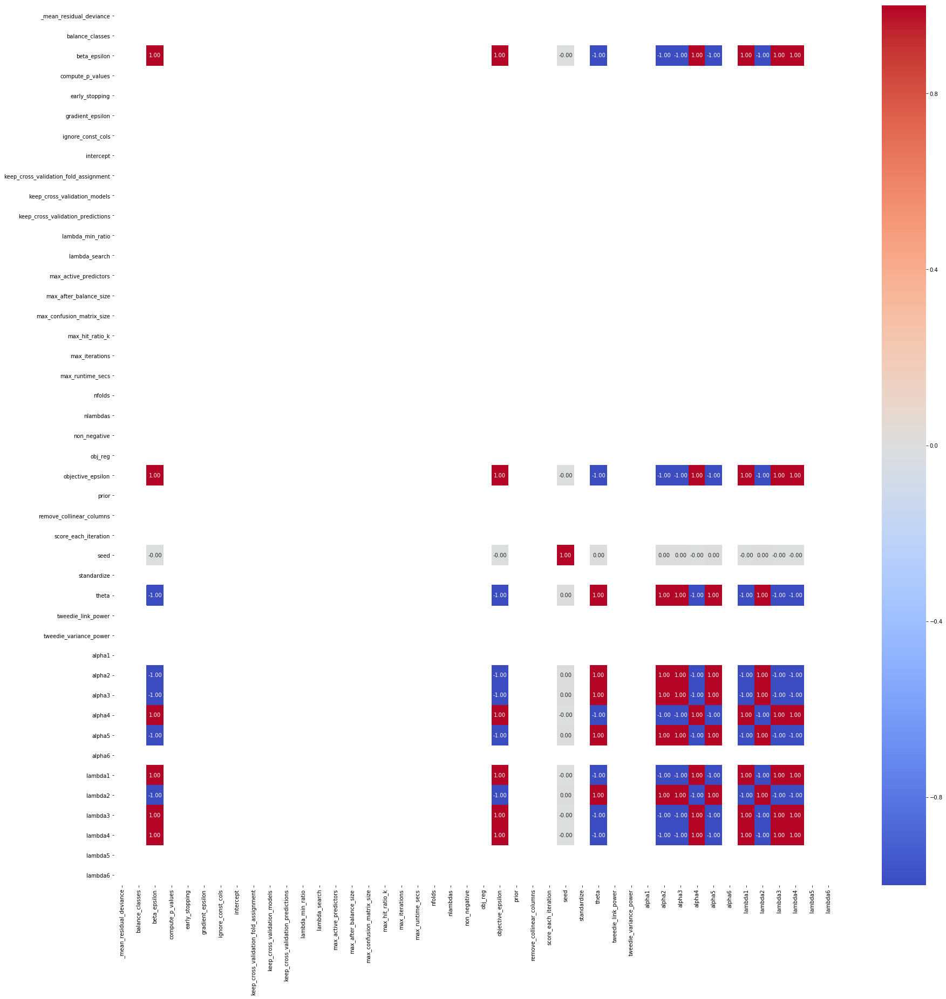

In [988]:
# heatmap to decide which columns are most related to each other
pic_path = re_path + '/Analysis/'+ 'glm_hm.png'
plt.figure(figsize=(30,30))
glm_hm = sns.heatmap(data=df.iloc[:,:].corr(),annot=True,fmt='.2f',cmap='coolwarm')
plt.savefig( pic_path,dpi=200)
plt.show()

In [989]:
df.dtypes

_mean_residual_deviance                  float64
_model_name                               object
alpha                                     object
balance_classes                             bool
beta_epsilon                             float64
compute_p_values                            bool
early_stopping                              bool
family                                    object
fold_assignment                           object
gradient_epsilon                         float64
ignore_const_cols                           bool
intercept                                   bool
keep_cross_validation_fold_assignment       bool
keep_cross_validation_models                bool
keep_cross_validation_predictions           bool
lambda                                    object
lambda_min_ratio                         float64
lambda_search                               bool
link                                      object
max_active_predictors                      int64
max_after_balance_si

In [990]:
# get the column list wihout model_name, so we can calculate the range of the parameters
con_list = df.drop([
    '_model_name',  
], axis = 1)
con_list  = con_list.columns.values.tolist()
print(len(con_list))
con_list

51


['_mean_residual_deviance',
 'alpha',
 'balance_classes',
 'beta_epsilon',
 'compute_p_values',
 'early_stopping',
 'family',
 'fold_assignment',
 'gradient_epsilon',
 'ignore_const_cols',
 'intercept',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'lambda',
 'lambda_min_ratio',
 'lambda_search',
 'link',
 'max_active_predictors',
 'max_after_balance_size',
 'max_confusion_matrix_size',
 'max_hit_ratio_k',
 'max_iterations',
 'max_runtime_secs',
 'missing_values_handling',
 'nfolds',
 'nlambdas',
 'non_negative',
 'obj_reg',
 'objective_epsilon',
 'prior',
 'remove_collinear_columns',
 'score_each_iteration',
 'seed',
 'solver',
 'standardize',
 'theta',
 'tweedie_link_power',
 'tweedie_variance_power',
 'alpha1',
 'alpha2',
 'alpha3',
 'alpha4',
 'alpha5',
 'alpha6',
 'lambda1',
 'lambda2',
 'lambda3',
 'lambda4',
 'lambda5',
 'lambda6']

In [991]:
# get the max and min value of each columns
range_max = []
range_min = []
for i in con_list:
    print(i)
    max = df[i].max()
    min = df[i].min()
    range_max.append(max)
    range_min.append(min)
    print(max, min)

print(len(range_max))
print (range_max)

_mean_residual_deviance
9.866533710547211e+16 9.866533710547211e+16
alpha
[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0] [0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]
balance_classes
False False
beta_epsilon
0.0001 0.0001
compute_p_values
False False
early_stopping
True True
family
gaussian gaussian
fold_assignment
Modulo Modulo
gradient_epsilon
1e-06 1e-06
ignore_const_cols
True True
intercept
True True
keep_cross_validation_fold_assignment
False False
keep_cross_validation_models
False False
keep_cross_validation_predictions
True True
lambda
[15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903] [15960969243.255198, 9912032309.071613, 6155539992.510007, 3822694621.8397703, 2373958123.8402534, 1474268214.245903]
lambda_min_ratio
1e-06 1e-06
lambda_search
True True
link
identity identity
max_active_predictors
5000 5000
max_after_balance_size
5.0 5.0
max_confusion_matrix_size
20 20
max_hit_ratio_k
0 0
max_iterations
300 300
m

In [992]:
#put the max and min value data into dataframe
range_df = pd.DataFrame (columns =con_list)
range_df.loc['max'] = range_max
range_df.loc['min'] = range_min
range_df

,_mean_residual_deviance,alpha,balance_classes,beta_epsilon,compute_p_values,early_stopping,family,fold_assignment,gradient_epsilon,ignore_const_cols,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
max,98665337105472112.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,8910322714045525139,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
min,98665337105472112.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-4880951606538223235,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590


In [993]:
ran_list  = range_df.columns.values.tolist()
ran_list

['_mean_residual_deviance',
 'alpha',
 'balance_classes',
 'beta_epsilon',
 'compute_p_values',
 'early_stopping',
 'family',
 'fold_assignment',
 'gradient_epsilon',
 'ignore_const_cols',
 'intercept',
 'keep_cross_validation_fold_assignment',
 'keep_cross_validation_models',
 'keep_cross_validation_predictions',
 'lambda',
 'lambda_min_ratio',
 'lambda_search',
 'link',
 'max_active_predictors',
 'max_after_balance_size',
 'max_confusion_matrix_size',
 'max_hit_ratio_k',
 'max_iterations',
 'max_runtime_secs',
 'missing_values_handling',
 'nfolds',
 'nlambdas',
 'non_negative',
 'obj_reg',
 'objective_epsilon',
 'prior',
 'remove_collinear_columns',
 'score_each_iteration',
 'seed',
 'solver',
 'standardize',
 'theta',
 'tweedie_link_power',
 'tweedie_variance_power',
 'alpha1',
 'alpha2',
 'alpha3',
 'alpha4',
 'alpha5',
 'alpha6',
 'lambda1',
 'lambda2',
 'lambda3',
 'lambda4',
 'lambda5',
 'lambda6']

In [994]:
glm = [glm_ms[0]]
df_def = json_to_df(glm_path, glm)

GLM_grid_1_AutoML_20190425_061247_model_1


In [995]:
df_def

,_mean_residual_deviance,_model_name,alpha,balance_classes,beta_constraints,beta_epsilon,class_sampling_factors,compute_p_values,custom_metric_func,early_stopping,export_checkpoints_dir,family,fold_assignment,fold_column,gradient_epsilon,ignore_const_cols,interaction_pairs,interactions,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,model_IDalpha,model_IDbalance_classes,model_IDbeta_constraints,model_IDbeta_epsilon,model_IDclass_sampling_factors,model_IDcompute_p_values,model_IDcustom_metric_func,model_IDearly_stopping,model_IDexport_checkpoints_dir,model_IDfamily,model_IDfold_assignment,model_IDfold_column,model_IDgradient_epsilon,model_IDignore_const_cols,model_IDignored_columns,model_IDinteraction_pairs,model_IDinteractions,model_IDintercept,model_IDkeep_cross_validation_fold_assignment,model_IDkeep_cross_validation_models,model_IDkeep_cross_validation_predictions,model_IDlambda,model_IDlambda_min_ratio,model_IDlambda_search,model_IDlink,model_IDmax_active_predictors,model_IDmax_after_balance_size,model_IDmax_confusion_matrix_size,model_IDmax_hit_ratio_k,model_IDmax_iterations,model_IDmax_runtime_secs,model_IDmissing_values_handling,model_IDmodel_id,model_IDnfolds,model_IDnlambdas,model_IDnon_negative,model_IDobj_reg,model_IDobjective_epsilon,model_IDoffset_column,model_IDprior,model_IDremove_collinear_columns,model_IDresponse_column,model_IDscore_each_iteration,model_IDseed,model_IDsolver,model_IDstandardize,model_IDtheta,model_IDtraining_frame,model_IDtweedie_link_power,model_IDtweedie_variance_power,model_IDvalidation_frame,model_IDweights_column,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,offset_column,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,weights_column
0,98665337105472112.00000,GLM_grid_1_AutoML_20190425_061247_model_1,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,None,0.00010,None,False,None,True,None,gaussian,Modulo,None,0.00000,True,None,None,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,30,False,0.00013,0.00010,None,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,None


In [996]:
default = pd.DataFrame(df_def,columns = ran_list)
default.index = ['default']
default['_mean_residual_deviance'] = [0]
default

,_mean_residual_deviance,alpha,balance_classes,beta_epsilon,compute_p_values,early_stopping,family,fold_assignment,gradient_epsilon,ignore_const_cols,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
default,0,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [997]:
range_df = pd.concat([default,range_df])
range_df

,_mean_residual_deviance,alpha,balance_classes,beta_epsilon,compute_p_values,early_stopping,family,fold_assignment,gradient_epsilon,ignore_const_cols,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
default,0.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
max,98665337105472112.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,8910322714045525139,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
min,98665337105472112.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-4880951606538223235,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590


In [998]:
# export the dataframe into csv
range_path = re_path + '/Analysis/'+ 'glm_range.csv'
range_df.to_csv(range_path,sep=',')

# Analysis of the hyperparameter 
I collect all the parameters of the models whose runtime is 2000 seconds,which generate the most amount of the models

## XRT Model

- XRT heatmap 
![xrt](results/Analysis/xrt_hm.png)

- Range of the hyperparameters of XRT model

In [939]:
range_path = re_path + '/Analysis/'+ 'xrt_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
0,max,26483232090218256.00000,AUTO,gaussian,Modulo,Random,35,8348626130045625785,deviance,0.01161
1,min,24821773831486484.00000,AUTO,gaussian,Modulo,Random,13,-5061120222178819186,deviance,0.01161


#### Conclusion
- From the heatmap, the 'seed' is the most important hyperparameter of XRT model, and  its range is 13 to 35. 
- And from the table, we can tell the best value of _mean_residual_deviance in XRT model is 24821773831486484.

## DRF Model

- DRF heatmap 
![drf](results/Analysis/drf_hm.png)

- Range of the hyperparameters of DRF model

In [942]:
range_path = re_path + '/Analysis/'+ 'drf_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,categorical_encoding,distribution,fold_assignment,histogram_type,ntrees,seed,stopping_metric,stopping_tolerance
0,max,27701369652351192.00000,AUTO,gaussian,Modulo,AUTO,29,7991581400575865866,deviance,0.01161
1,min,24849988548945272.00000,AUTO,gaussian,Modulo,AUTO,12,-4477005182244811168,deviance,0.01161


#### Conclusion
- From the heatmap, the 'ntrees' is the most important hyperparameter of DRF model, and  its range is 12 to 29, and the second important hyperparameter is 'seed'whose range is 4477005182244811168 to 7991581400575865866.
- And from the table, we can tell the best value of _mean_residual_deviance in DRF model is 24849988548945272.

## XGB Model

- XGB heatmap 
![xgb](results/Analysis/xgb_hm.png)

- Range of the hyperparameters of XGB model

In [943]:
range_path = re_path + '/Analysis/'+ 'xgb_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,backend,booster,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,dmatrix_type,eta,fold_assignment,grow_policy,learn_rate,max_depth,min_rows,normalize_type,ntrees,reg_alpha,reg_lambda,sample_rate,sample_type,seed,stopping_metric,stopping_tolerance,tree_method
0,max,215990325033176512.00000,auto,gbtree,AUTO,1.00000,1.00000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,20,20.00000,tree,342,1.00000,100.00000,1.00000,uniform,9029067611563076446,deviance,0.01161,auto
1,min,23382607125691124.00000,auto,dart,AUTO,0.60000,0.70000,AUTO,auto,0.30000,Modulo,depthwise,0.05000,5,0.01000,tree,2,0.00000,0.00100,0.60000,uniform,-9085632511738749858,deviance,0.01161,auto


#### Conclusion
- From the heatmap, the 'reg_lambda' is the most important hyperparameter of XGB model, and  its range is 0.001 to 100, and the second important hyperparameter is 'booster' whose value is gbtree or dart. And another importatnt hyperparameter is 'ntrees' whose range is 2 to 342.
- And from the table, we can tell the best value of _mean_residual_deviance in XGB model is 23382607125691124.

## DL Model
- DL heatmap 
![dl](results/Analysis/dl_hm.png)
- Range of the hyperparameters of DL model

In [971]:
range_path = re_path + '/Analysis/'+ 'dl_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,activation,categorical_encoding,distribution,elastic_averaging_moving_rate,elastic_averaging_regularization,epochs,epsilon,fold_assignment,huber_alpha,initial_weight_distribution,input_dropout_ratio,loss,max_w2,missing_values_handling,rate,rate_annealing,regression_stop,rho,score_duty_cycle,score_validation_sampling,seed,stopping_metric,stopping_tolerance,target_ratio_comm_to_comp,hidden1,hidden2,hidden3,hidden_ratios1,hidden_ratios2,hidden_ratios3
0,max,56204217974007896.00000,RectifierWithDropout,AUTO,AUTO,0.90000,0.00100,529.60000,0.00000,Modulo,0.90000,UniformAdaptive,0.20000,Automatic,340282350000000067312652469695756107776.00000,MeanImputation,0.00500,0.00000,0.00000,0.99000,0.10000,Uniform,9094407270751128389,deviance,0.01161,0.05000,500,500,500,0.50000,0.50000,0.50000
1,min,30167347574307860.00000,Rectifier,AUTO,AUTO,0.90000,0.00100,0.65849,0.00000,Modulo,0.90000,UniformAdaptive,0.00000,Automatic,340282350000000067312652469695756107776.00000,MeanImputation,0.00500,0.00000,0.00000,0.90000,0.10000,Uniform,-9022752228871362374,deviance,0.01161,0.05000,10,0,0,0.00000,0.00000,0.00000


#### Conclusion
- From the heatmap, the important hyperparameters are input_dropout_ratio (0 to 0.2), activation(RectifierWithDropout or Rectifier), hidden([0,0,0] to [500, 500, 500]), hidden_ratios([0,0,0] to [0.5, 0.5, 0.5]).

- And from the table, we can tell the best value of _mean_residual_deviance in DL model is 30167347574307860.

## GBM Model
- GBM heatmap 
![gbm](results/Analysis/gbm_hm.png)
- Range of the hyperparameters of GBM model

In [970]:
range_path = re_path + '/Analysis/'+ 'gbm_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,categorical_encoding,col_sample_rate,col_sample_rate_per_tree,distribution,fold_assignment,histogram_type,huber_alpha,learn_rate,max_depth,min_rows,min_split_improvement,ntrees,sample_rate,seed,stopping_metric,stopping_tolerance
0,max,98531673008743552.00000,AUTO,1.00000,1.00000,gaussian,Modulo,AUTO,0.90000,0.80000,17,100.00000,0.00010,739,1.00000,9209026673105970395,deviance,0.01161
1,min,23462039486604648.00000,AUTO,0.40000,0.40000,gaussian,Modulo,AUTO,0.90000,0.00100,3,1.00000,0.00001,1,0.50000,-9111061617578221222,deviance,0.01161


#### Conclusion
- From the heatmap, the important hyperparameters of GBM model are max_depth (3 to 17), learn_rate(0.001 to 0.8), sample_rate (0.5 to 1), ntrees(1 to 739), min_rows(1 to 100).

- And from the table, we can tell the best value of _mean_residual_deviance in GBM model is 23462039486604648.

## GLM Model
- GLM heatmap 
![glm](results/Analysis/glm_hm.png)
- Range of the hyperparameters of GLM model

In [999]:
range_path = re_path + '/Analysis/'+ 'glm_range.csv'
pd.read_csv(range_path)

,Unnamed: 0,_mean_residual_deviance,alpha,balance_classes,beta_epsilon,compute_p_values,early_stopping,family,fold_assignment,gradient_epsilon,ignore_const_cols,intercept,keep_cross_validation_fold_assignment,keep_cross_validation_models,keep_cross_validation_predictions,lambda,lambda_min_ratio,lambda_search,link,max_active_predictors,max_after_balance_size,max_confusion_matrix_size,max_hit_ratio_k,max_iterations,max_runtime_secs,missing_values_handling,nfolds,nlambdas,non_negative,obj_reg,objective_epsilon,prior,remove_collinear_columns,score_each_iteration,seed,solver,standardize,theta,tweedie_link_power,tweedie_variance_power,alpha1,alpha2,alpha3,alpha4,alpha5,alpha6,lambda1,lambda2,lambda3,lambda4,lambda5,lambda6
0,default,0.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-2252716009947965509,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
1,max,98665337105472128.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,8910322714045525139,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590
2,min,98665337105472128.00000,"[0.0, 0.2, 0.4, 0.6000000000000001, 0.8, 1.0]",False,0.00010,False,True,gaussian,Modulo,0.00000,True,True,False,False,True,"[15960969243.255198, 9912032309.071613, 615553...",0.00000,True,identity,5000,5.00000,20,0,300,0.00000,MeanImputation,5,30,False,0.00013,0.00010,-1.00000,False,False,-4880951606538223235,COORDINATE_DESCENT,True,0.00000,1.00000,0.00000,0.00000,0.20000,0.40000,0.60000,0.80000,1.00000,15960969243.25520,9912032309.07161,6155539992.51001,3822694621.83977,2373958123.84025,1474268214.24590


#### Conclusion
- From the heatmap, there isn't any difference in _mean_residual_deviance. So there can't find any relationship between _mean_residual_deviance and other variables. Therefore, I put the default value in the table, and from the table, only 'seed' ( -4880951606538223235 to 8910322714045525139) is changing, but the value of _mean_residual_deviance doesn't changing at all.

- And from the table, we can tell the best value of _mean_residual_deviance in GLM model is 98665337105472128.

# Conclusion of the model and hyperparameters
- From all the tables of hyperparameter from different models, the minimum _mean_residual_deviance which means the best model is XGB model.

- For the common hyperparameter 'seed', in model other than GLM model, it does impact the model, but in GLM model, even the range of the 'seed' is huge, but the model doesn't change at all.


# Contributions 
- Hsiang-Hua Chen : 20% from the website, 80% created by myself

# Citations
-  https://www.w3schools.com/python/
-  https://h2o-release.s3.amazonaws.com/h2o/rel-vajda/1/docs-website/h2o-docs/grid-search.html
-  https://github.com/nikbearbrown/INFO_6105
-  https://github.com/nikbearbrown/H2O_Workshop 
-  https://towardsdatascience.com/what-are-hyperparameters-and-how-to-tune-the-hyperparameters-in-a-deep-neural-network-d0604917584a

# License
Copyright (c) 2019 Hsiang-Hua Chen <br>

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:<br>

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.<br>

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.